# BNP Project 2025

## Importation des données sur les 10 dernières années


Extraction des données equity et changes sur yahoo finance

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
from scipy import stats
from datetime import datetime

# Générer la date d'aujourd'hui sous le format '2014-01-01'
today = datetime.today().strftime('%Y-%m-%d')
before10=(datetime.today()-pd.DateOffset(years=10)).strftime('%Y-%m-%d')

sp500_data = yf.download('^GSPC', start=before10, end=today, progress=False)
sp500_data.columns = sp500_data.columns.droplevel(1)
sx5e_data = yf.download('^STOXX50E', start=before10, end=today, progress=False)
sx5e_data.columns = sx5e_data.columns.droplevel(1)
EURUSD_data = yf.download('EURUSD=X', start = before10, end = today, progress = False)
EURUSD_data.columns = EURUSD_data.columns.droplevel(1)

In [ ]:

# Garder que la colonne Adjusted close et mettre les dates au bon format
sp500_data['sp500'] = sp500_data['Adj Close']
sp500_data.index = sp500_data.index.strftime('%Y-%m-%d')
sp500_data = sp500_data.drop(columns = ['Open', 'Close', 'High', 'Low', 'Volume', 'Adj Close'])

sx5e_data['Eurostock'] = sx5e_data['Adj Close']
sx5e_data.index = sx5e_data.index.strftime('%Y-%m-%d')
sx5e_data = sx5e_data.drop(columns = ['Open', 'Close', 'High', 'Low', 'Volume', 'Adj Close'])

EURUSD_data['EURUSD'] = EURUSD_data['Adj Close']
EURUSD_data.index = EURUSD_data.index.strftime('%Y-%m-%d')
EURUSD_data = EURUSD_data.drop(columns = ['Open', 'Close', 'High', 'Low', 'Volume', 'Adj Close'])

KeyError: 'Adj Close'

Extraction de la surface de taux EUR depuis l'API de la BCE

In [ ]:
import requests
import json
import pandas as pd
import io

date_format = '%Y-%m-%d'

DATAFLOW = "YC"
FREQ = "B"  # Daily - businessweek
REF_AREA = "U2"  # Euro area (changing composition)
CURRENCY = "EUR"
PROVIDER_FM = "4F"  # ECB
INSTRUMENT_FM = "G_N_C"  # Government bond, nominal, all issuers whose rating is triple A
PROVIDER_FM_ID = "SV_C_YM"  # Svensson model - continuous compounding - yield error minimisation
DATA_TYPE_FM = "SR_3M+SR_6M+SR_1Y+SR_2Y+SR_3Y+SR_4Y+SR_5Y+SR_6Y+SR_7Y+SR_10Y+SR_15Y+SR_20Y+SR_25Y+SR_30Y"


url = f"https://data-api.ecb.europa.eu/service/data/{DATAFLOW}/{FREQ}.{REF_AREA}.{CURRENCY}.{PROVIDER_FM}.{INSTRUMENT_FM}.{PROVIDER_FM_ID}.{DATA_TYPE_FM}"

response = requests.get(url, headers={'Accept': 'text/csv'})
response.raise_for_status()
df = pd.read_csv(io.StringIO(response.text), parse_dates=['TIME_PERIOD'], index_col=['TIME_PERIOD'])

In [ ]:
surfaceEUR = df[["KEY", "OBS_VALUE"]].pivot(columns="KEY", values="OBS_VALUE")
surfaceEUR.rename(columns=lambda x: x.split('_')[-1], inplace=True)
surfaceEUR = surfaceEUR[["3M","1Y","5Y","10Y","30Y"]]
surfaceEUR.index = surfaceEUR.index.strftime(date_format)
#surfaceEUR.index.names = ['Date']
surfaceEUR.head()

KEY,3M,1Y,5Y,10Y,30Y
TIME_PERIOD,,,,,
2004-09-06,2.001665,2.297177,3.483732,4.262767,5.056951
2004-09-07,2.009089,2.325058,3.507232,4.260667,5.048499
2004-09-08,2.014613,2.343190,3.537117,4.280397,5.048763
2004-09-09,2.010833,2.306193,3.458998,4.215735,5.008323
2004-09-10,2.006281,2.270257,3.399440,4.175095,4.979773


Extraction de la surface de taux USD depuis l'API de la FRED

In [ ]:
pip install fredapi

In [ ]:
from fredapi import Fred
import matplotlib.pyplot as plt
import datetime


fred = Fred(api_key='539eb692aa5fe7f6b14e6ac8891de230')

# Les séries de données FRED pour les taux d'intérêt des obligations américaines
series_ids = {
    "3M": "DGS3MO",
    "1Y": "DGS1",
    "5Y": "DGS5",
    "10Y": "DGS10",
    "30Y": "DGS30"
}


start_date = datetime.datetime(2014, 1, 1)
end_date = datetime.datetime(2024, 10, 10)

data = {}
for maturity, series_id in series_ids.items():
    data[maturity] = fred.get_series(series_id, start_date, end_date)

# Convertir les données en DataFrame pandas
surfaceUSD = pd.DataFrame(data)

In [ ]:
surfaceUSD.head()

,3M,1Y,5Y,10Y,30Y
2014-01-01,NaN,NaN,NaN,NaN,NaN
2014-01-02,0.07,0.13,1.72,3.00,3.92
2014-01-03,0.07,0.13,1.73,3.01,3.93
2014-01-06,0.05,0.12,1.70,2.98,3.90
2014-01-07,0.04,0.13,1.69,2.96,3.88


On récupère la courbe de taux interbanciare USD que l'on prolonge avec les taux "Market Yield on U.S. Treasury Securities at X-Year Constant Maturity, Quoted on an Investment Basis"

## Créer un seul dataframe



In [ ]:
# Renommer les colonnes des dataframes sur les taux :
surfaceEUR = surfaceEUR.rename(columns={'3M' : '3M_EUR', '1Y' : '1Y_EUR', '5Y' : '5Y_EUR', '10Y' : '10Y_EUR', '30Y' : '30Y_EUR'})
surfaceUSD = surfaceUSD.rename(columns={'3M' : '3M_USD', '1Y' : '1Y_USD', '5Y' : '5Y_USD', '10Y' : '10Y_USD', '30Y' : '30Y_USD'})

# Bien mettre toutes les dates au même format :
date_format = '%Y-%m-%d'
surfaceEUR.index = pd.to_datetime(surfaceEUR.index).strftime(date_format)
surfaceUSD.index = pd.to_datetime(surfaceUSD.index).strftime(date_format)

# Concaténer toutes les dataframes
df_assets = pd.concat([sp500_data, sx5e_data, EURUSD_data, surfaceEUR, surfaceUSD], axis = 1)
df_assets

,sp500,Eurostock,EURUSD,3M_EUR,1Y_EUR,5Y_EUR,10Y_EUR,30Y_EUR,3M_USD,1Y_USD,5Y_USD,10Y_USD,30Y_USD
2014-12-16,1972.739990,3049.989990,1.244354,0.088112,0.209965,0.555171,1.323670,2.447191,0.03,0.21,1.53,2.07,2.69
2014-12-17,2012.890015,3051.989990,1.251204,0.082345,0.198034,0.542506,1.301603,2.440710,0.03,0.23,1.61,2.14,2.74
2014-12-18,2061.229980,3153.770020,1.233898,0.072874,0.168003,0.510324,1.302845,2.469592,0.04,0.25,1.68,2.22,2.82
2014-12-19,2070.649902,3141.280029,1.229045,0.069741,0.162027,0.505773,1.295084,2.478571,0.04,0.26,1.66,2.17,2.77
2014-12-22,2078.540039,3154.909912,1.222599,0.065330,0.150353,0.492717,1.281414,2.465795,0.05,0.28,1.67,2.17,2.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-15,NaN,NaN,NaN,0.084216,0.201551,0.551121,1.332995,2.502081,0.04,0.22,1.58,2.12,2.74
2014-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-04-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-04-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.04,0.11,1.74,2.73,3.52


In [ ]:
# Enlever les valeurs NAN :
print("Nombre de lignes avant : ", df_assets.shape[0])
df_assets_cleaned = df_assets.dropna()
print("Nombre de lignes après : ", df_assets_cleaned.shape[0])'Adj Close'

Nombre de lignes avant :  5248
Nombre de lignes après :  2385


In [ ]:
def remove_outliers(df):

  '''Retirer les outliers'''

  # Compter le nombre initial de lignes
  initial_rows = len(df)

  # Calcul du Z-scores
  z = np.abs(stats.zscore(df))
  # Create a mask for rows where any value has a Z-score greater than 5
  mask = (z > 5).any(axis=1)
  # Retirer les lignes contenant des outliers
  df_no_outliers = df[~mask]

  # Compter le nombre de lignes après nettoyage
  cleaned_rows = len(df_no_outliers)
  rows_removed = initial_rows - cleaned_rows
  print(f"Outliers supprimées : {rows_removed}")

  return df_no_outliers

In [ ]:
# Enlever les valeurs extremes :
df_assets_cleaned = remove_outliers(df_assets_cleaned)


Outliers supprimées : 0


In [ ]:
df_final = df_assets_cleaned.sort_index(ascending = True)
df_final.tail(6)

,sp500,Eurostock,EURUSD,3M_EUR,1Y_EUR,5Y_EUR,10Y_EUR,30Y_EUR,3M_USD,1Y_USD,5Y_USD,10Y_USD,30Y_USD
2024-10-03,5699.939941,4921.330078,1.104850,3.206288,2.527309,2.372200,2.880195,3.213029,4.68,4.02,3.62,3.85,4.18
2024-10-04,5751.069824,4954.939941,1.103558,3.217464,2.567898,2.429052,2.907183,3.222867,4.73,4.20,3.81,3.98,4.26
2024-10-07,5695.939941,4969.709961,1.097454,3.232956,2.617741,2.487713,2.950429,3.258812,4.77,4.24,3.86,4.03,4.30
2024-10-08,5751.129883,4949.000000,1.097574,3.229102,2.631851,2.503515,2.960949,3.296522,4.75,4.21,3.86,4.04,4.32
2024-10-09,5792.040039,4982.569824,1.097574,3.222835,2.640654,2.498057,2.963837,3.276141,4.75,4.24,3.91,4.06,4.34
2024-10-10,5780.049805,4970.339844,1.094331,3.203645,2.655097,2.498995,2.964290,3.279523,4.75,4.22,3.91,4.09,4.38


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
file_path = '/content/drive/MyDrive/SharedData/data_assets.csv' # Lien pour drive Matthieu
#file_path = '/content/drive/MyDrive/DDEFI/data_assets.csv' # Lien pour drive Léo

df_final.to_csv(file_path)

## Matrice de shock

Extraction données les plus récentes et conversion en variation

In [ ]:
donnee_actuelle = df_final.tail(1)
print(donnee_actuelle)

                  sp500    Eurostock    EURUSD    3M_EUR    1Y_EUR    5Y_EUR  \
2024-10-10  5780.049805  4970.339844  1.094331  3.203645  2.655097  2.498995   

            10Y_EUR   30Y_EUR  3M_USD  1Y_USD  5Y_USD  10Y_USD  30Y_USD  
2024-10-10  2.96429  3.279523    4.75    4.22    3.91     4.09     4.38  


In [ ]:
df_final_stock_ren = df_final[['sp500', 'Eurostock', 'EURUSD']].pct_change()
df_final_stock_ren.head()


,sp500,Eurostock,EURUSD
2014-12-16,NaN,NaN,NaN
2014-12-17,0.020352,0.000656,0.005505
2014-12-18,0.024015,0.033349,-0.013832
2014-12-19,0.004570,-0.003960,-0.003933
2014-12-22,0.003810,0.004339,-0.005245


In [ ]:
df_final_taux_ren = df_final[['3M_EUR', '1Y_EUR', '5Y_EUR', '10Y_EUR', '30Y_EUR', '3M_USD', '1Y_USD',	'5Y_USD',	'10Y_USD','30Y_USD']] - df_final[['3M_EUR', '1Y_EUR', '5Y_EUR', '10Y_EUR', '30Y_EUR', '3M_USD', '1Y_USD',	'5Y_USD',	'10Y_USD',	'30Y_USD']].shift(1)
df_final_taux_ren.head()

,3M_EUR,1Y_EUR,5Y_EUR,10Y_EUR,30Y_EUR,3M_USD,1Y_USD,5Y_USD,10Y_USD,30Y_USD
2014-12-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-12-17,-0.005767,-0.011931,-0.012665,-0.022066,-0.006481,0.00,0.02,0.08,0.07,0.05
2014-12-18,-0.009471,-0.030031,-0.032182,0.001242,0.028882,0.01,0.02,0.07,0.08,0.08
2014-12-19,-0.003133,-0.005977,-0.004551,-0.007761,0.008979,0.00,0.01,-0.02,-0.05,-0.05
2014-12-22,-0.004411,-0.011673,-0.013056,-0.013670,-0.012776,0.01,0.02,0.01,0.00,-0.02


In [ ]:
df_final_ren = pd.concat([df_final_stock_ren, df_final_taux_ren], axis = 1).dropna()
df_final_ren = df_final_ren.sort_index(ascending = True)
df_final_ren.head()

,sp500,Eurostock,EURUSD,3M_EUR,1Y_EUR,5Y_EUR,10Y_EUR,30Y_EUR,3M_USD,1Y_USD,5Y_USD,10Y_USD,30Y_USD
2014-12-17,0.020352,0.000656,0.005505,-0.005767,-0.011931,-0.012665,-0.022066,-0.006481,0.00,0.02,0.08,0.07,0.05
2014-12-18,0.024015,0.033349,-0.013832,-0.009471,-0.030031,-0.032182,0.001242,0.028882,0.01,0.02,0.07,0.08,0.08
2014-12-19,0.004570,-0.003960,-0.003933,-0.003133,-0.005977,-0.004551,-0.007761,0.008979,0.00,0.01,-0.02,-0.05,-0.05
2014-12-22,0.003810,0.004339,-0.005245,-0.004411,-0.011673,-0.013056,-0.013670,-0.012776,0.01,0.02,0.01,0.00,-0.02
2014-12-23,0.001746,0.011905,-0.000183,-0.006188,-0.014520,-0.005903,-0.008164,-0.012046,-0.02,-0.02,0.09,0.09,0.10


In [ ]:
file_path = '/content/drive/MyDrive/SharedData/data_assets_ren.csv' # Lien pour drive Matthieu
# file_path = '/content/drive/MyDrive/DDEFI/data_assets_ren.csv' # Lien pour drive Léo

df_final_ren.to_csv(file_path)

In [ ]:
def calcul_shock(df_ren, df_valeurs):

  stocks_actu = df_valeurs[['sp500', 'Eurostock','EURUSD']].values
  taux_actu = df_valeurs[['3M_EUR', '1Y_EUR', '5Y_EUR', '10Y_EUR', '30Y_EUR', '3M_USD', '1Y_USD',	'5Y_USD',	'10Y_USD','30Y_USD']].values

  # Calcul shock pour s&p Eurstock et Eurusd
  df_shock_stock = (1 + df_ren[['sp500', 'Eurostock', 'EURUSD']])*stocks_actu
  df_shock_stock = df_shock_stock.reset_index(drop=True)

  #Calcul shock pour les taux
  df_shock_taux = df_ren[['3M_EUR', '1Y_EUR', '5Y_EUR', '10Y_EUR', '30Y_EUR', '3M_USD', '1Y_USD',	'5Y_USD',	'10Y_USD','30Y_USD']] + taux_actu
  df_shock_taux = df_shock_taux.reset_index(drop=True)

  df_shock_1 = pd.concat([df_shock_stock, df_shock_taux], axis = 1)
  return df_shock_1013356096699782

In [ ]:
import numpy as np
# Ici la matrice de shock prendra la forme d'un array de 3 dimension 1000*13*5 (nombre de scenarios)*(nombre asset)*(nombre de jours)
SHOCKS = []
days = 5
for d in range(1, days+1):
  df_boot = df_final_ren.sample(1000, replace = True)
  if d == 1:
    df_shock = calcul_shock(df_boot, donnee_actuelle)
    array_shock = df_shock.to_numpy()
    SHOCKS.append(array_shock)
  else:013356096699782py()
    SHOCKS.append(array_shock)
array_shocks = np.stack(SHOCKS, axis = -1)

In [ ]:
i = 0
dict_names = {}
for name in df_final.columns:
  dict_names[name] = i
  i += 1
print(df_final.columns)

Index(['sp500', 'Eurostock', 'EURUSD', '3M_EUR', '1Y_EUR', '5Y_EUR', '10Y_EUR',
       '30Y_EUR', '3M_USD', '1Y_USD', '5Y_USD', '10Y_USD', '30Y_USD'],
      dtype='object')


## Plotter les scenarios

In [ ]:
# Utilisation de la librarie plotly pour créer un graph interractif
# https://plotly.com/python/range-slider/
xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True),
        type="date"
    )


In [ ]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from datetime import datetime, timedelta

def plots(asset,  number_scenarios, df_values, array_shock, start_jour):
  '''013356096699782
  asset = nom de l'asset dont on veut tracer les scenarios
  number_scenarios = nombre de scenarios que l'on veut tracer, il prendra les "n" premiers
  df_values = prix historique de l'asset
  array_shock = matrice des shocks générés par bootstrap013356096699782

In [ ]:
plots("sp500",  50, df_final, array_shocks, 0)

In [ ]:
plots("sp500",  50, df_final, array_shocks, 20)

In [ ]:
plots("3M_EUR",  50, df_final, array_shocks, 0)

In [ ]:
plots("3M_EUR",  50, df_final, array_shocks, 20)

In [ ]:
plots("3M_USD",  100, df_final, array_shocks, 0)

In [ ]:
plots("3M_USD",  50, df_final, array_shocks, 20)

# Auto encodeur


In [ ]:
import numpy as np
import pandas as pd
import yfinance as yf
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, InputLayer
from tensorflow.keras.utils import plot_model
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras import backend as K
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy.stats import wasserstein_distance
import seaborn as sns
from pandas.tseries.holiday import USFederalHolidayCalendar
from pandas.tseries.offsets import CustomBusinessDay

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#file_path = '/content/drive/MyDrive/collab/SharedData/data_assets_ren.csv'
file_path = '/content/drive/MyDrive/SharedData/data_assets_ren.csv'
df_rendements = pd.read_csv(file_path, index_col = 0)
donnees_brutes = df_rendements.values.astype('float32')


In [ ]:
#file_path = '/content/drive/MyDrive/collab/SharedData/data_assets.csv'
file_path = '/content/drive/MyDrive/SharedData/data_assets.csv'
df_prix = pd.read_csv(file_path, index_col = 0)
prix_initiaux = df_prix.head(1)
premier_jour = prix_initiaux.index.values[0]
premier_jour

'2014-11-12'

In [ ]:
nb_jours, nb_actifs = donnees_brutes.shape  # Extraction du nombre de jours et d'actifs
nb_donnees = nb_jours * nb_actifs  # Calcul du nombre total de données

nb_jours_a_sequencer = 20  # Définition du nombre de jours pour la séquence
longueur_sequence = nb_jours_a_sequencer * nb_actifs  # Calcul de la longueur d'une séquence
nb_sequence = nb_donnees//longueur_sequence
reste_a_retirer=nb_donnees % longueur_sequence

msg1 = f'Analyse initiale: {nb_jours} jours et {nb_actifs} actifs, totalisant {nb_donnees} données.\n'
msg2 = f'Chaque séquence de {nb_jours_a_sequencer} jours contient {nb_actifs} données (une par actif), ce qui fait {longueur_sequence} données par séquence. Nous pouvons donc former {nb_sequence} séquences.\n'
msg3 = f'Il y aura {reste_a_retirer} données en surplus, nécessitant une correction pour obtenir un nombre entier de séquences.\n'
msg4 = f'Pour cela, nous devrons retirer {reste_a_retirer // nb_actifs} lignes de données anciennes de "donnees_brutes".\n'

msg_a_lire=msg1+msg2+msg3+msg4

print("Analyse préalable sur le découpage des données pour le réseau de neuronnes:\n")
print(msg_a_lire)

indice_de_retrait = reste_a_retirer // nb_actifs # Retirer les données les plus anciennes pour obtenir un découpage net.


Analyse préalable sur le découpage des données pour le réseau de neuronnes:

Analyse initiale: 2407 jours et 13 actifs, totalisant 31291 données.
Chaque séquence de 20 jours contient 13 données (une par actif), ce qui fait 260 données par séquence. Nous pouvons donc former 120 séquences.
Il y aura 91 données en surplus, nécessitant une correction pour obtenir un nombre entier de séquences.
Pour cela, nous devrons retirer 7 lignes de données anciennes de "donnees_brutes".



In [ ]:
donnees_brutes=donnees_brutes[indice_de_retrait:]

In [ ]:
# Prétraitement des données
# Cette étape est nécessaire pour :
# 1. Normaliser les données pour faciliter l'apprentissage du modèle
# 2. Restructurer et préparer les données dans un format approprié pour l'entrée du modèle

# Normalisez vos données en ajustant et en transformant vos données: elles seront entre 0 et 1 (donc positives)
scaler = MinMaxScaler()
donnees_normalisees = scaler.fit_transform(donnees_brutes) #plus tard, pour récupérer cette forme de données, on utilisera: scaler.inverse_transform(donnees_brutes)

## MinMaxScaler est adapté pour les fonctions d'activation comme ReLU ou Sigmoid, où tu veux que les données soient dans une plage spécifique (comme [0, 1]).

# D'autres possibilités pour "Scaler" des données, par exemple:
## StandardScaler peut être adapté pour les fonctions d'activation comme Tanh ou Sigmoid qui fonctionnent mieux avec des données centrées autour de 0.

donnees_reshaped=donnees_normalisees.reshape(nb_sequence,longueur_sequence)
input_dim = donnees_reshaped.shape[1]

### PARTIE 1: Création de l'autoencodeur (réseau de neurones)

#### A) Architecture

In [ ]:
input_dim=longueur_sequence #nombre de données dans une séquence
input_dim

260

In [ ]:
# Construction d'un modèle AE
modele = Sequential(name="Autoencoder")


# # Ajout des couches 1
# modele.add(InputLayer(input_shape=(input_dim,), name="couche_entree"))  # Couche d'entrée : input_dim neurones pour nos données d'entrée
# modele.add(Dense(int(input_dim/3), activation='relu', name="espace_latent"))
# modele.add(Dense(input_dim, activation='linear', name="couche_sortie"))  # Couche de sortie : input_dim neurones pour la reconstruction avec fonction d'activation spécifiée

# # Ajout des couches 2
# modele.add(InputLayer(input_shape=(input_dim,), name="couche_entree"))  # Couche d'entrée : input_dim neurones pour nos données d'entrée
# modele.add(Dense(int(input_dim/2), activation='relu', name="couche_cachee"))
# modele.add(Dense(int(input_dim/3), activation='relu', name="couche_latente"))
# modele.add(Dense(input_dim, activation='linear', name="couche_sortie"))  # Couche de sortie : input_dim neurones pour la reconstruction avec fonction d'activation spécifiée

# # Ajout des couches 3
# modele.add(InputLayer(input_shape=(input_dim,), name="couche_entree"))  # Couche d'entrée : input_dim neurones pour nos données d'entrée
# modele.add(Dense(int(input_dim/2), activation='relu', name="couche_cachee1"))
# modele.add(Dense(int(input_dim/3), activation='relu', name="couche_latente"))
# modele.add(Dense(int(input_dim/2), activation='relu', name="couche_cachee2"))
# modele.add(Dense(input_dim, activation='linear', name="couche_sortie"))  # Couche de sortie : input_dim neurones pour la reconstruction avec fonction d'activation spécifiée

# Ajout des couches 4
modele.add(InputLayer(input_shape=(input_dim,), name="couche_entree"))  # Couche d'entrée : input_dim neurones pour nos données d'entrée
modele.add(Dense(int(input_dim/2), activation='relu', name="couche_cachee1"))
modele.add(Dense(int(input_dim/4), activation='relu', name="couche_cachee2"))
modele.add(Dense(int(input_dim/8), activation='relu', name="couche_latente"))
modele.add(Dense(int(input_dim/4), activation='relu', name="couche_cachee3"))
modele.add(Dense(int(input_dim/2), activation='relu', name="couche_cachee4"))
modele.add(Dense(input_dim, activation='linear', name="couche_sortie"))  # Couche de sortie : input_dim neurones pour la reconstruction avec fonction d'activation spécifiée

# # Ajout des couches 5
# modele.add(InputLayer(input_shape=(input_dim,), name="couche_entree"))  # Couche d'entrée : input_dim neurones pour nos données d'entrée
# modele.add(Dense(int(input_dim/8), activation='relu', name="couche_latente"))
# modele.add(Dense(input_dim, activation='linear', name="couche_sortie"))  # Couche de sortie : input_dim neurones pour la reconstruction avec fonction d'activation spécifiée

# # Ajout des couches 6
# modele.add(InputLayer(input_shape=(input_dim,), name="couche_entree"))  # Couche d'entrée : input_dim neurones pour nos données d'entrée
# modele.add(Dense(int(input_dim/3), activation='relu', name="couche_cachee1"))
# modele.add(Dense(int(input_dim/6), activation='relu', name="couche_cachee2"))
# modele.add(Dense(int(input_dim/8), activation='relu', name="couche_latente"))
# modele.add(Dense(input_dim, activation='linear', name="couche_sortie"))  # Couche de sortie : input_dim neurones pour la reconstruction avec fonction d'activation spécifiée

# # Ajout des couches 7
# modele.add(InputLayer(input_shape=(input_dim,), name="couche_entree"))  # Couche d'entrée : input_dim neurones pour nos données d'entrée
# modele.add(Dense(int(input_dim/2), activation='relu', name="couche_cachee1"))
# modele.add(Dense(int(input_dim/4), activation='relu', name="couche_cachee2"))
# modele.add(Dense(int(input_dim/8), activation='relu', name="couche_cachee3"))
# modele.add(Dense(int(input_dim/16), activation='relu', name="couche_latente"))
# modele.add(Dense(int(input_dim/8), activation='relu', name="couche_cachee4"))
# modele.add(Dense(int(input_dim/4), activation='relu', name="couche_cachee5"))
# modele.add(Dense(int(input_dim/2), activation='relu', name="couche_cachee6"))
# modele.add(Dense(input_dim, activation='linear', name="couche_sortie"))  # Couche de sortie : input_dim neurones pour la reconstruction avec fonction d'activation spécifiée

# # Ajout des couches 8
# modele.add(InputLayer(input_shape=(input_dim,), name="couche_entree"))  # Couche d'entrée : input_dim neurones pour nos données d'entrée
# modele.add(Dense(int(input_dim/2), activation='sigmoid', name="couche_cachee1"))
# modele.add(Dense(int(input_dim/4), activation='sigmoid', name="couche_cachee2"))
# modele.add(Dense(int(input_dim/8), activation='sigmoid', name="couche_latente"))
# modele.add(Dense(int(input_dim/4), activation='sigmoid', name="couche_cachee3"))
# modele.add(Dense(int(input_dim/2), activation='sigmoid', name="couche_cachee4"))
# modele.add(Dense(input_dim, activation='linear', name="couche_sortie"))  # Couche de sortie : input_dim neurones pour la reconstruction avec fonction d'activation spécifiée


modele.summary()


# Exemples de fonctions d'activation non linéaires: relu, sigmoid, tanh, softmax, softplus, softsign, elu, selu, prelu, thresholded_relu, swish

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "Autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ couche_cachee1 (Dense)               │ (None, 130)                 │          33,930 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ couche_cachee2 (Dense)               │ (None, 65)                  │           8,515 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ couche_latente (Dense)               │ (None, 32)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ couche_cachee3 (Dense)               │ (None, 65)                  │           2,145 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ couche_cachee4 (Dense)               │ (None, 130)                 │           8,580 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ couche_sortie (Dense)                │ (None, 260)                 │          34,060 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 89,342 (348.99 KB)

 Trainable params: 89,342 (348.99 KB)

 Non-trainable params: 0 (0.00 B)

#### B) Compilation

In [ ]:
# Compilation du modèle
modele.compile(optimizer='adam', loss='mean_squared_error')

# Attention, dans la Partie 1, il est possible d'agir sur la manière de normaliser les données.
# Par exemple, au moment du "Scaler" des données:
## MinMaxScaler peut être adapté pour les fonctions d'activation comme ReLU ou Sigmoid, où tu veux que les données soient dans une plage spécifique (comme [0, 1]).
## StandardScaler peut être adapté pour les fonctions d'activation comme Tanh ou Sigmoid qui fonctionnent mieux avec des données centrées autour de 0.

#### C) Entrainement

In [ ]:
#Paramètre pouvant être modifié
notre_taille_de_lot = 32

# Entraînement du modèle
historique = modele.fit(donnees_reshaped, donnees_reshaped, epochs=100, batch_size=notre_taille_de_lot, validation_split=0.2, shuffle=False)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2686 - val_loss: 0.2493
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.2347 - val_loss: 0.1951
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1779 - val_loss: 0.1410
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1285 - val_loss: 0.0976
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0849 - val_loss: 0.0610
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0518 - val_loss: 0.0375
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0308 - val_loss: 0.0247
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0195 - val_loss: 0.0166
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0126 - val_loss: 0.0133
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0096 - val_loss: 0.0111
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0079 - val_loss: 0.0100
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0066 - val_lo

### PARTIE 2: Résultat et Performance

#### A) Visualisation de la perte

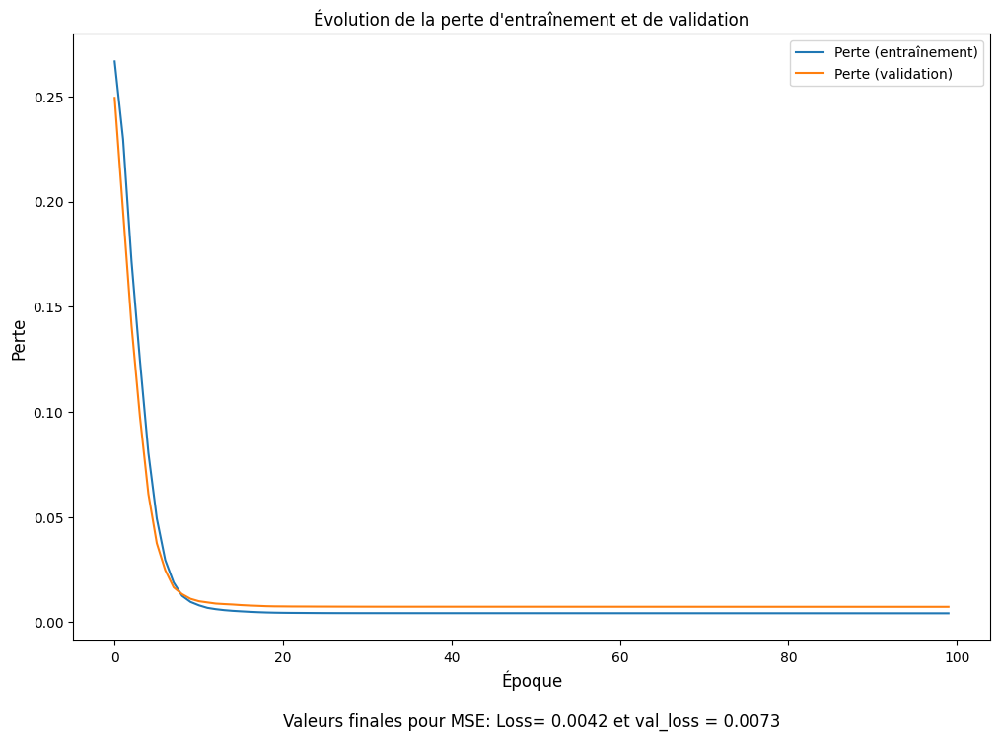

In [ ]:
# Extraction des dernières valeurs de perte
perte=list(pd.DataFrame(historique.history)[['loss','val_loss']].iloc[-1])

# Évolution de l'apprentissage
plt.figure(figsize=(12, 8))
perte=list(pd.DataFrame(historique.history)[['loss','val_loss']].iloc[-1])
plt.plot(historique.history['loss'], label='Perte (entraînement)')
plt.plot(historique.history['val_loss'], label='Perte (validation)')
plt.xlabel("Époque"+ f'\n\nValeurs finales pour MSE: Loss= {perte[0]:.4f} et val_loss = {perte[1]:.4f}', fontsize=12)
plt.ylabel("Perte", fontsize=12)
plt.title("Évolution de la perte d'entraînement et de validation", fontsize=12)
plt.legend()
plt.show()

#### B) Prédiction

In [ ]:
# Obtenir les prédictions sur les données d'entrée
predictions = modele.predict(donnees_reshaped)
# Redimensionner les données pour revenir à leur forme d'origine
donnees_reelles = donnees_reshaped.reshape(-1, nb_actifs)  # nb_actifs : nombre d'actifs dans notre base de données
donnees_predites = predictions.reshape(-1, nb_actifs)

# Ce bloc vise à remettre à l'échelle nos données puis à dénormaliser
donnees_reelles=scaler.inverse_transform(donnees_reelles)
donnees_predites=scaler.inverse_transform(donnees_predites)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


#### C) Recalcul des prix avec nos rendements prédits vs nos rendements réels (A adapter)

In [ ]:
df_rendements.columns

Index(['sp500', 'Eurostock', 'EURUSD', '3M_EUR', '1Y_EUR', '5Y_EUR', '10Y_EUR',
       '30Y_EUR', '3M_USD', '1Y_USD', '5Y_USD', '10Y_USD', '30Y_USD'],
      dtype='object')

In [ ]:
# rendements relatifs
stocks = prix_initiaux[['sp500', 'Eurostock', 'EURUSD']]
prix_predits_re = stocks.values*np.cumprod(donnees_predites[:,:3] + 1, axis=0)
prix_reels_re = stocks.values*np.cumprod(donnees_reelles[:,:3] + 1, axis=0)

# rendements absolut
taux = prix_initiaux[prix_initiaux.columns[~prix_initiaux.columns.isin(['sp500', 'Eurostock', 'EURUSD'])]]
prix_predits_abs = taux.values + np.cumsum(donnees_predites[:,3:] , axis=0)
prix_reels_abs = taux.values + np.cumsum(donnees_reelles[:,3:] , axis=0)

In [ ]:
prix_reels = np.concatenate((prix_reels_re, prix_reels_abs), axis = 1)
prix_predits = np.concatenate((prix_predits_re, prix_predits_abs), axis = 1)

#### D) Visualisation des prédictions

In [ ]:
numero_actif = 9  # Numéro de l'actif à visualiser (0: premier actif, 1: second actif, etc)

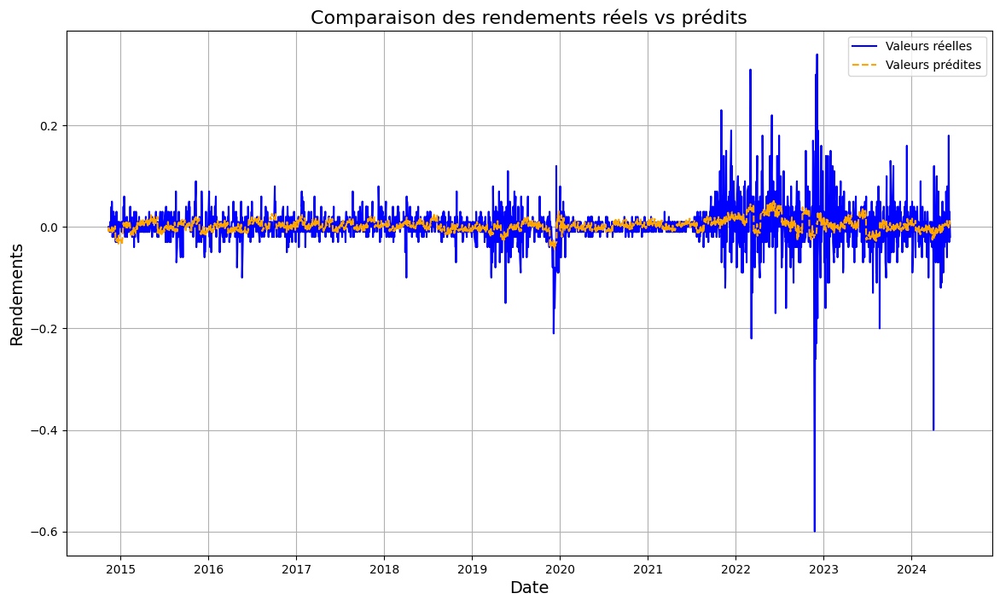

In [ ]:
# Extraire les séries temporelles pour l'actif numéro i
reel_actif = donnees_reelles[:, numero_actif]  # Colonne correspondant au numéro de l'actif pour le premier actif
pred_actif = donnees_predites[:, numero_actif]  # Colonne correspondant au numéro de l'actif pour les prédictions


# Créer un calendrier de jours ouvrés personnalisé
us_business_day = CustomBusinessDay(calendar=USFederalHolidayCalendar())
date_index = pd.date_range(start=premier_jour, periods=len(reel_actif), freq=us_business_day) #premier_jour : date de vos prix initiaux

# Tracer les courbes des valeurs réelles et prédites pour le premier actif
plt.figure(figsize=(14, 8))
plt.plot(date_index,reel_actif, label='Valeurs réelles', color='blue')
plt.plot(date_index,pred_actif, label='Valeurs prédites', color='orange', linestyle='--')
plt.title("Comparaison des rendements réels vs prédits", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Rendements", fontsize=14)
plt.legend()
plt.grid(True)

# Affichage du graphique
plt.show()

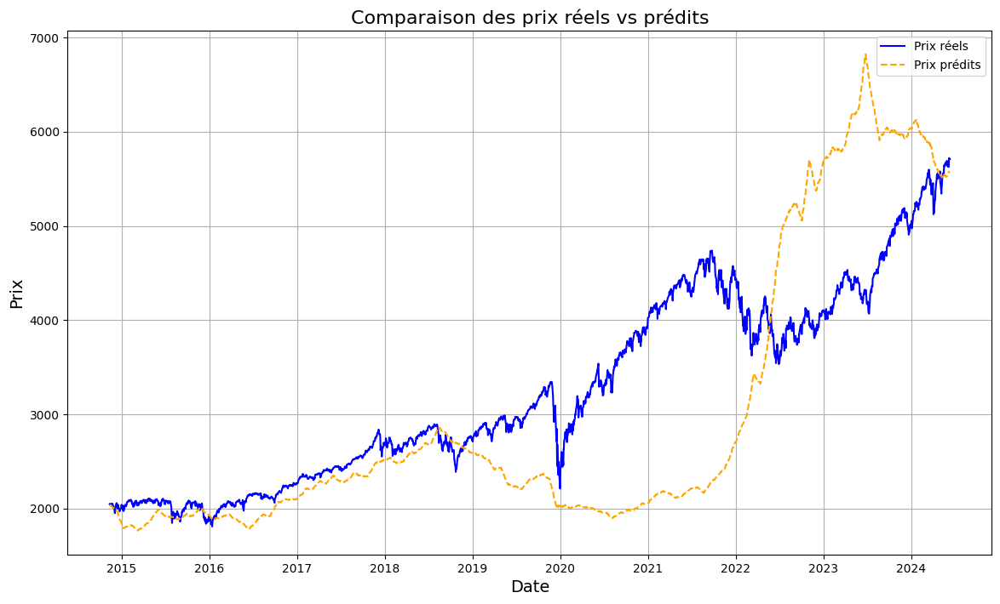

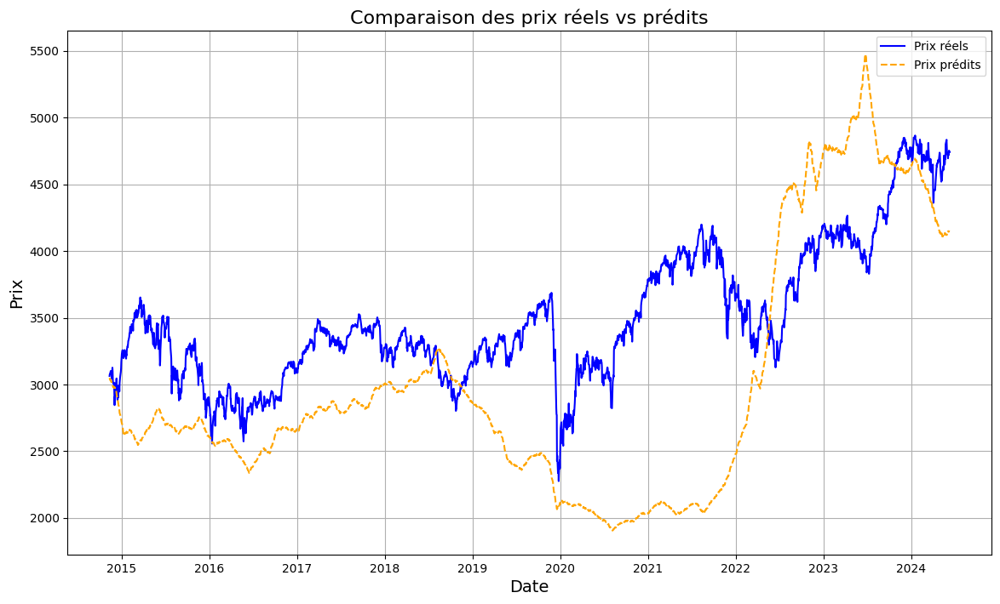

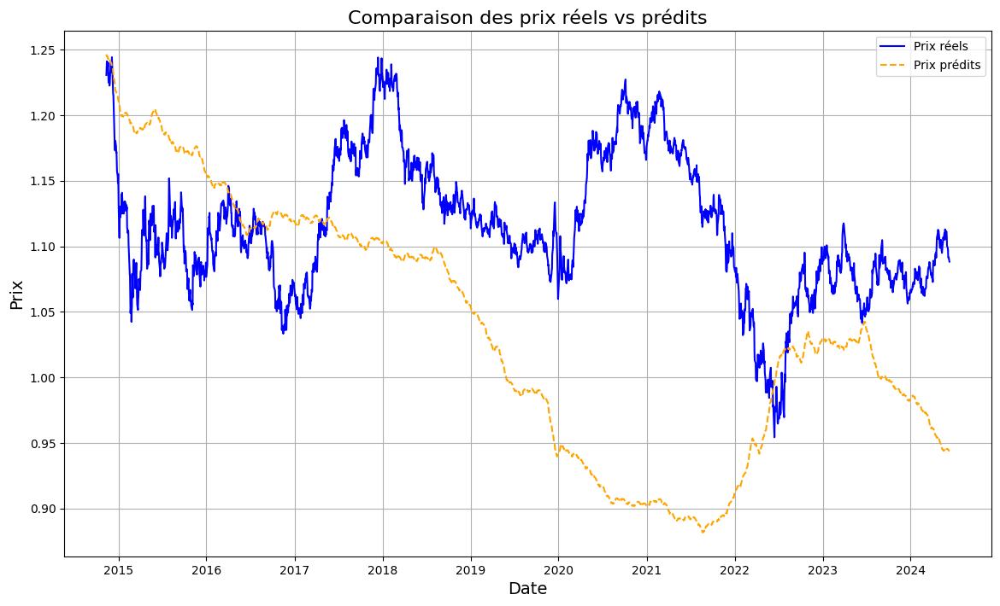

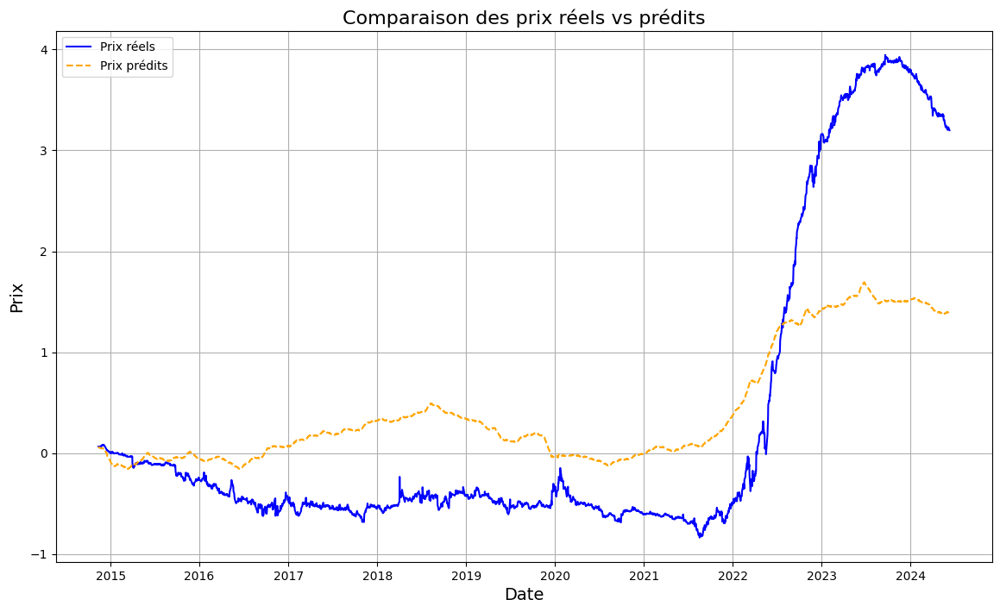

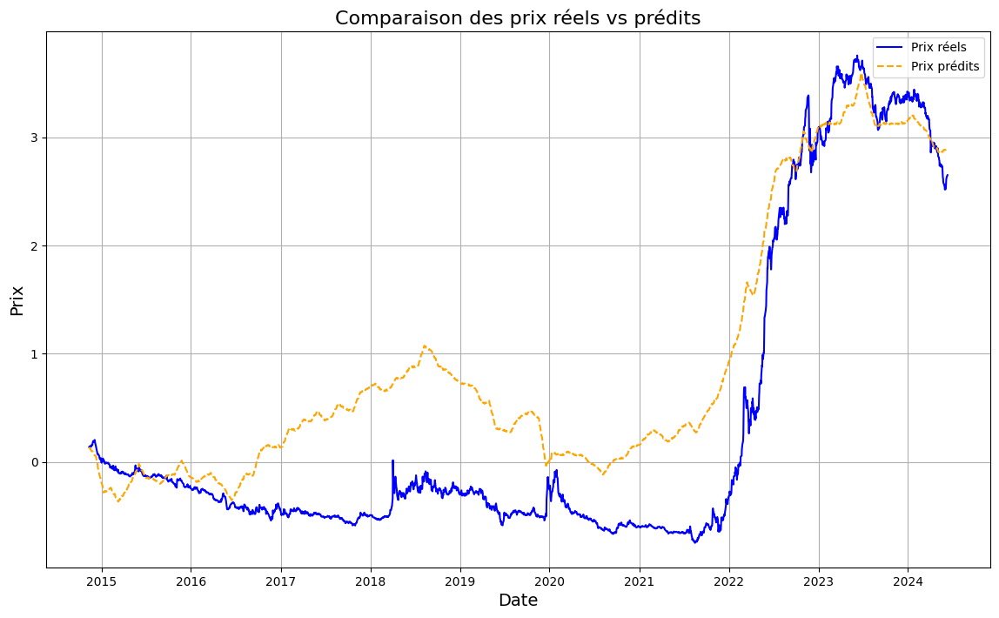

...

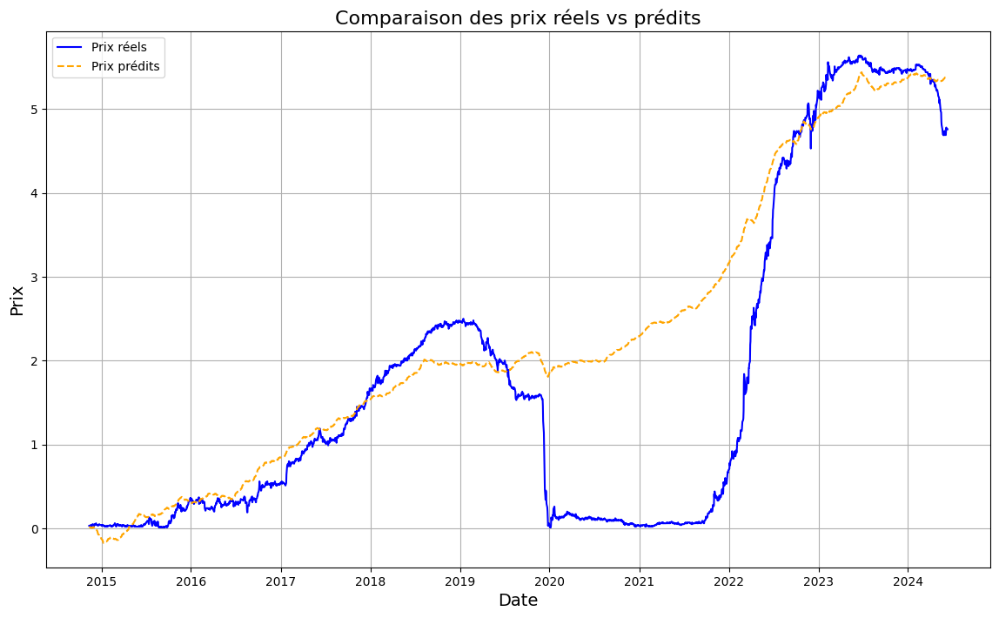

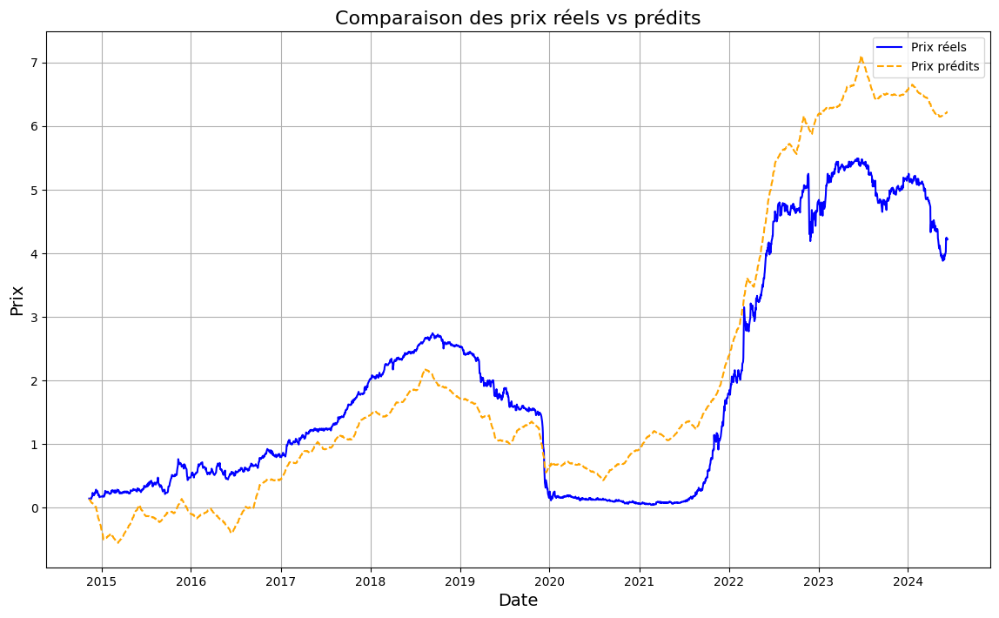

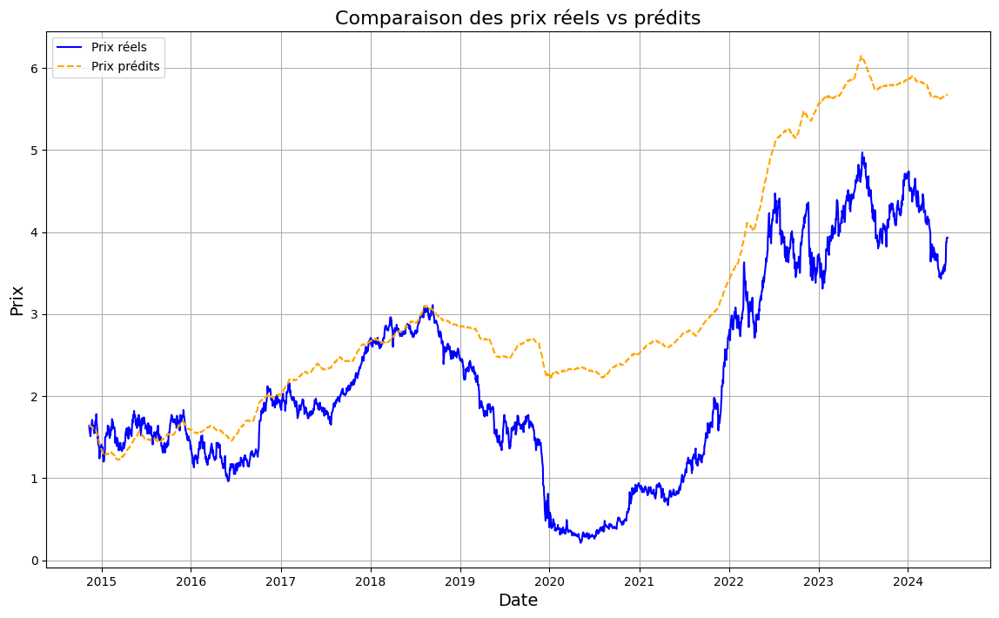

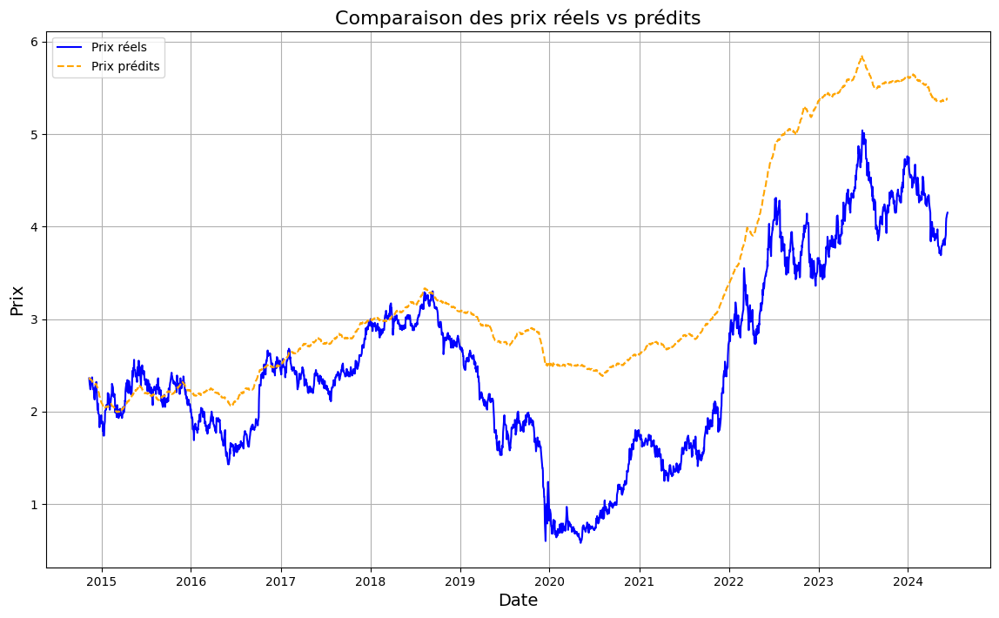

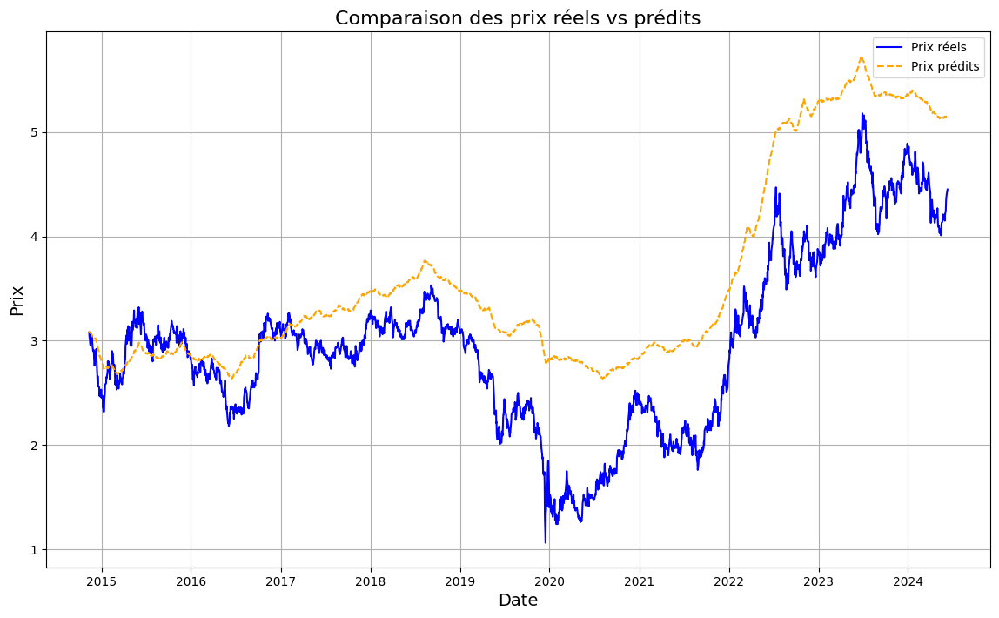

In [ ]:
# Tracer les courbes des valeurs réelles et prédites
for numero_actif in range(nb_actifs):
  plt.figure(figsize=(14, 8))
  plt.plot(date_index,prix_reels[:,numero_actif], label='Prix réels', color='blue')
  plt.plot(date_index,prix_predits[:,numero_actif], label='Prix prédits', color='orange', linestyle='--')
  plt.title("Comparaison des prix réels vs prédits", fontsize=16)
  plt.xlabel("Date", fontsize=14)
  plt.ylabel("Prix", fontsize=14)
  plt.legend()
  plt.grid(True)
  plt.show()

# VAE

In [ ]:
import numpy as np
import pandas as pd
import yfinance as yf
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, InputLayer
from tensorflow.keras.utils import plot_model
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras import backend as K
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy.stats import wasserstein_distance
import seaborn as sns
from pandas.tseries.holiday import USFederalHolidayCalendar
from pandas.tseries.offsets import CustomBusinessDay

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# file_path = '/content/drive/MyDrive/collab/SharedData/data_assets_ren.csv'
file_path = '/content/drive/MyDrive/SharedData/data_assets_ren.csv'
# file_path = '/content/drive/MyDrive/DDEFI/data_assets_ren.csv' # Lien pour Drive Léo

df_rendements = pd.read_csv(file_path, index_col = 0)
donnees_brutes_0 = df_rendements.values.astype('float32')
donnees_brutes = df_rendements[:-5].values.astype('float32') # On enlève les 5 derniers prix car on veut faire une simulation sur 5 jours

In [ ]:
# file_path = '/content/drive/MyDrive/collab/SharedData/data_assets.csv'
file_path = '/content/drive/MyDrive/SharedData/data_assets.csv'
# file_path = '/content/drive/MyDrive/DDEFI/data_assets.csv' # Lien pour Drive Léo


df_prix = pd.read_csv(file_path, index_col = 0)
prix_initiaux = df_prix.head(1)
prix_5_jour = df_prix.iloc[-5]
premier_jour = prix_initiaux.index.values[0]
premier_jour

'2014-11-12'

In [ ]:
nb_jours, nb_actifs = donnees_brutes.shape  # Extraction du nombre de jours et d'actifs
nb_donnees = nb_jours * nb_actifs  # Calcul du nombre total de données

nb_jours_a_sequencer = 5 #20  # Définition du nombre de jours pour la séquence
longueur_sequence = nb_jours_a_sequencer * nb_actifs  # Calcul de la longueur d'une séquence
nb_sequence = nb_donnees//longueur_sequence
reste_a_retirer=nb_donnees % longueur_sequence

msg1 = f'Analyse initiale: {nb_jours} jours et {nb_actifs} actifs, totalisant {nb_donnees} données.\n'
msg2 = f'Chaque séquence de {nb_jours_a_sequencer} jours contient {nb_actifs} données (une par actif), ce qui fait {longueur_sequence} données par séquence. Nous pouvons donc former {nb_sequence} séquences.\n'
msg3 = f'Il y aura {reste_a_retirer} données en surplus, nécessitant une correction pour obtenir un nombre entier de séquences.\n'
msg4 = f'Pour cela, nous devrons retirer {reste_a_retirer // nb_actifs} lignes de données anciennes de "donnees_brutes".\n'

msg_a_lire=msg1+msg2+msg3+msg4

print("Analyse préalable sur le découpage des données pour le réseau de neuronnes:\n")
print(msg_a_lire)

indice_de_retrait = reste_a_retirer // nb_actifs # Retirer les données les plus anciennes pour obtenir un découpage net.


Analyse préalable sur le découpage des données pour le réseau de neuronnes:

Analyse initiale: 2402 jours et 13 actifs, totalisant 31226 données.
Chaque séquence de 5 jours contient 13 données (une par actif), ce qui fait 65 données par séquence. Nous pouvons donc former 480 séquences.
Il y aura 26 données en surplus, nécessitant une correction pour obtenir un nombre entier de séquences.
Pour cela, nous devrons retirer 2 lignes de données anciennes de "donnees_brutes".



In [ ]:
donnees_brutes=donnees_brutes[indice_de_retrait:]

In [ ]:
# Prétraitement des données
# Cette étape est nécessaire pour :
# 1. Normaliser les données pour faciliter l'apprentissage du modèle
# 2. Restructurer et préparer les données dans un format approprié pour l'entrée du modèle

# Normalisez vos données en ajustant et en transformant vos données: elles seront entre 0 et 1 (donc positives)
scaler = MinMaxScaler()
#scaler = StandardScaler()
donnees_normalisees = scaler.fit_transform(donnees_brutes) #plus tard, pour récupérer cette forme de données, on utilisera: scaler.inverse_transform(donnees_brutes)

## MinMaxScaler est adapté pour les fonctions d'activation comme ReLU ou Sigmoid, où tu veux que les données soient dans une plage spécifique (comme [0, 1]).

# D'autres possibilités pour "Scaler" des données, par exemple:
## StandardScaler peut être adapté pour les fonctions d'activation comme Tanh ou Sigmoid qui fonctionnent mieux avec des données centrées autour de 0.

donnees_reshaped=donnees_normalisees.reshape(nb_sequence,longueur_sequence)
input_dim = donnees_reshaped.shape[1]



In [ ]:
input_dim=longueur_sequence #nombre de données dans une séquence
input_dim

65

## Architecture VAE

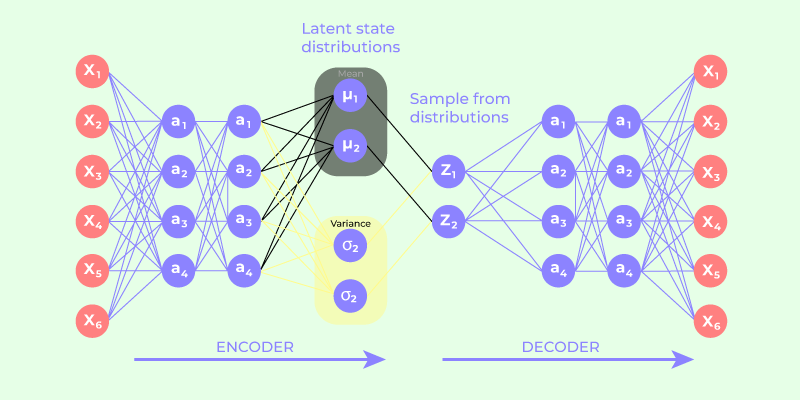

In [ ]:
from tensorflow.keras import Model, Input
from tensorflow.keras.layers import Dense, InputLayer, Lambda

dim_latent = input_dim//5
acti_func = 'relu'
acti_func2 = 'tanh'
# Exemples de fonctions d'activation non linéaires: relu, sigmoid, tanh, softmax, softplus, softsign, elu, selu, prelu, thresholded_relu, swish

# résulats intéressants avec tanh (2,3,4,3,2) et min_max scale beta = 1, 32 epochs
# résulats intéressants avec tanh_1 et relu_2 (2,3,4,5,4,3,2) et min_max scale beta = 1, 32 epochs
# résulats intéressants avec (2 relu ,3 tanh ,4 relu ,5 relu ,4 t ,3 relu ,2) et min_max scale beta = 1, 32 epochs
# ----------------------------------------------------- #

# Partie 1 : Encodeur

# Définition de l'encodeur
input_layer = Input(shape=(input_dim,), name="couche_entree")
encoder_output = Dense(input_dim//2, activation=acti_func, name="couche_encoder")(input_layer)
encoder_output = Dense(input_dim//3, activation=acti_func2, name="couche_encoder1")(encoder_output)
encoder_output = Dense(input_dim//4, activation=acti_func, name="couche_encoder2")(encoder_output)
# Ajout de la moyenne et de la log-variance pour l'espace latent
z_mean = Dense(dim_latent, activation=acti_func, name="z_mean")(encoder_output) # Mettre la dimension optimisé pour AE sur l'espace latent.
z_log_var = Dense(dim_latent, activation=acti_func, name="z_log_var")(encoder_output)

def sample(args):
    z_mean, z_log_var = args
    epsilon = K.random_normal(shape=K.shape(z_mean), mean=0., stddev=1.)
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = Lambda(sample, name='sample')([z_mean, z_log_var])

# Création du modèle encodeur
encoder = Model(inputs=input_layer, outputs=[z_mean, z_log_var, z], name="Encoder")

# ----------------------------------------------------- #

# Partie 2 : Decodeur

# Définition du décodeur
decoder_input = Input(shape = (dim_latent,), name="input_decoder")
decoder_output = Dense(input_dim//4, activation=acti_func, name="couche_decoder3")(decoder_input)
decoder_output = Dense(input_dim//3, activation=acti_func2, name="couche_decoder2")(decoder_output)
decoder_output = Dense(input_dim//2, activation=acti_func, name="couche_decoder1")(decoder_output)
decoder_output = Dense(input_dim , activation='linear', name="couche_sortie")(decoder_output)

# Création du modèle décodeur
decoder = Model(inputs=decoder_input, outputs=decoder_output, name="Decoder")

# ----------------------------------------------------- #

# Partie 3: Auto-encodeur = Regroupement de l'encodeur et du décodeur

# Construction de l'autoencodeur en combinant encodeur et décodeur
autoencoder_input = Input(shape=(input_dim,), name="input_autoencodeur")
z_mean, z_log_var, z  = encoder(autoencoder_input)
decoded = decoder(z)

# Création du modèle autoencodeur complet
modele = Model(inputs=autoencoder_input, outputs=decoded, name="VAE")

# Affichage des résumés des modèles
encoder.summary()
decoder.summary()
modele.summary()

beta = 1.2

# Définition de la fonction de perte
def vae_loss(inputs, outputs):
    # Calcul de la perte de reconstruction
    z_mean, z_log_var, z  = encoder(inputs)
    reconstruction_loss = K.mean(K.square(inputs - outputs), axis=-1)
    divergence_kl = -0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis= -1)
    return reconstruction_loss + beta*divergence_kl

# mettre un beta pour pondérer la somme kl, jouer avec beta et regarder les prédictions par actifs
# Mettre early stop et regarder avec tous les actifs faire boucle for
# Mettre une métrique dans le compile.

# Compilation du modèle avec la fonction de perte personnalisée
#J'ai une erreur ici  mse == string
modele.compile(optimizer='adam', loss=vae_loss, metrics = ["mse"])

Model: "Encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ couche_entree             │ (None, 65)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ couche_encoder (Dense)    │ (None, 32)             │          2,112 │ couche_entree[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ couche_encoder1 (Dense)   │ (None, 21)             │            693 │ couche_encoder[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ couche_encoder2 (Dense)   │ (None, 16)             │            352 │ couche_encoder1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 13)             │            221 │ couche_encoder2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 13)             │            221 │ couche_encoder2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sample (Lambda)           │ (None, 13)             │              0 │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,599 (14.06 KB)

 Trainable params: 3,599 (14.06 KB)

 Non-trainable params: 0 (0.00 B)

Model: "Decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_decoder (InputLayer)           │ (None, 13)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ couche_decoder3 (Dense)              │ (None, 16)                  │             224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ couche_decoder2 (Dense)              │ (None, 21)                  │             357 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ couche_decoder1 (Dense)              │ (None, 32)                  │             704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ couche_sortie (Dense)                │ (None, 65)                  │           2,145 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,430 (13.40 KB)

 Trainable params: 3,430 (13.40 KB)

 Non-trainable params: 0 (0.00 B)

Model: "VAE"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_autoencodeur (InputLayer)      │ (None, 65)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Encoder (Functional)                 │ [(None, 13), (None, 13),    │           3,599 │
│                                      │ (None, 13)]                 │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Decoder (Functional)                 │ (None, 65)                  │           3,430 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,029 (27.46 KB)

 Trainable params: 7,029 (27.46 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#Paramètre pouvant être modifié
notre_taille_de_lot = 32

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',     # Metric to monitor
    patience=5,             # Stop after 5 epochs with no improvement
    min_delta=0.001,        # Minimum improvement to qualify as a better epoch
    restore_best_weights=True  # Restore weights from the best epoch
)

# Entraînement du modèle
historique = modele.fit(donnees_reshaped, donnees_reshaped, epochs=100, batch_size=notre_taille_de_lot,callbacks=[early_stopping], validation_split=0.2, shuffle=False, verbose=0)

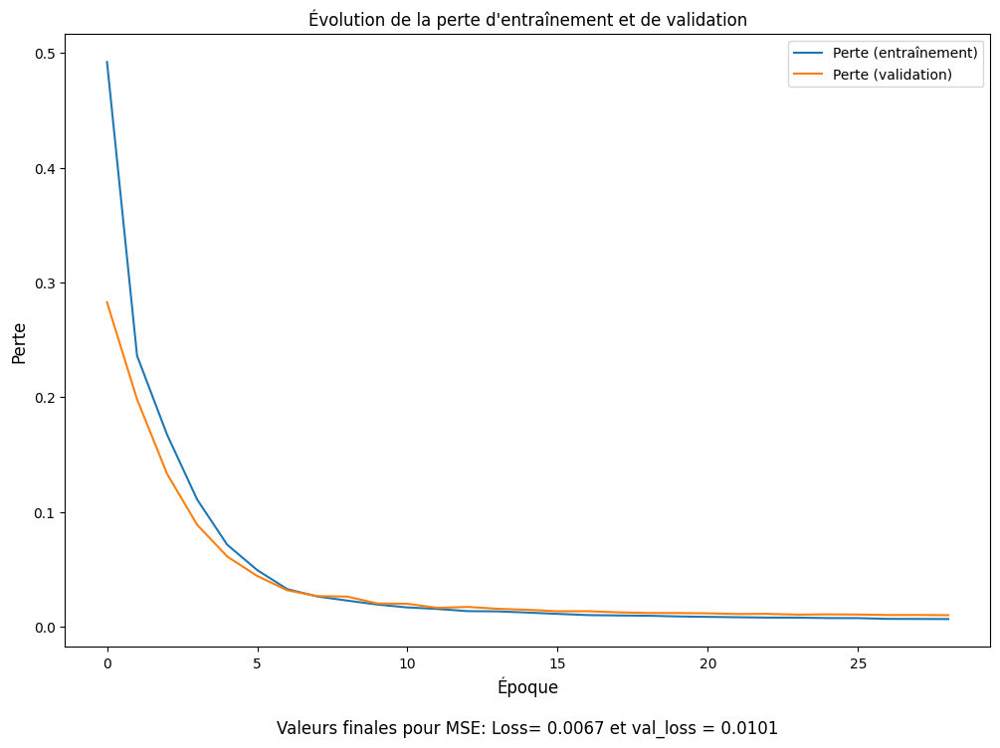

In [ ]:
# Extraction des dernières valeurs de perte
perte=list(pd.DataFrame(historique.history)[['loss','val_loss']].iloc[-1])

# Évolution de l'apprentissage
plt.figure(figsize=(12, 8))
perte=list(pd.DataFrame(historique.history)[['loss','val_loss']].iloc[-1])
plt.plot(historique.history['loss'], label='Perte (entraînement)')
plt.plot(historique.history['val_loss'], label='Perte (validation)')
plt.xlabel("Époque"+ f'\n\nValeurs finales pour MSE: Loss= {perte[0]:.4f} et val_loss = {perte[1]:.4f}', fontsize=12)
plt.ylabel("Perte", fontsize=12)
plt.title("Évolution de la perte d'entraînement et de validation", fontsize=12)
plt.legend()
plt.show()

In [ ]:
# Obtenir les prédictions sur les données d'entrée
predictions = modele.predict(donnees_reshaped, verbose = 0)
# Redimensionner les données pour revenir à leur forme d'origine
donnees_reelles = donnees_reshaped.reshape(-1, nb_actifs)  # nb_actifs : nombre d'actifs dans notre base de données
donnees_predites = predictions.reshape(-1, nb_actifs)

# Ce bloc vise à remettre à l'échelle nos données puis à dénormaliser
donnees_reelles=scaler.inverse_transform(donnees_reelles)
donnees_predites=scaler.inverse_transform(donnees_predites)


In [ ]:
# rendements relatifs
stocks = prix_initiaux[['sp500', 'Eurostock', 'EURUSD']]
prix_predits_re = stocks.values*np.cumprod(donnees_predites[:,:3] + 1, axis=0)
prix_reels_re = stocks.values*np.cumprod(donnees_reelles[:,:3] + 1, axis=0)

# rendements absolut
taux = prix_initiaux[prix_initiaux.columns[~prix_initiaux.columns.isin(['sp500', 'Eurostock', 'EURUSD'])]]
prix_predits_abs = taux.values + np.cumsum(donnees_predites[:,3:] , axis=0)
prix_reels_abs = taux.values + np.cumsum(donnees_reelles[:,3:] , axis=0)

In [ ]:
prix_reels = np.concatenate((prix_reels_re, prix_reels_abs), axis = 1)
prix_predits = np.concatenate((prix_predits_re, prix_predits_abs), axis = 1)

In [ ]:
numero_actif = 0 # Numéro de l'actif à visualiser (0: premier actif, 1: second actif, etc)

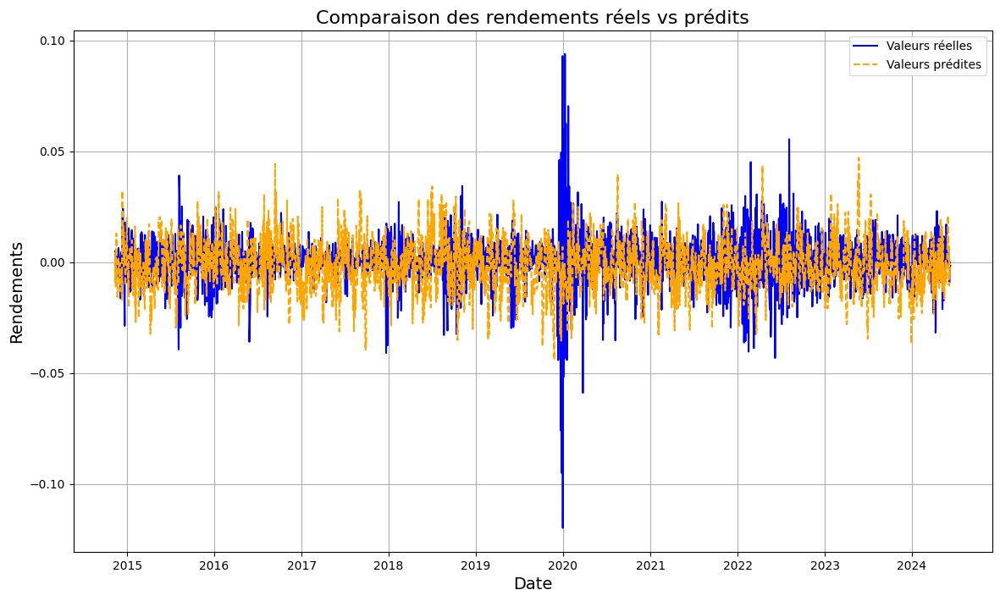

In [ ]:
# Extraire les séries temporelles pour l'actif numéro i
reel_actif = donnees_reelles[:, numero_actif]  # Colonne correspondant au numéro de l'actif pour le premier actif
pred_actif = donnees_predites[:, numero_actif]  # Colonne correspondant au numéro de l'actif pour les prédictions


# Créer un calendrier de jours ouvrés personnalisé
us_business_day = CustomBusinessDay(calendar=USFederalHolidayCalendar())
date_index = pd.date_range(start=premier_jour, periods=len(reel_actif), freq=us_business_day) #premier_jour : date de vos prix initiaux

# Tracer les courbes des valeurs réelles et prédites pour le premier actif
plt.figure(figsize=(14, 8))
plt.plot(date_index,reel_actif, label='Valeurs réelles', color='blue')
plt.plot(date_index,pred_actif, label='Valeurs prédites', color='orange', linestyle='--')
plt.title("Comparaison des rendements réels vs prédits", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Rendements", fontsize=14)
plt.legend()
plt.grid(True)

# Affichage du graphique
plt.show()

In [ ]:
# Dictionnaire pour repérer le nom de l'asset avec sa position dans le numpy array
i = 0
dict_names = {}
for name in df_prix.columns:
  dict_names[name] = i
  i += 1
print(df_prix.columns)
col_names = df_prix.columns

Index(['sp500', 'Eurostock', 'EURUSD', '3M_EUR', '1Y_EUR', '5Y_EUR', '10Y_EUR',
       '30Y_EUR', '3M_USD', '1Y_USD', '5Y_USD', '10Y_USD', '30Y_USD'],
      dtype='object')


In [ ]:
import matplotlib.pyplot as plt
from matplotlib import _pylab_helpers

dict_dicn = {}
for numero_actif in range(0, 13):
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.plot(date_index, prix_reels[:, numero_actif], label='Prix réels', color='blue')
    ax.plot(date_index, prix_predits[:, numero_actif], label='Prix prédits', color='orange', linestyle='--')
    ax.set_title("Prix réels vs prédits " + str(col_names[numero_actif]), fontsize=16)
    ax.set_xlabel("Date", fontsize=14)
    ax.set_ylabel("Prix", fontsize=14)
    ax.legend()
    ax.grid(True)
    dict_dicn[numero_actif] = fig
    plt.close(fig)  # Close the plot to prevent it from displaying


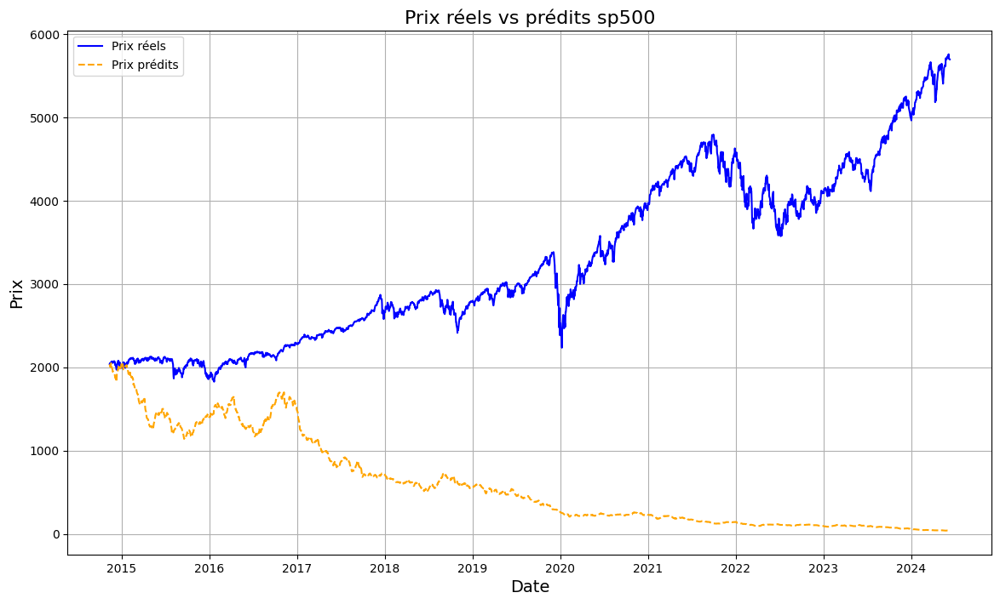

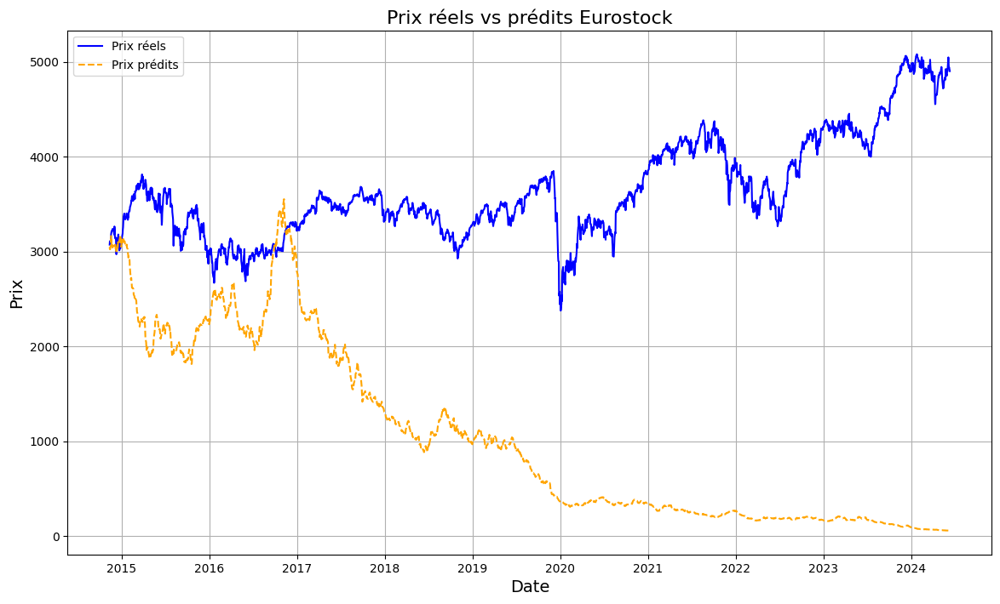

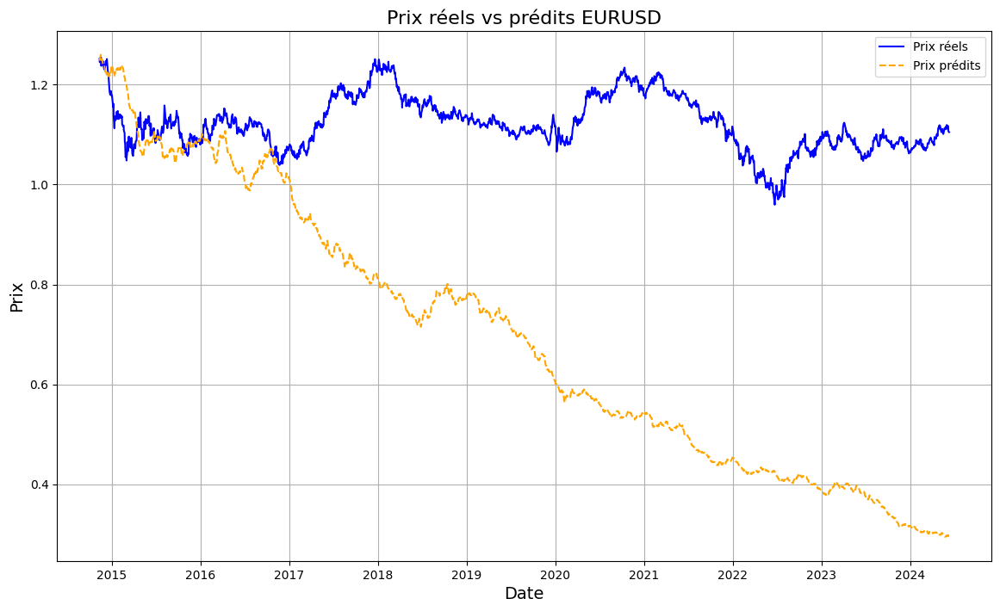

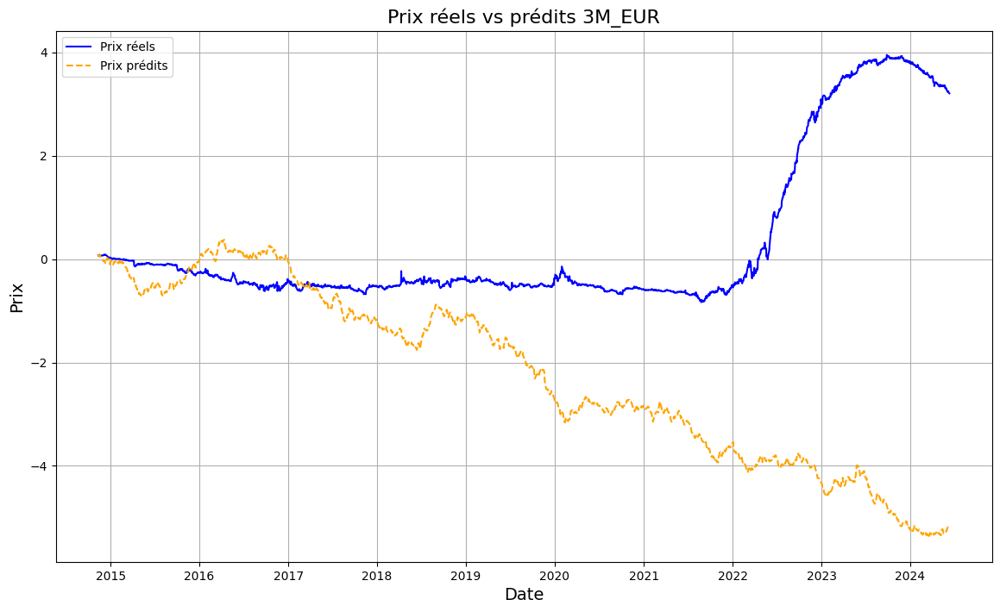

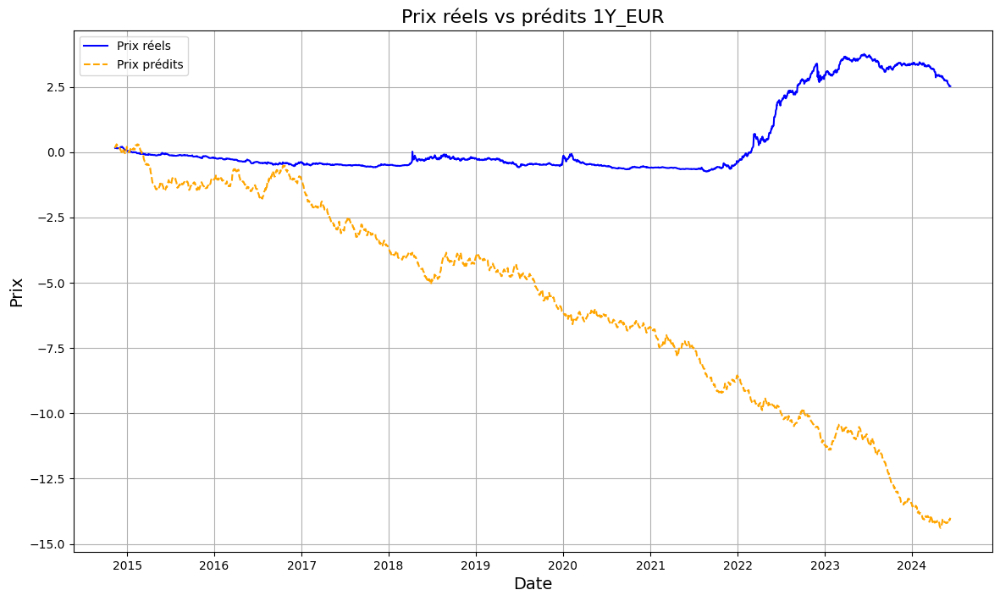

...

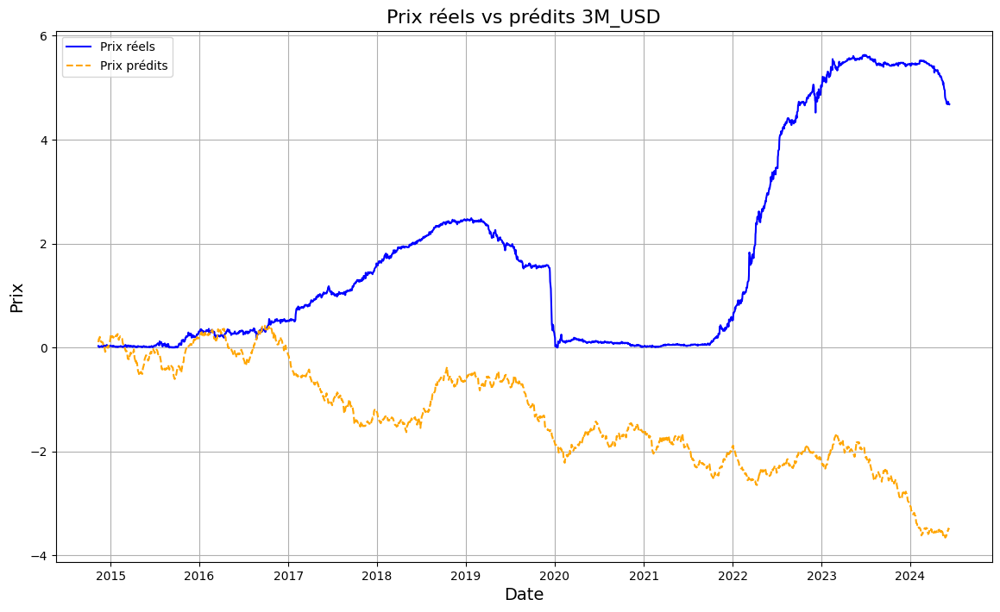

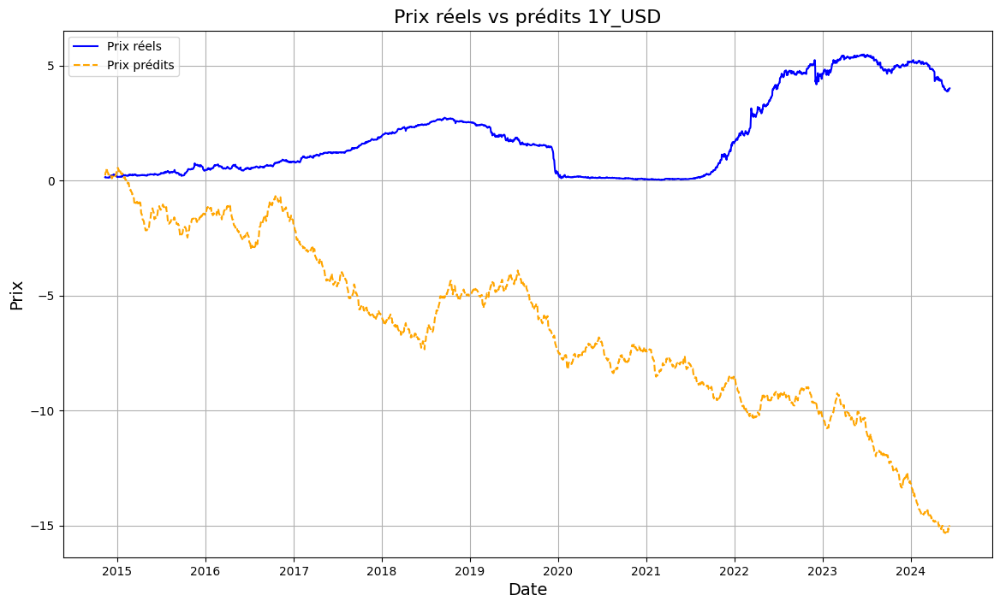

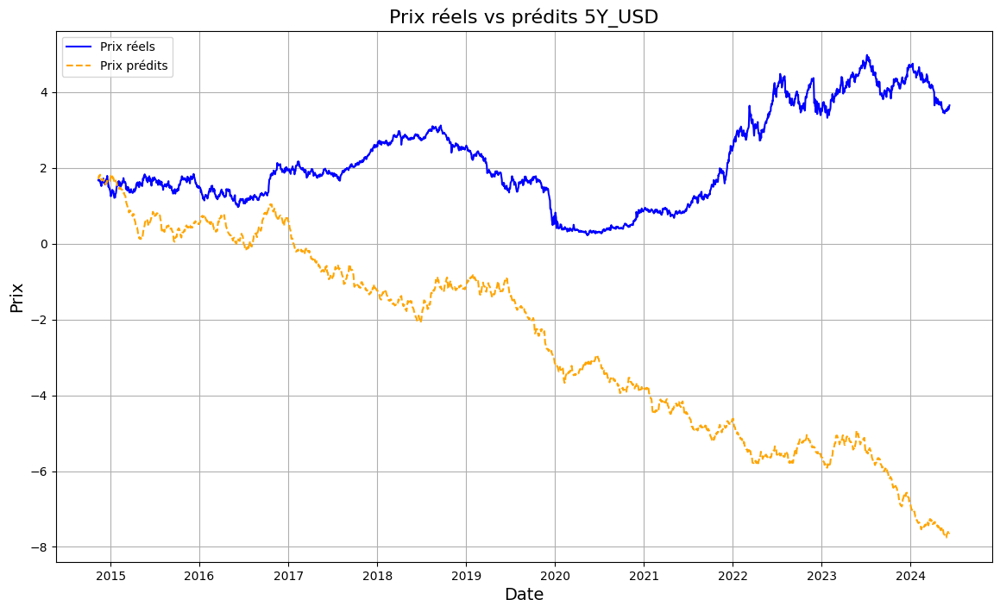

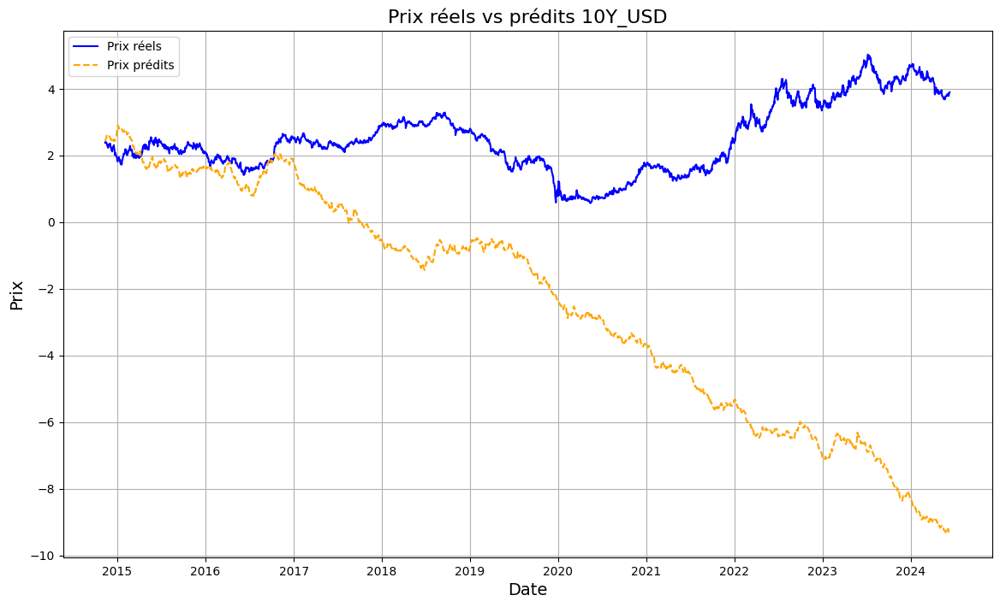

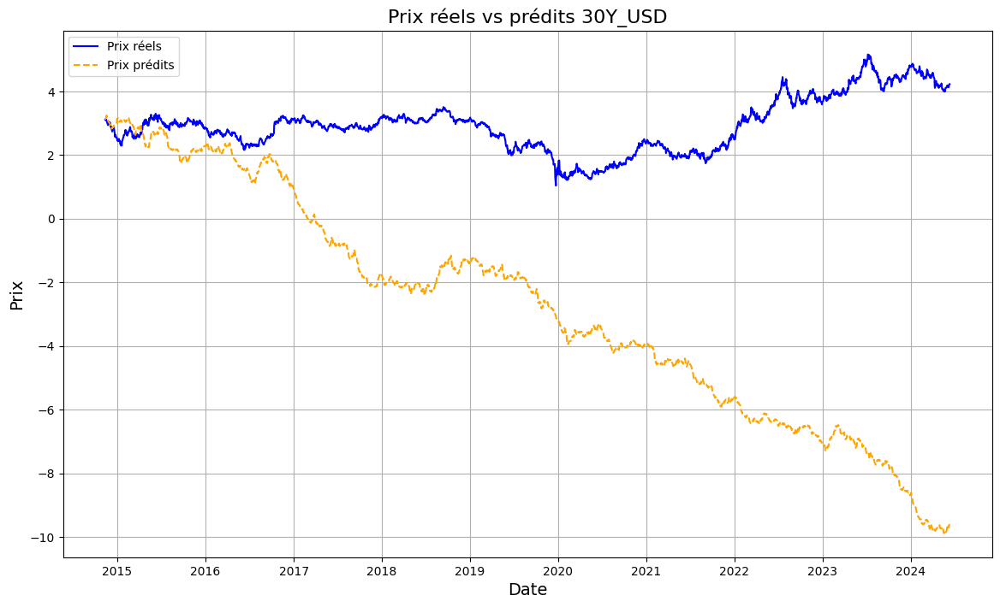

In [ ]:
def show_fig(fig):
    _pylab_helpers.Gcf.set_active(fig.canvas.manager)
    plt.show()

for numero_actif in range(0, 13):
  show_fig(dict_dicn[numero_actif])


Nous avons :
* $P(Z)$ **"Prior"** qui est une loi normale centrée réduite: $\mathcal{N}(0,1)$ c'est que on cherche à atteindre pour l'espace latent
* $P(Z|X)$ **"Posterior"** probabilité pour l'encodeur. Qui sera approximé par $Q(Z|X)$ une gaussienne car le calcul de $P(Z|X)$ n'est pas possible.
* $P(X|Z)$ **"Reconstruction"** probabilité pour le décodeur. Quelle est la probabilité de reconstruire X en partant de Z.

Nous avons fait une approximation avec le **"Posterior"** nous voulons mesurer cette approximation :
$$KL(Q(Z|X) || P(Z|X) ) = \sum_{z \in Z} Q(Z|X)log\frac{Q(Z|X)}{P(Z|X)}$$

Par calcul nous arrivons à :

$$log(P(X)) = \mathcal{L} + KL(Q(Z|X)||P(Z|X))$$

Avec $\mathcal{L}$ qui est le **variational lower bound**, et son opposé : $-\mathcal{L}$ est notre fonction de loss.

Nous voulons maximiser $log(P(X))$ qui est négatif, donc maximiser $\mathcal{L}$(négatif) soit minimiser $-\mathcal{L}$(positif). Plus précisément, minimiser :

\\
$$- \mathcal{L} = - \mathbb{E}_{Q(Z|X)}[log(P(X|Z)] + KL(Q(Z|X)||P(Z))$$

\
* $\mathbb{E}_{Q(Z|X)}[log(P(X|Z)]$ : est l'erreur sur la reconstruction, dans notre cas c'est le MSE.

\\
* $KL(Q(Z|X)||P(Z))$ : est la regularisation, le KL loss. Dans notre cas comme $P(Z)$ est une loi normale le KL loss s'écrit :
$$KL(Q(Z|X)||\mathcal{N}(0,1)) = - \frac{1}{2}\left[-\sigma_q^2 - \mu_q^2 + 1 + log(\sigma_q^2)\right]$$


Trick de reparametrisation :
Pour l'étape de la back propagation, nous devons calculer un gradient. Soit différencier une fonction.
Comment différencier Z, qui a été généré à partir de $\mathcal{N}(\mu_q,\sigma_q^2)$.

Générer Z avec $\mu_q + \sigma_q^2 \epsilon$ où $\epsilon$ suit une loi normale centré réduite. $\mathcal{N}(0,1)$ Ce cette façon cette procédure devient différenciable.

## Descriptions des distributions

               sp500  Eurostock    EURUSD    3M_EUR    1Y_EUR    5Y_EUR  \
2014-11-13  0.000530   0.003118 -0.003679  0.002214  0.005375  0.010214   
2014-11-14  0.000240   0.001044  0.003705 -0.001149 -0.002487 -0.008605   
2014-11-17  0.000735   0.008105  0.003405  0.003237  0.007167  0.006653   
2014-11-18  0.005134   0.011550 -0.005552  0.001441  0.003461 -0.017886   
2014-11-19 -0.001501   0.000865  0.006781  0.005411  0.013983  0.029456   

             10Y_EUR   30Y_EUR  3M_USD  1Y_USD  5Y_USD  10Y_USD  30Y_USD  
2014-11-13  0.011186  0.001534    0.00    0.01   -0.01    -0.02    -0.01  
2014-11-14 -0.010246  0.001460    0.00    0.00   -0.02    -0.03    -0.04  
2014-11-17  0.007930  0.001231    0.01    0.00    0.02     0.02     0.02  
2014-11-18 -0.022505  0.004167   -0.01   -0.01   -0.01    -0.02    -0.01  
2014-11-19  0.039500  0.033801   -0.01    0.01    0.03     0.04     0.03  
Index(['sp500', 'Eurostock', 'EURUSD', '3M_EUR', '1Y_EUR', '5Y_EUR', '10Y_EUR',
       '30Y_EUR', '

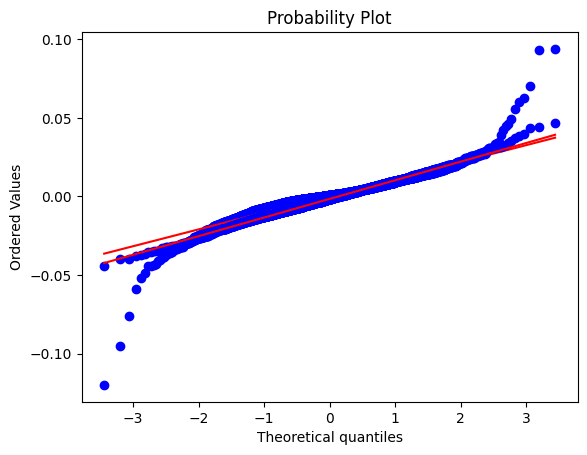

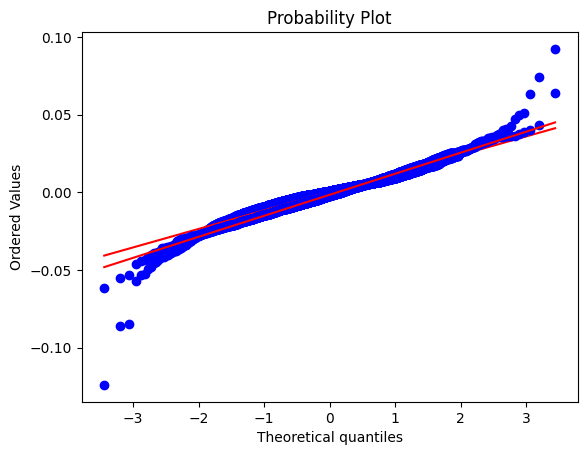

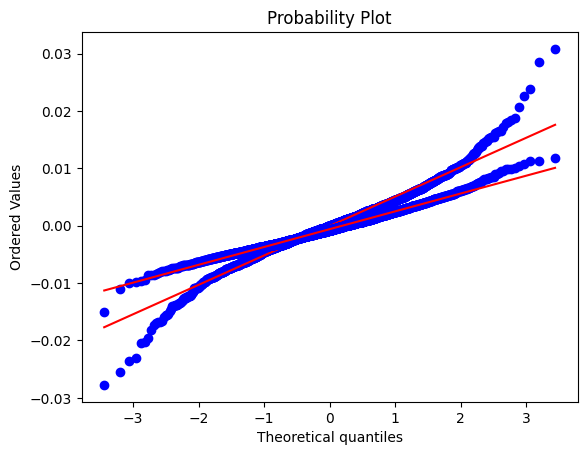

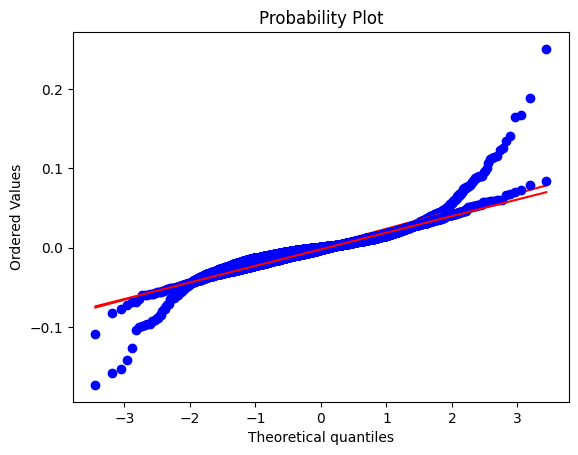

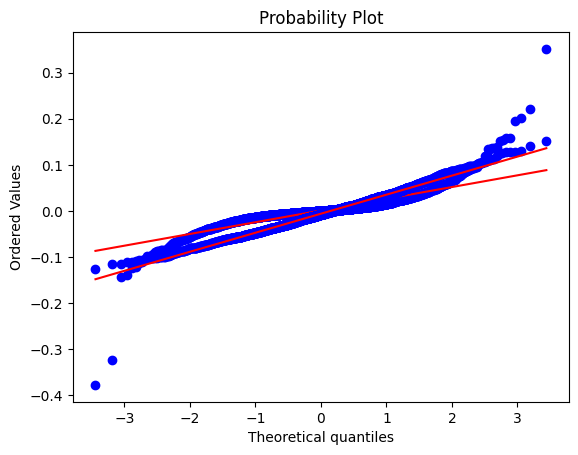

...

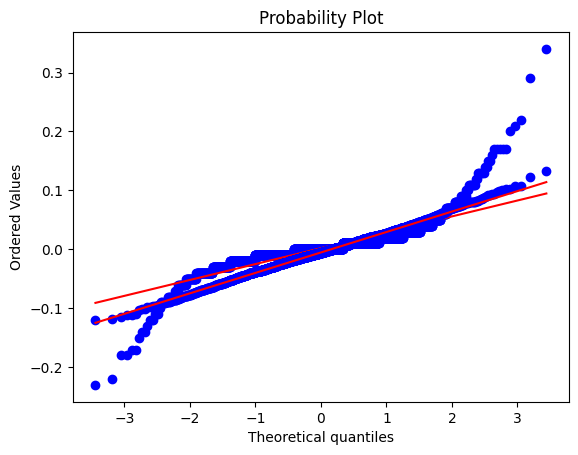

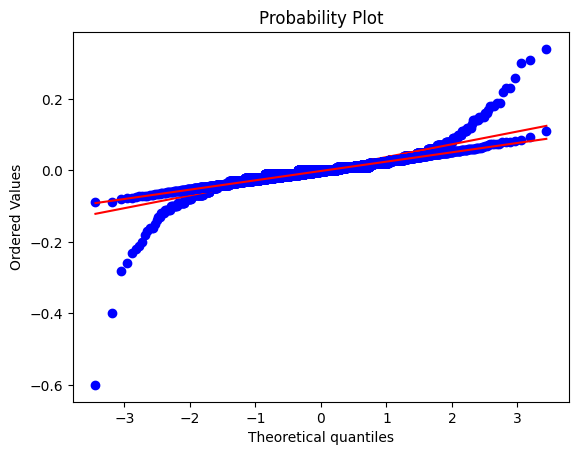

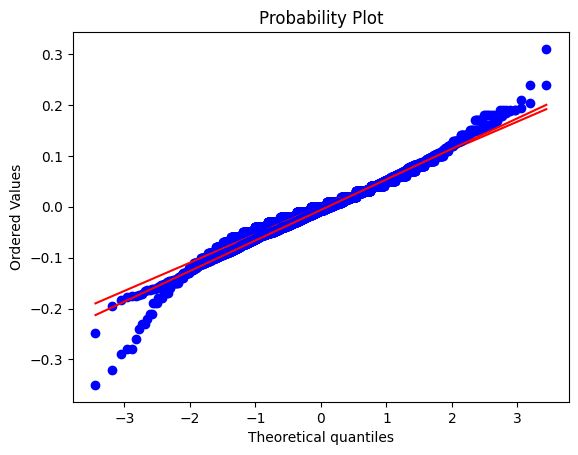

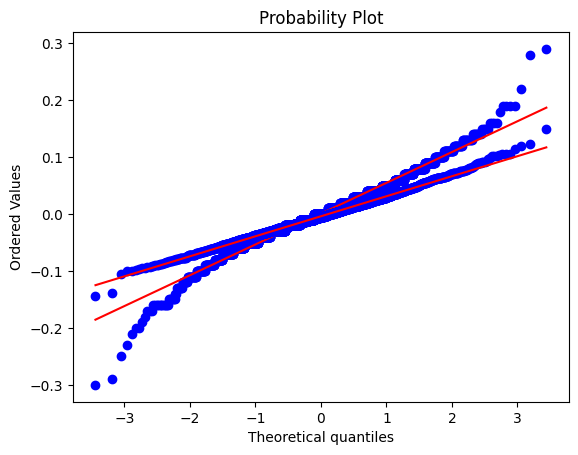

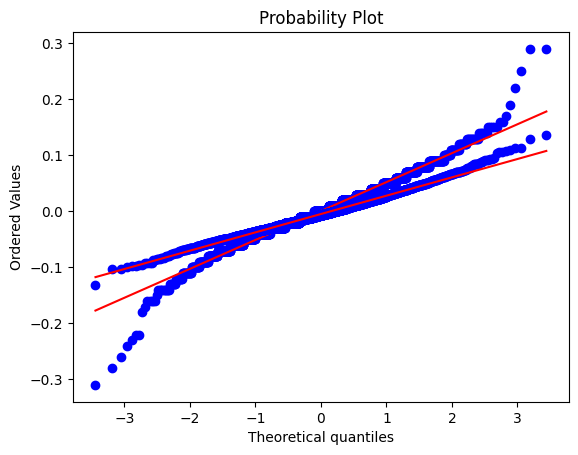

In [ ]:
##QQplot verification
import scipy.stats as stats
import matplotlib.pyplot as plt
import numpy as np
print(df_rendements.head()) #données réelles
print(df_rendements.columns)
print(donnees_reelles[:,numero_actif])

print('prediction',)
#QQplot par actif Réel/prédites

#QQplot par actif Réel

plt.title("QQ-Plot sp500")
stats.probplot(df_rendements["sp500"].values, dist="norm", plot=plt)
#QQplot par actif prédit
stats.probplot(donnees_predites[:,0], dist="norm", plot=plt)
plt.show()

stats.probplot(df_rendements["Eurostock"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,1], dist="norm", plot=plt)
plt.show()
stats.probplot(df_rendements["EURUSD"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,2], dist="norm", plot=plt)
plt.show()

stats.probplot(df_rendements["3M_EUR"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,3], dist="norm", plot=plt)
plt.show()

stats.probplot(df_rendements["1Y_EUR"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,4], dist="norm", plot=plt)
plt.show()

stats.probplot(df_rendements["5Y_EUR"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,5], dist="norm", plot=plt)
plt.show()

stats.probplot(df_rendements["10Y_EUR"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,6], dist="norm", plot=plt)
plt.show()

stats.probplot(df_rendements["30Y_EUR"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,7], dist="norm", plot=plt)
plt.show()

stats.probplot(df_rendements["3M_USD"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,numero_actif], dist="norm", plot=plt)
plt.show()

stats.probplot(df_rendements["1Y_USD"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,8], dist="norm", plot=plt)
plt.show()

stats.probplot(df_rendements["5Y_USD"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,9], dist="norm", plot=plt)
plt.show()

stats.probplot(df_rendements["10Y_USD"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,10], dist="norm", plot=plt)
plt.show()

stats.probplot(df_rendements["30Y_USD"].values, dist="norm", plot=plt)
stats.probplot(donnees_predites[:,11], dist="norm", plot=plt)
plt.show()





**Distance de Wasserstein**

In [ ]:
from scipy.stats import wasserstein_distance

for i in range(nb_actifs):
  distance = wasserstein_distance(donnees_reelles[:,i],donnees_predites[:,i])
  if distance < 0.05 :
    print(f'{list(df_rendements.columns)[i]} : ', f'{wasserstein_distance(donnees_reelles[:,i],donnees_predites[:,i]):.2g}', ' ; Très proche', sep='')
  elif 0.05 <= distance < 0.1 :
    print(f'{list(df_rendements.columns)[i]} : ', f'{wasserstein_distance(donnees_reelles[:,i],donnees_predites[:,i]):.2g}', ' ; Acceptable', sep='')
  else :
    print(f'{list(df_rendements.columns)[i]} : ', f'{wasserstein_distance(donnees_reelles[:,i],donnees_predites[:,i]):.2g}', ' ; Écart significatif', sep='')

sp500 : 0.0052 ; Très proche
Eurostock : 0.0041 ; Très proche
EURUSD : 0.0013 ; Très proche
3M_EUR : 0.0062 ; Très proche
1Y_EUR : 0.024 ; Très proche
5Y_EUR : 0.0071 ; Très proche
10Y_EUR : 0.0054 ; Très proche
30Y_EUR : 0.0059 ; Très proche
3M_USD : 0.01 ; Très proche
1Y_USD : 0.034 ; Très proche
5Y_USD : 0.0092 ; Très proche
10Y_USD : 0.012 ; Très proche
30Y_USD : 0.0092 ; Très proche


**Matrices de corrélation**

In [ ]:
np.set_printoptions(precision=3)
correlation_reelle = []
correlation_predite = []
for i in range(nb_actifs) :
  correlation_reelle.append(np.corrcoef(donnees_reelles.T)[i])
  correlation_predite.append(np.corrcoef(donnees_predites.T)[i])
matrice_correlation_reelle = pd.DataFrame(correlation_reelle)
matrice_correlation_predite = pd.DataFrame(correlation_predite)

matrice_correlation_reelle.columns = matrice_correlation_reelle.index = df_rendements.columns
matrice_correlation_predite.columns = matrice_correlation_predite.index = df_rendements.columns

In [ ]:
matrice_correlation_reelle

,sp500,Eurostock,EURUSD,3M_EUR,1Y_EUR,5Y_EUR,10Y_EUR,30Y_EUR,3M_USD,1Y_USD,5Y_USD,10Y_USD,30Y_USD
sp500,1.000000,0.590955,0.020622,0.013007,-0.048524,-0.057225,-0.031301,-0.015858,0.049291,0.080843,0.131998,0.169383,0.195289
Eurostock,0.590955,1.000000,0.000073,-0.005723,-0.051627,-0.059512,-0.019151,0.003311,0.077698,0.168808,0.199945,0.214423,0.203403
EURUSD,0.020622,0.000073,1.000000,-0.005010,-0.033478,-0.055438,-0.032171,-0.029213,-0.034085,-0.048398,-0.018658,-0.008761,0.012014
3M_EUR,0.013007,-0.005723,-0.005010,1.000000,0.448019,0.306138,0.212872,0.188022,0.109427,0.165812,0.117570,0.105598,0.080906
1Y_EUR,-0.048524,-0.051627,-0.033478,0.448019,1.000000,0.742370,0.579428,0.442524,0.167567,0.384920,0.327894,0.295807,0.227475
5Y_EUR,-0.057225,-0.059512,-0.055438,0.306138,0.742370,1.000000,0.908161,0.675955,0.121560,0.352828,0.437940,0.439427,0.376432
10Y_EUR,-0.031301,-0.019151,-0.032171,0.212872,0.579428,0.908161,1.000000,0.747726,0.115881,0.313932,0.456010,0.489266,0.448124
30Y_EUR,-0.015858,0.003311,-0.029213,0.188022,0.442524,0.675955,0.747726,1.000000,0.092901,0.235726,0.402406,0.459559,0.454339
3M_USD,0.049291,0.077698,-0.034085,0.109427,0.167567,0.121560,0.115881,0.092901,1.000000,0.457667,0.293056,0.249261,0.201261
1Y_USD,0.080843,0.168808,-0.048398,0.165812,0.384920,0.352828,0.313932,0.235726,0.457667,1.000000,0.705515,0.576922,0.419416


In [ ]:
matrice_correlation_predite

,sp500,Eurostock,EURUSD,3M_EUR,1Y_EUR,5Y_EUR,10Y_EUR,30Y_EUR,3M_USD,1Y_USD,5Y_USD,10Y_USD,30Y_USD
sp500,1.000000,0.457886,0.441994,0.455531,0.467624,0.324552,0.458932,0.513518,0.424519,0.438960,0.521792,0.466254,0.372983
Eurostock,0.457886,1.000000,0.481493,0.471318,0.305879,0.359760,0.335491,0.426861,0.421446,0.559964,0.543277,0.493808,0.408247
EURUSD,0.441994,0.481493,1.000000,0.563716,0.451144,0.482438,0.412507,0.316713,0.327710,0.507718,0.540281,0.458775,0.532418
3M_EUR,0.455531,0.471318,0.563716,1.000000,0.388240,0.387985,0.301879,0.374736,0.459590,0.531436,0.558483,0.367604,0.407720
1Y_EUR,0.467624,0.305879,0.451144,0.388240,1.000000,0.277019,0.449879,0.437251,0.408003,0.381423,0.350468,0.429078,0.374998
5Y_EUR,0.324552,0.359760,0.482438,0.387985,0.277019,1.000000,0.330058,0.334229,0.425717,0.478778,0.517867,0.340396,0.475021
10Y_EUR,0.458932,0.335491,0.412507,0.301879,0.449879,0.330058,1.000000,0.313984,0.258375,0.360295,0.460657,0.472675,0.325614
30Y_EUR,0.513518,0.426861,0.316713,0.374736,0.437251,0.334229,0.313984,1.000000,0.478331,0.399528,0.508871,0.421614,0.367940
3M_USD,0.424519,0.421446,0.327710,0.459590,0.408003,0.425717,0.258375,0.478331,1.000000,0.569529,0.548292,0.477184,0.482937
1Y_USD,0.438960,0.559964,0.507718,0.531436,0.381423,0.478778,0.360295,0.399528,0.569529,1.000000,0.572470,0.551795,0.469296


In [ ]:
ecart = np.abs(matrice_correlation_reelle - matrice_correlation_predite)
ecart

,sp500,Eurostock,EURUSD,3M_EUR,1Y_EUR,5Y_EUR,10Y_EUR,30Y_EUR,3M_USD,1Y_USD,5Y_USD,10Y_USD,30Y_USD
sp500,1.110223e-16,0.133070,4.213715e-01,0.442525,5.161484e-01,0.381777,4.902330e-01,5.293755e-01,0.375228,0.358117,3.897939e-01,0.296870,0.177694
Eurostock,1.330696e-01,0.000000,4.814209e-01,0.477041,3.575055e-01,0.419272,3.546427e-01,4.235506e-01,0.343748,0.391156,3.433324e-01,0.279385,0.204844
EURUSD,4.213715e-01,0.481421,2.220446e-16,0.568725,4.846216e-01,0.537876,4.446783e-01,3.459258e-01,0.361795,0.556116,5.589395e-01,0.467536,0.520404
3M_EUR,4.425247e-01,0.477041,5.687253e-01,0.000000,5.977853e-02,0.081847,8.900633e-02,1.867141e-01,0.350163,0.365624,4.409135e-01,0.262006,0.326814
1Y_EUR,5.161484e-01,0.357506,4.846216e-01,0.059779,1.110223e-16,0.465351,1.295495e-01,5.272634e-03,0.240435,0.003498,2.257374e-02,0.133270,0.147523
5Y_EUR,3.817771e-01,0.419272,5.378763e-01,0.081847,4.653514e-01,0.000000,5.781031e-01,3.417255e-01,0.304157,0.125951,7.992707e-02,0.099031,0.098589
10Y_EUR,4.902330e-01,0.354643,4.446783e-01,0.089006,1.295495e-01,0.578103,1.110223e-16,4.337417e-01,0.142493,0.046363,4.647245e-03,0.016591,0.122510
30Y_EUR,5.293755e-01,0.423551,3.459258e-01,0.186714,5.272634e-03,0.341726,4.337417e-01,2.220446e-16,0.385430,0.163802,1.064653e-01,0.037946,0.086398
3M_USD,3.752283e-01,0.343748,3.617948e-01,0.350163,2.404354e-01,0.304157,1.424933e-01,3.854298e-01,0.000000,0.111862,2.552359e-01,0.227923,0.281676
1Y_USD,3.581169e-01,0.391156,5.561156e-01,0.365624,3.497574e-03,0.125951,4.636324e-02,1.638024e-01,0.111862,0.000000,1.330454e-01,0.025127,0.049880


In [ ]:
ecart_moyen = ecart.mean().mean()
ecart_moyen

0.26356713293232975

**Étude de l'espace latent**

In [ ]:
# Obtenez les représentations latentes via l'encodeur
z_mean, z_log_var, z_latent = encoder.predict(donnees_reshaped)

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


In [ ]:
z_latent.shape

(480, 13)

In [ ]:
z_latent.flatten()

array([-0.415, -1.167,  1.317, ..., -0.105, -0.093, -0.092], dtype=float32)

In [ ]:
z_latent.flatten().shape

(6240,)

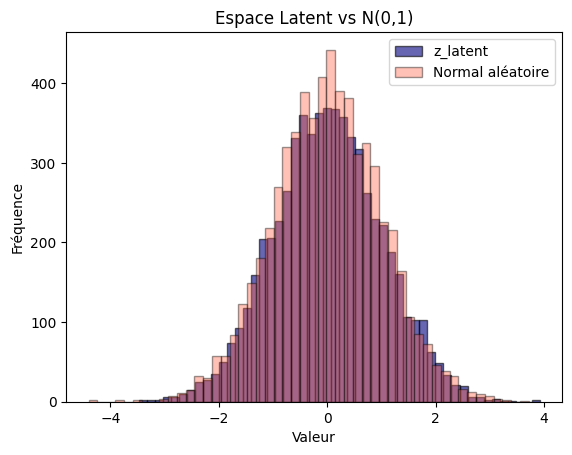

In [ ]:
plt.hist(z_latent.flatten(), bins=50, color='navy', alpha=0.6, label='z_latent', edgecolor='black') # Bleu foncé
plt.hist(np.random.normal(size=z_latent.flatten().shape[0]), bins=50, color='tomato', alpha=0.4, label='Normal aléatoire', edgecolor='black') # Rouge clair

# Ajout des étiquettes, titre et légende
plt.xlabel('Valeur')
plt.ylabel('Fréquence')
plt.title('Espace Latent vs N(0,1)')
plt.legend()

# Affichage du graphique
plt.show()

## Generer les scenarios avec le VAE

In [ ]:
import numpy as np

nb_scenarios = 1000
vect_norm = np.random.normal(loc=0, scale=1, size = (nb_scenarios, dim_latent)) # Vecteur de loi normale

sc = decoder.predict(vect_norm) # Passer dans décodeur

np_scena = sc.reshape(-1, 13) # Redimentionner pour pouvoir rescaler nos valeurs
scena = scaler.inverse_transform(np_scena) # on retrouve nos rendements prédits

scenarios = scena.reshape(nb_scenarios, 13, nb_jours_a_sequencer) # Reshape pour avoir 1000 scenarios, 13 assets et 5 jours de simulation

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


In [ ]:
# Appliquer les shocks sur le 5ieme prix le plus récent pour tous les actifs

taux_5_last = prix_5_jour.values[np.newaxis, 3:, np.newaxis] # 5ieme taux en partant de la fin
taux = taux_5_last + np.cumsum(scenarios[:,3:,:], axis = 2) # Appliquer les shocks sur 5 jours 1000 fois

stock_5_last = prix_5_jour.values[np.newaxis, :3, np.newaxis] # 5ieme prix des actions en partant de la fin
stock = stock_5_last*np.cumprod((1 + scenarios[:,:3,:]), axis = 2)

vae_scena = np.concatenate([stock, taux], axis = 1) # on a un numpy array de dimension 1000x13x5. Donc 1000 scenarios, 13 actifs et 5 jours de simu

In [ ]:
# Dictionnaire pour repérer le nom de l'asset avec sa position dans le numpy array
i = 0
dict_names = {}
for name in df_prix.columns:
  dict_names[name] = i
  i += 1
print(df_prix.columns)

Index(['sp500', 'Eurostock', 'EURUSD', '3M_EUR', '1Y_EUR', '5Y_EUR', '10Y_EUR',
       '30Y_EUR', '3M_USD', '1Y_USD', '5Y_USD', '10Y_USD', '30Y_USD'],
      dtype='object')


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def vae_plot(asset, scenarios, df_price):

  '''Fonction pour tracer les 1000 scenarios du VAE sur les 5 derniers jours'''
  df_price.index = pd.to_datetime(df_price.index)
  plt.figure(figsize=(14, 8))
  line1, = plt.plot(df_price.index, df_price[asset], color = "blue", label = "Prix reel")

  nb_asset = dict_names[asset]
  for i in range(1000):
    scenaris = np.concatenate([[df_price[asset].iloc[-6]], scenarios[i,nb_asset, :]], axis = 0)
    line2, = plt.plot(df_price.index[-6:], scenaris, color = "orange", alpha = 0.05, label = "VAE simulation")
  handles = [Line2D([0], [0], c='blue'), Line2D([0], [0], c='orange')]
  plt.legend(handles = handles, labels = ["Prix reel", "VAE simulation"])
  plt.xticks(rotation=45)
  plt.title("Scenarios VAE " + str(asset) , fontsize=16)
  plt.xlabel("Date", fontsize=14)
  plt.ylabel("Prix", fontsize=14)
  plt.grid(True)
  plt.show()
  return

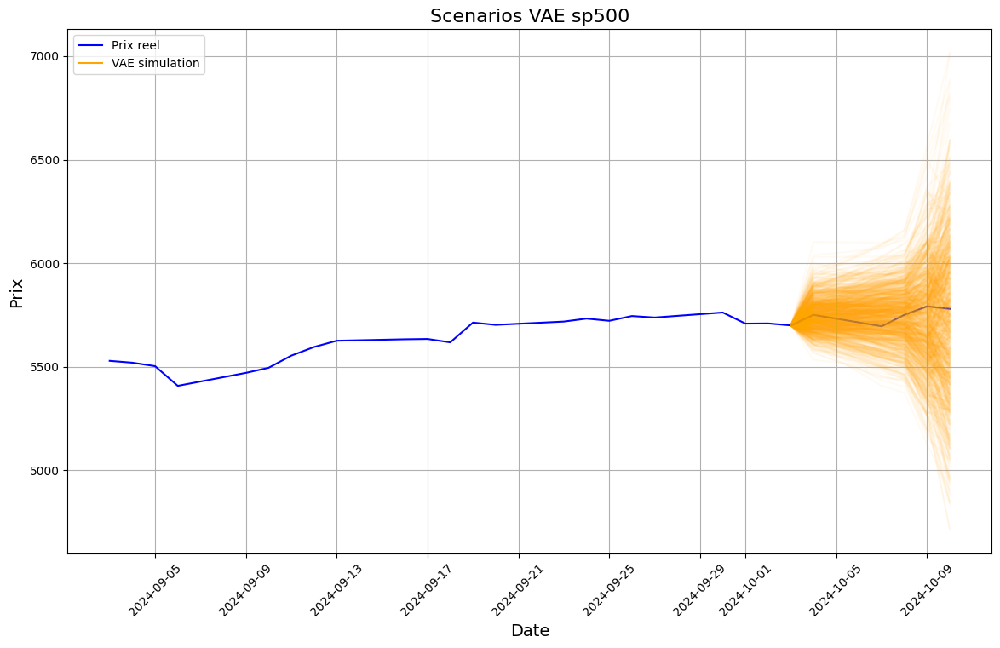

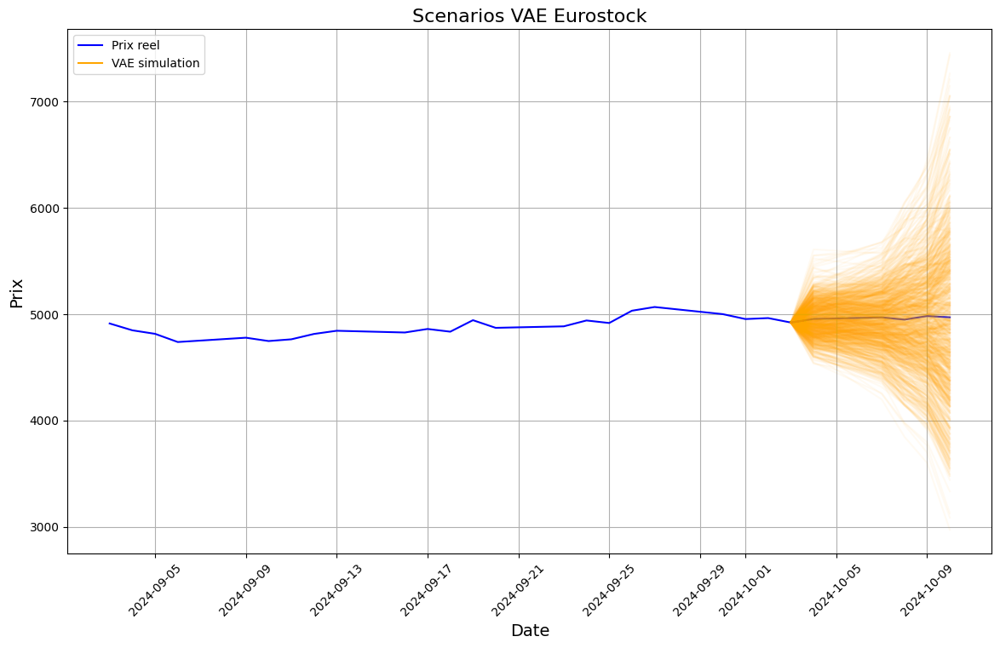

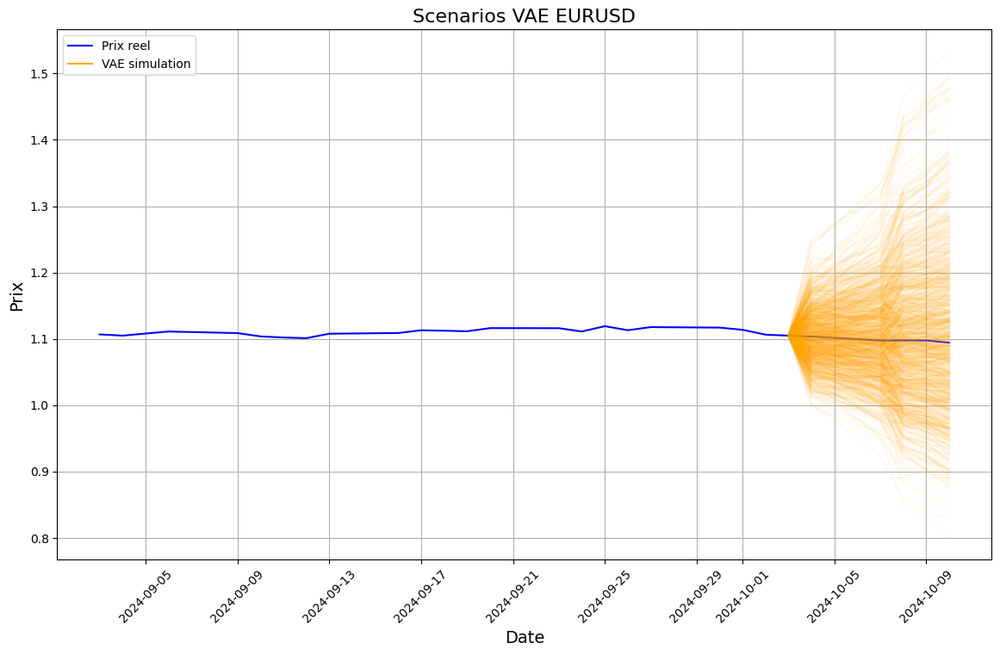

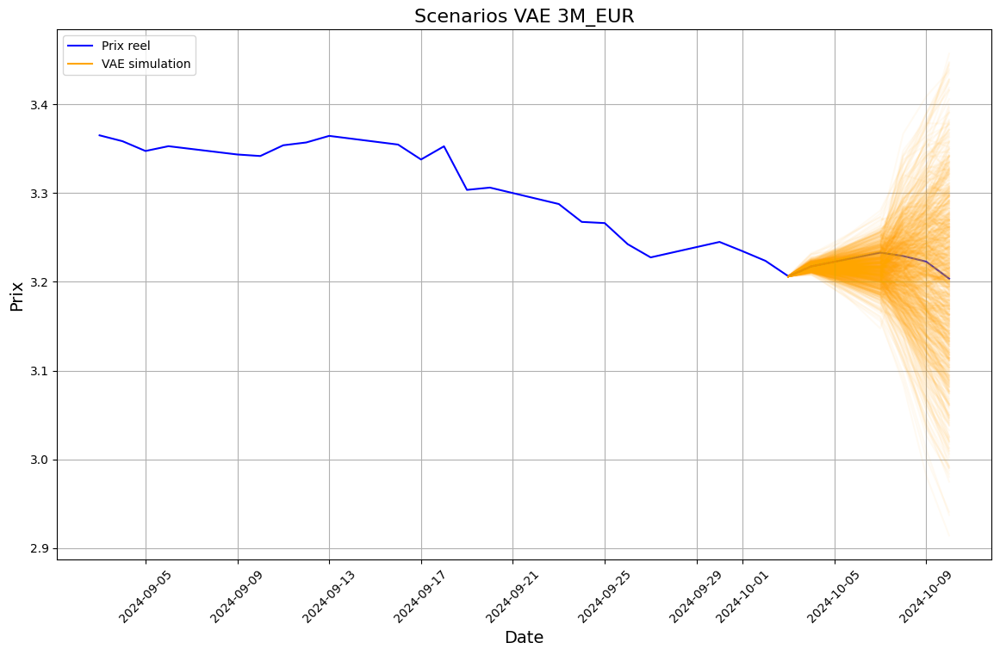

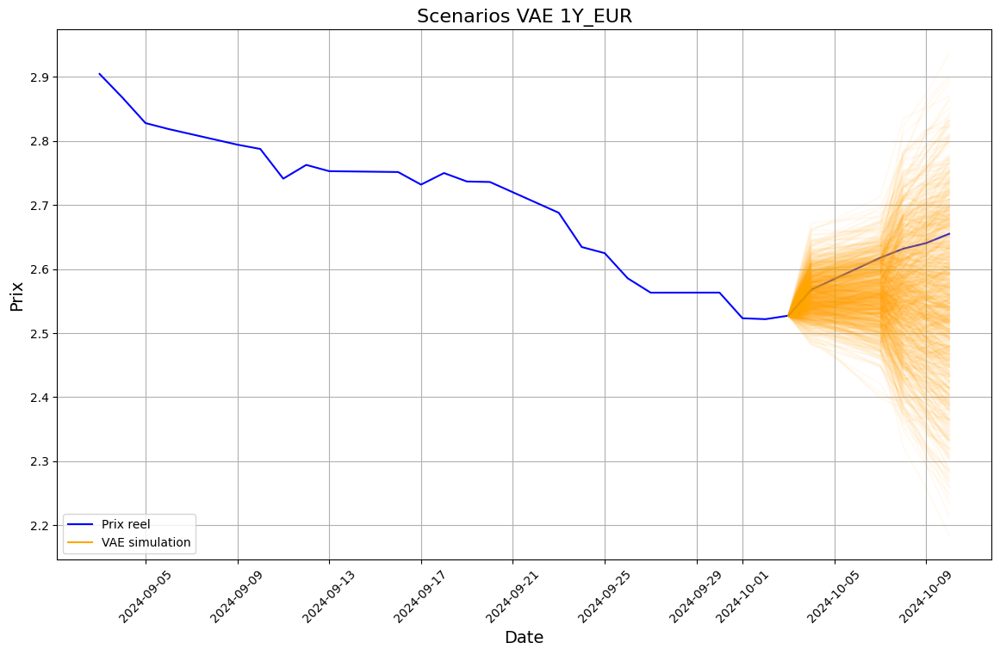

...

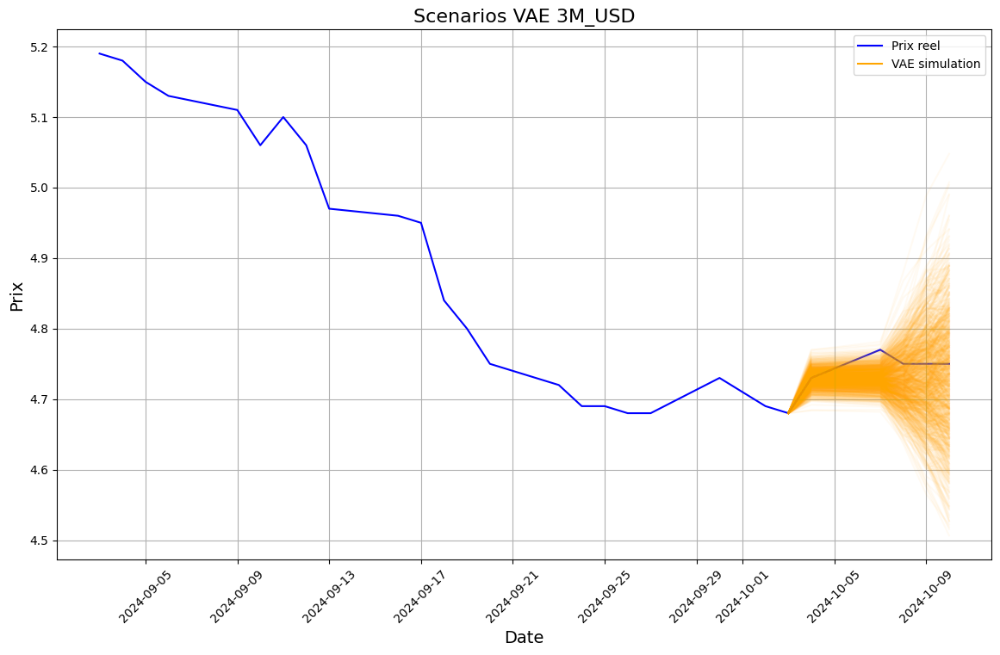

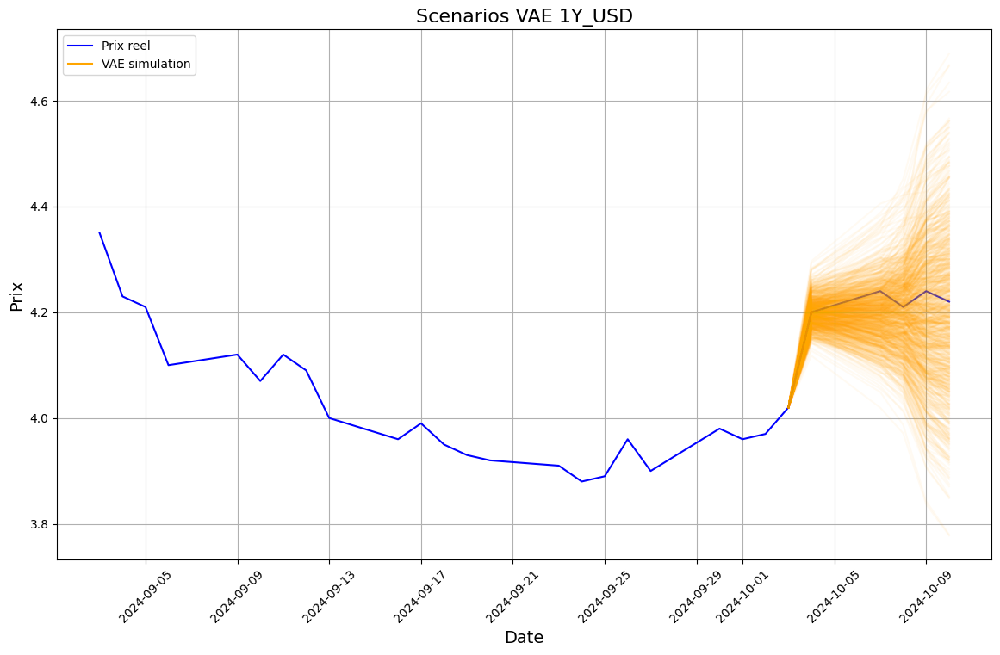

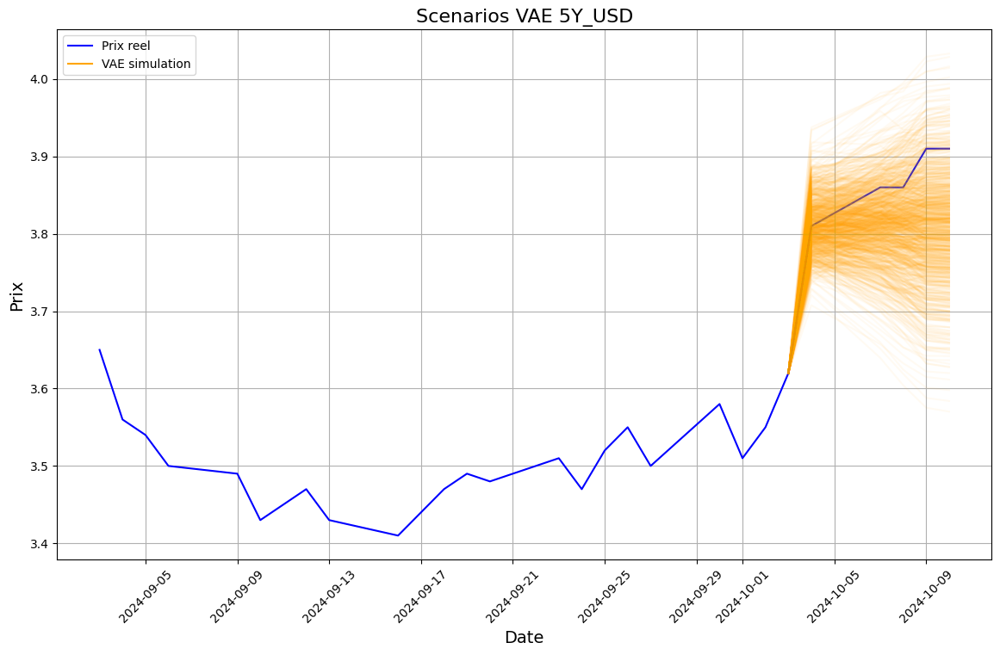

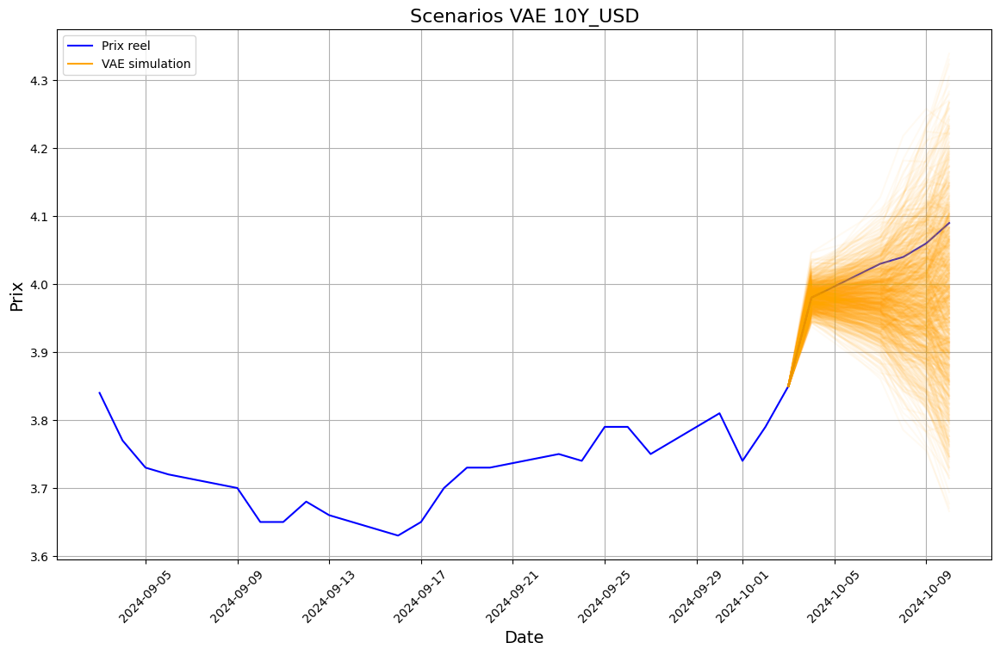

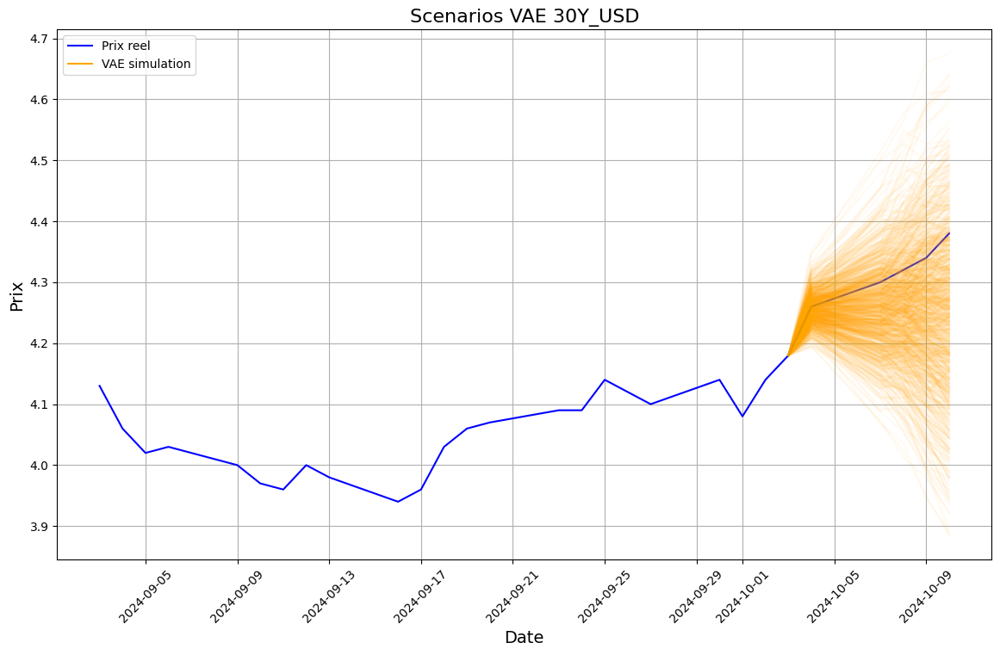

In [ ]:
# Faire un VAE pour les taux et un pour les actions, changes
# Modéliser les taux avec les prix zero coupons.
df_prix.index = pd.to_datetime(df_prix.index)
for asset in dict_names.keys():
  vae_plot(asset, vae_scena, df_prix[df_prix.index >= "2024-09-01"])

#### Autre fonction plot


In [ ]:
# Utilisation de la librarie plotly pour créer un graph interractif
# https://plotly.com/python/range-slider/
xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True),
        type="date"
    )


In [ ]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from datetime import datetime, timedelta

def vae_plots(asset, scenario, df_price):

  '''Fonction pour tracer les 1000 scenarios du VAE sur les 5 derniers jours'''

  fig = go.Figure()
  fig.add_trace(go.Scatter(mode='lines', x=df_price.index, y=df_price[asset]))

  nb_asset = dict_names[asset]
  for i in range(1000):
    scenaris = np.concatenate([[df_price[asset].iloc[-6]], scenario[i,nb_asset, :]], axis = 0)
    fig.add_trace(go.Scatter(mode='lines', x=df_price.index[-6:], y= scenaris, opacity = 0.05, line=dict(color='green'),showlegend=False))


  fig.update_layout(
      autosize=True,
      height=600,
      title= "Scenarios générés avec VAE pour " + str(asset),
      xaxis_title="Days",
      yaxis_title="Adjusted Close",
      template='plotly_white'
  )

  fig.update_layout(xaxis= xaxis)
  fig.show()

  return



In [ ]:
df_prix.index = pd.to_datetime(df_prix.index)
vae_plots("sp500", vae_scena, df_prix[df_prix.index >= "2024-09-01"])

#### Bootstrap

In [ ]:
def calcul_shock(df_ren, df_valeurs):

  stocks_actu = df_valeurs[['sp500', 'Eurostock','EURUSD']].values
  taux_actu = df_valeurs[['3M_EUR', '1Y_EUR', '5Y_EUR', '10Y_EUR', '30Y_EUR', '3M_USD', '1Y_USD',	'5Y_USD',	'10Y_USD','30Y_USD']].values

  # Calcul shock pour s&p Eurstock et Eurusd
  df_shock_stock = (1 + df_ren[['sp500', 'Eurostock', 'EURUSD']])*stocks_actu
  df_shock_stock = df_shock_stock.reset_index(drop=True)

  #Calcul shock pour les taux
  df_shock_taux = df_ren[['3M_EUR', '1Y_EUR', '5Y_EUR', '10Y_EUR', '30Y_EUR', '3M_USD', '1Y_USD',	'5Y_USD',	'10Y_USD','30Y_USD']] + taux_actu
  df_shock_taux = df_shock_taux.reset_index(drop=True)

  df_shock_1 = pd.concat([df_shock_stock, df_shock_taux], axis = 1)
  return df_shock_1

In [ ]:
import numpy as np
# Ici la matrice de shock prendra la forme d'un array de 3 dimension 1000*13*5 (nombre de scenarios)*(nombre asset)*(nombre de jours)

df_final_ren = df_rendements[:-5] # Exclure les 5 derniers jours
SHOCKS = []
days = 5
for d in range(1, days+1):
  df_boot = df_final_ren.sample(1000, replace = True)
  if d == 1:
    df_shock = calcul_shock(df_boot, prix_5_jour) # Calcul des 1000 premiers shocks sur les prix du 5eme dernier jour
    array_shock = df_shock.to_numpy()
    SHOCKS.append(array_shock)
  else:
    df_shock = calcul_shock(df_boot, df_shock)
    array_shock = df_shock.to_numpy()
    SHOCKS.append(array_shock)
array_shocks = np.stack(SHOCKS, axis = -1)

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def boot_plot(asset, scenarios, df_price):

  '''Fonction pour tracer les 1000 scenarios par bootstrap sur les 5 derniers jours'''
  df_price.index = pd.to_datetime(df_price.index)
  plt.figure(figsize=(14, 8))
  line1, = plt.plot(df_price.index, df_price[asset], color = "blue", label = "Prix reel")

  nb_asset = dict_names[asset]
  for i in range(1000):
    scenaris = np.concatenate([[df_price[asset].iloc[-6]], scenarios[i,nb_asset, :]], axis = 0)
    line2, = plt.plot(df_price.index[-6:], scenaris, color = "green", alpha = 0.07, label = "Bootstrap simulation")
  handles = [Line2D([0], [0], c='blue'), Line2D([0], [0], c='green')]
  plt.legend(handles = handles, labels = ["Prix reel", "Bootstrap simulation"])
  plt.xticks(rotation=45)
  plt.title("Scenarios Bootstrap " + str(asset) , fontsize=16)
  plt.xlabel("Date", fontsize=14)
  plt.ylabel("Prix", fontsize=14)
  plt.grid(True)
  plt.show()
  return

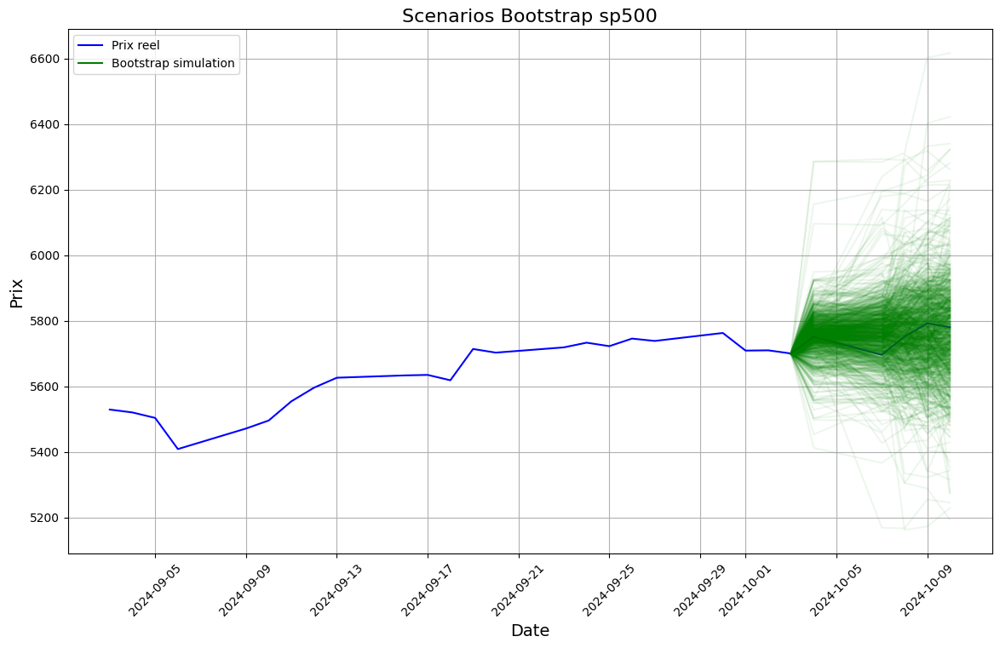

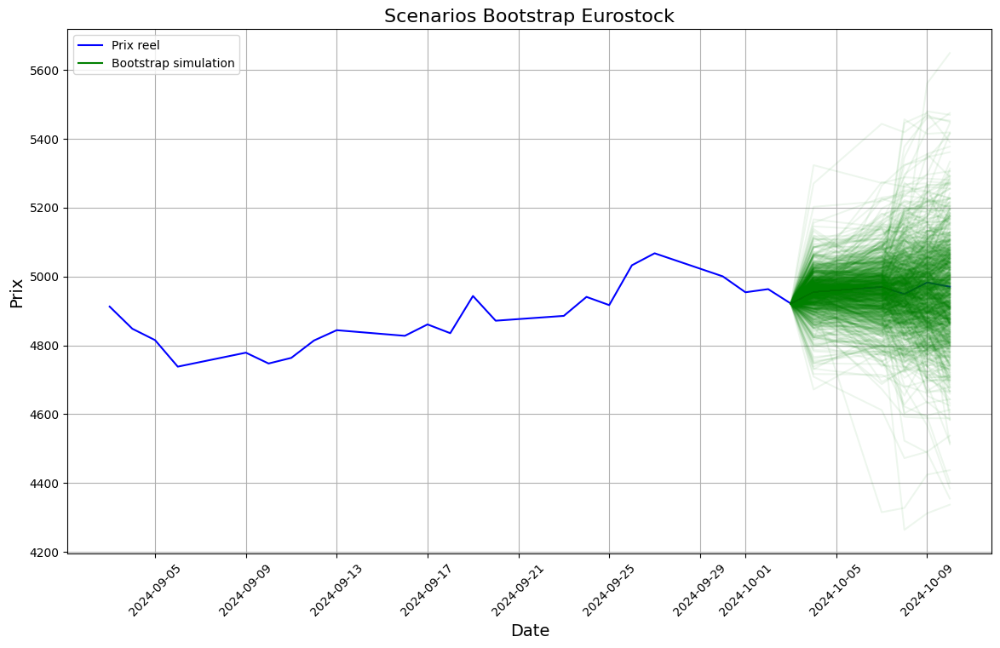

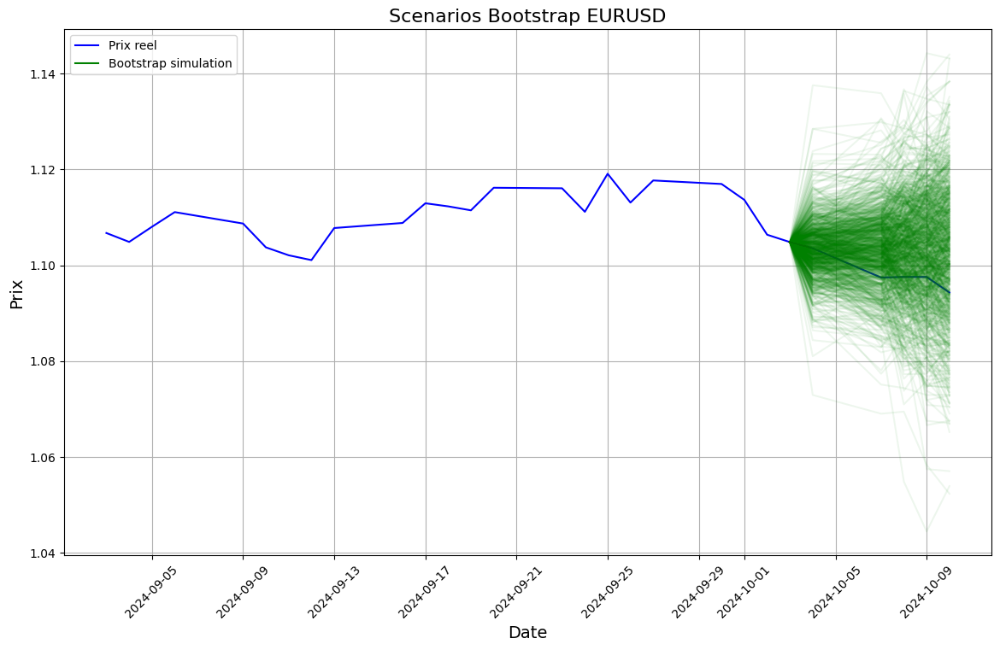

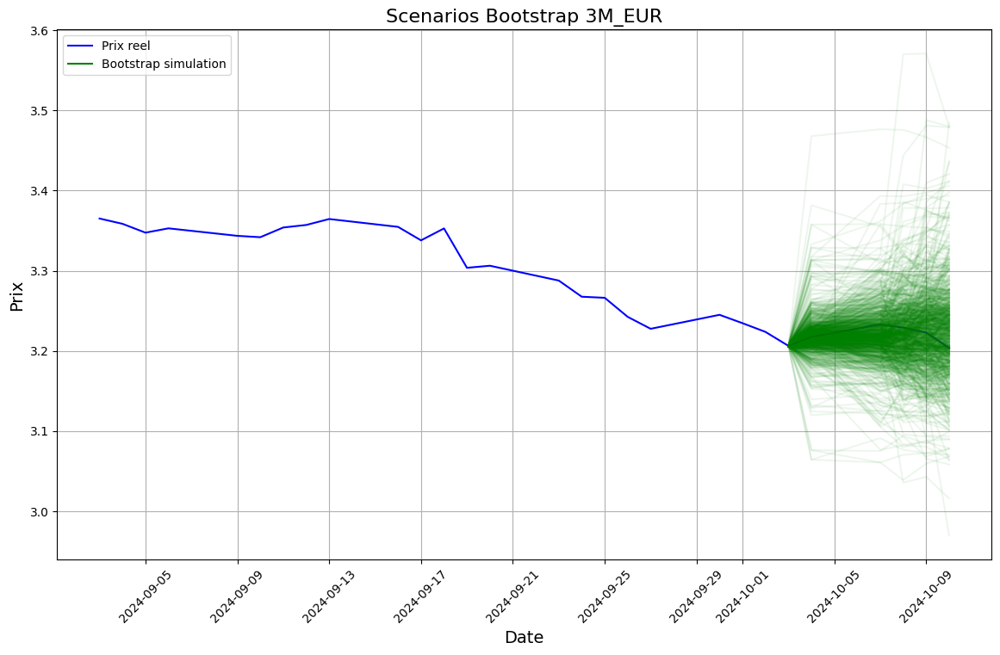

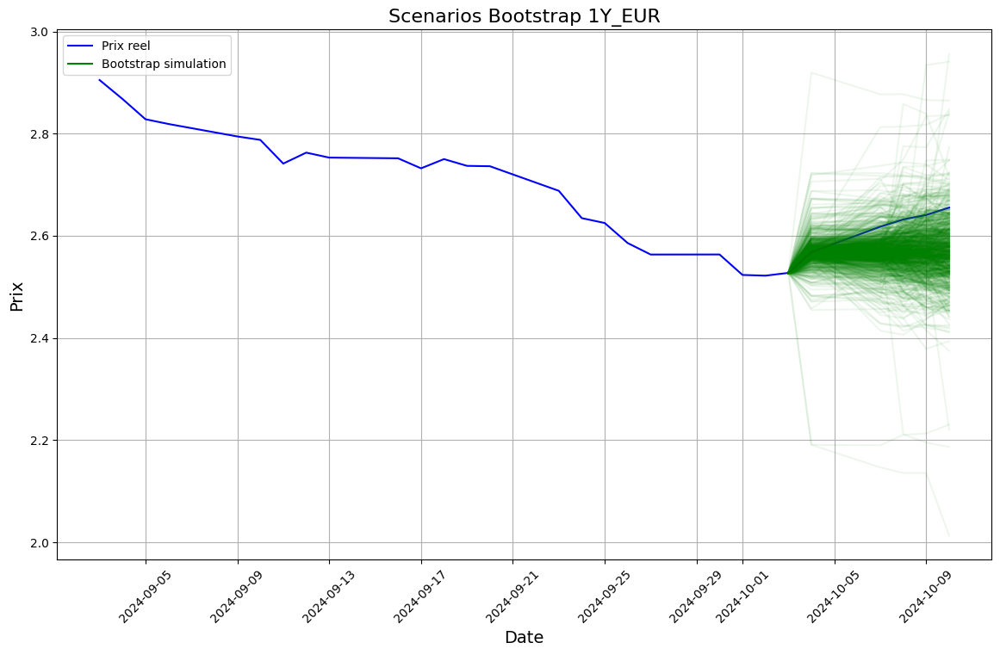

...

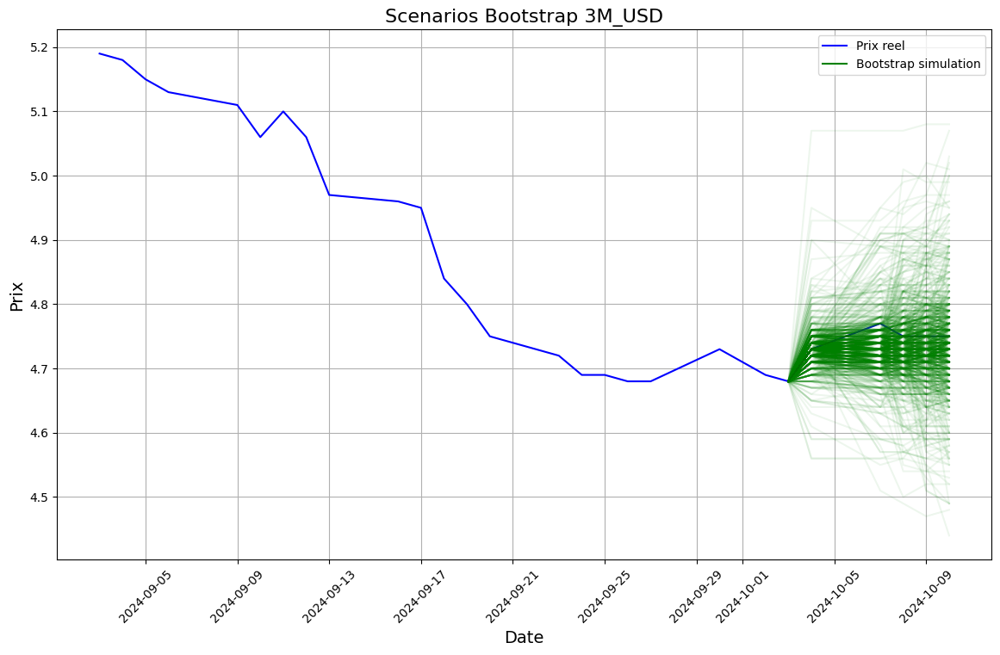

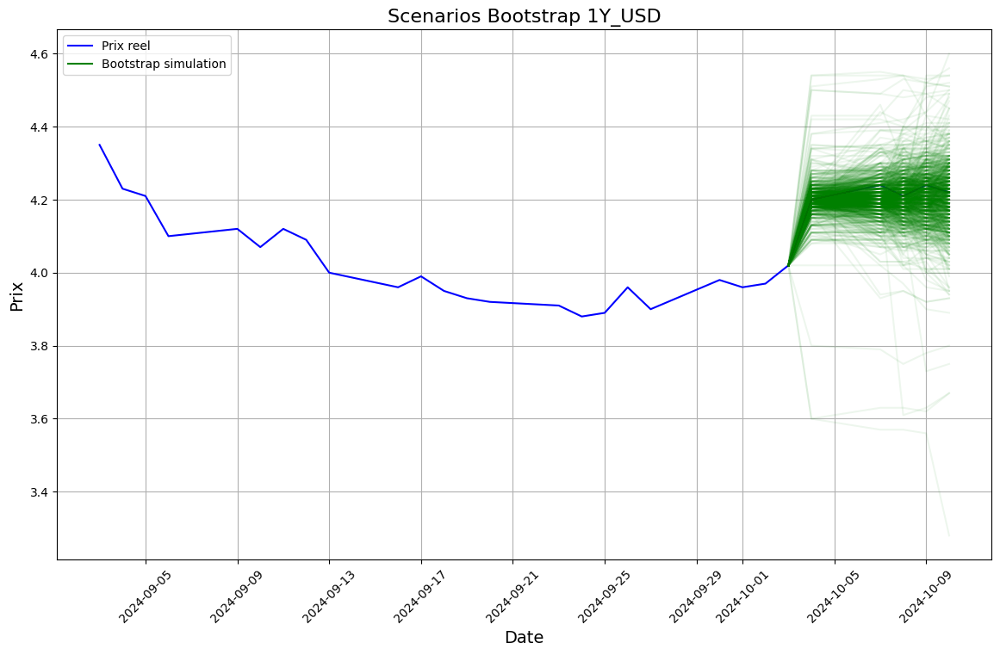

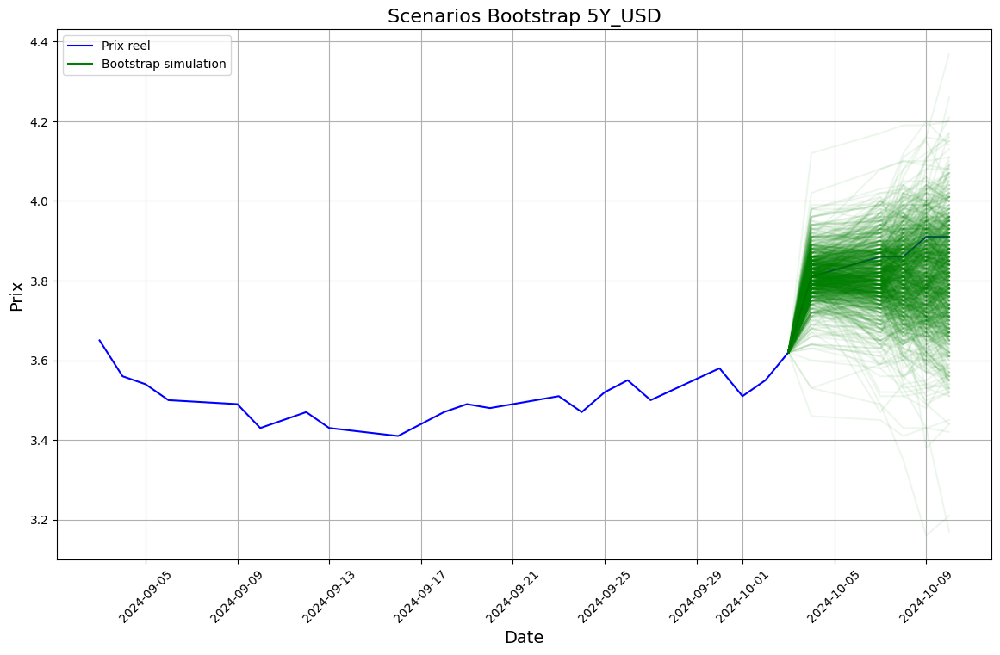

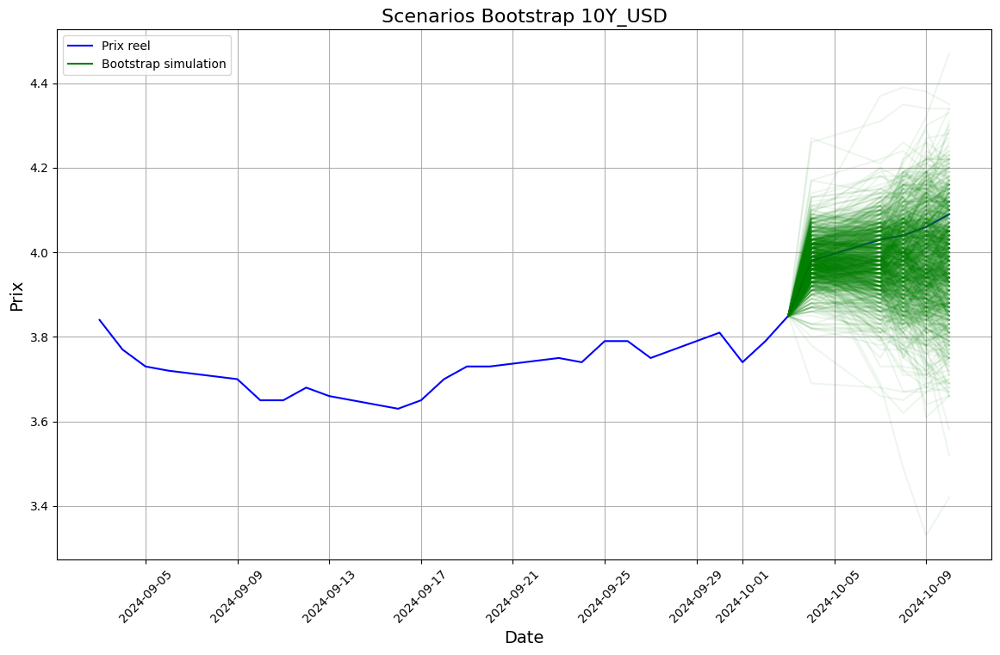

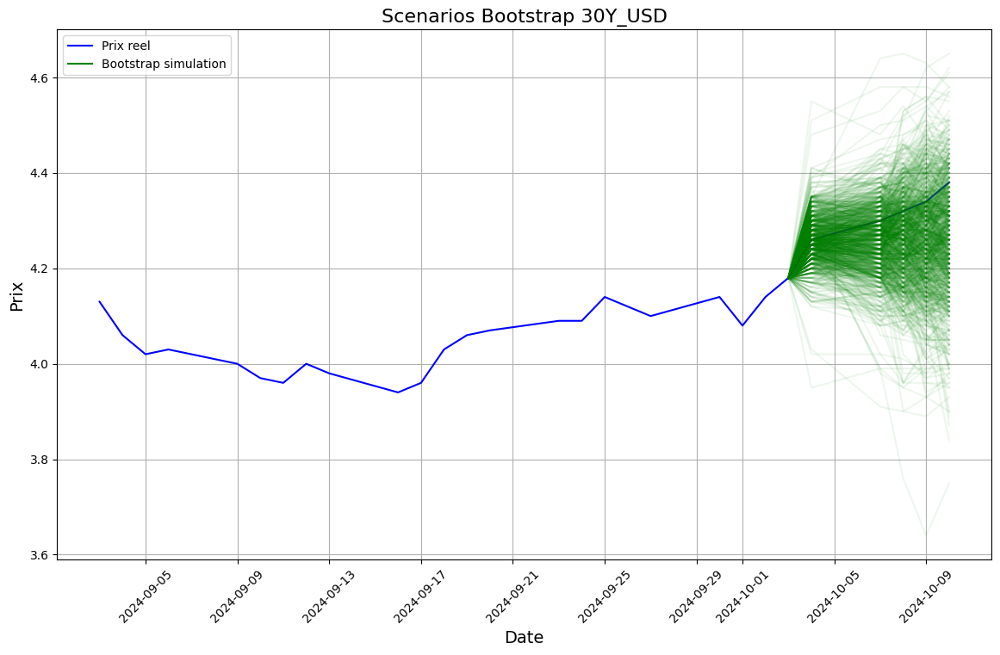

In [ ]:
df_prix.index = pd.to_datetime(df_prix.index)
for asset in dict_names.keys():
  boot_plot(asset, array_shocks, df_prix[df_prix.index >= "2024-09-01"])

#### Enregistrer sous PDF

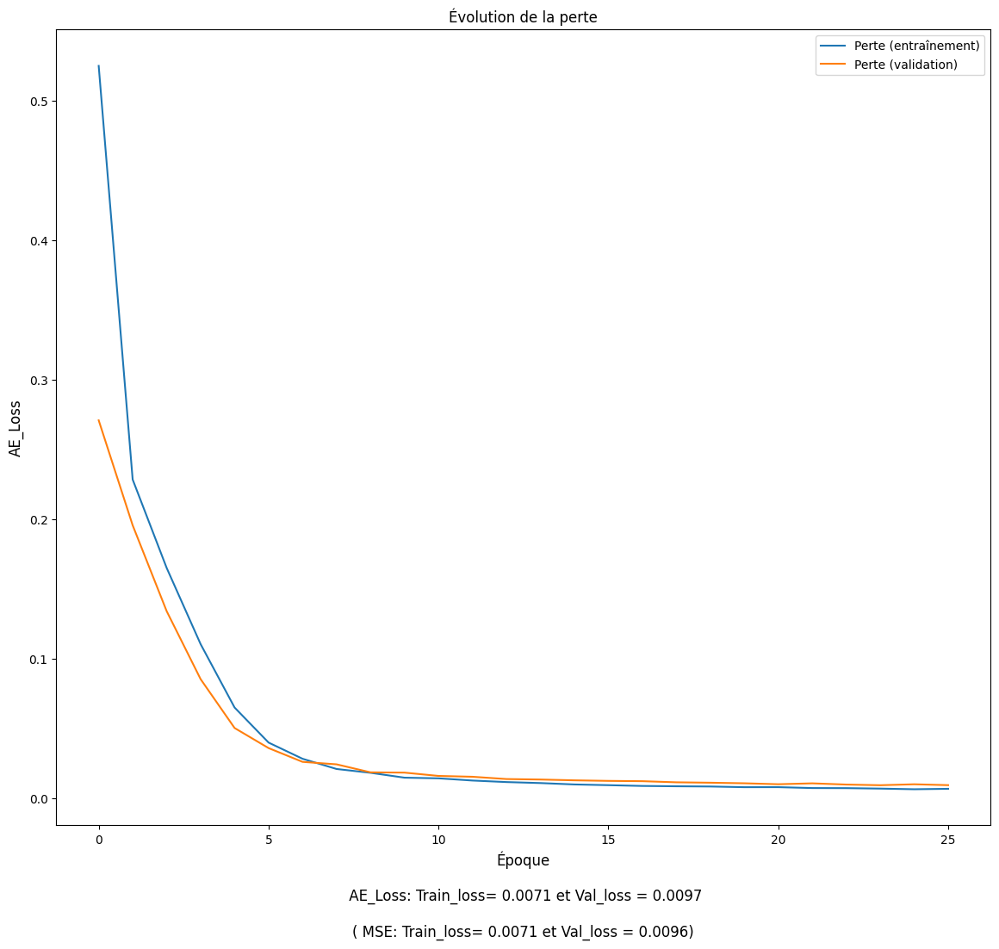

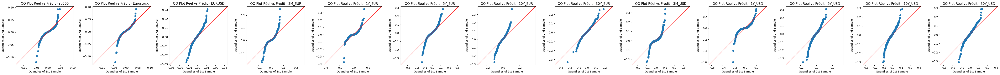


 0 sp500


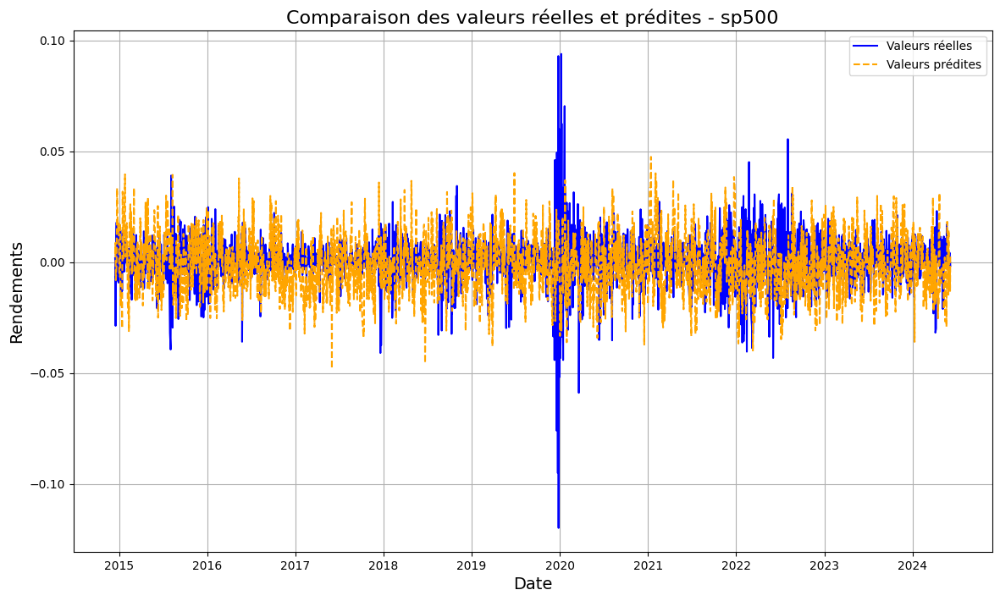


 1 Eurostock


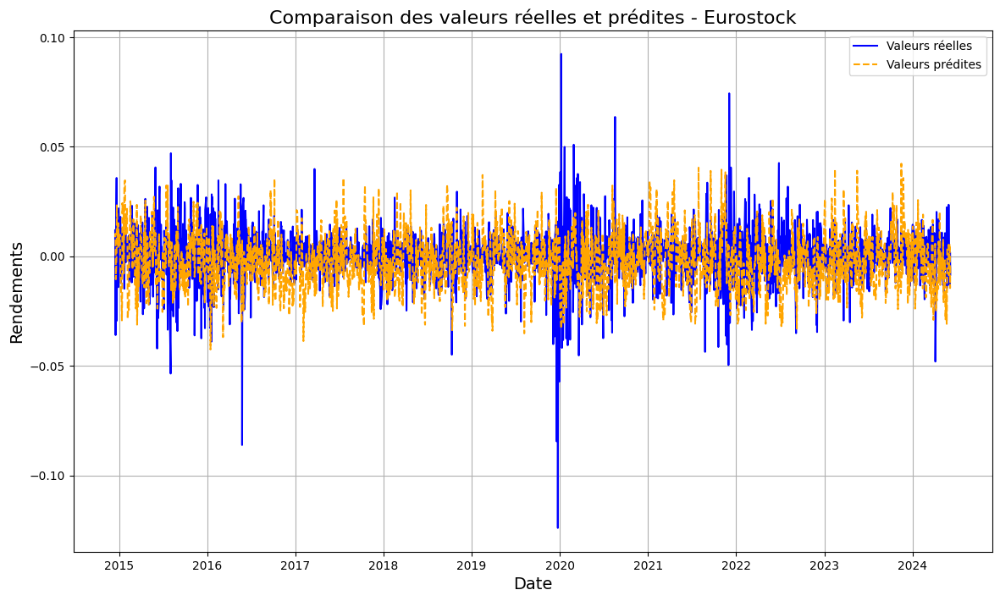


 2 EURUSD


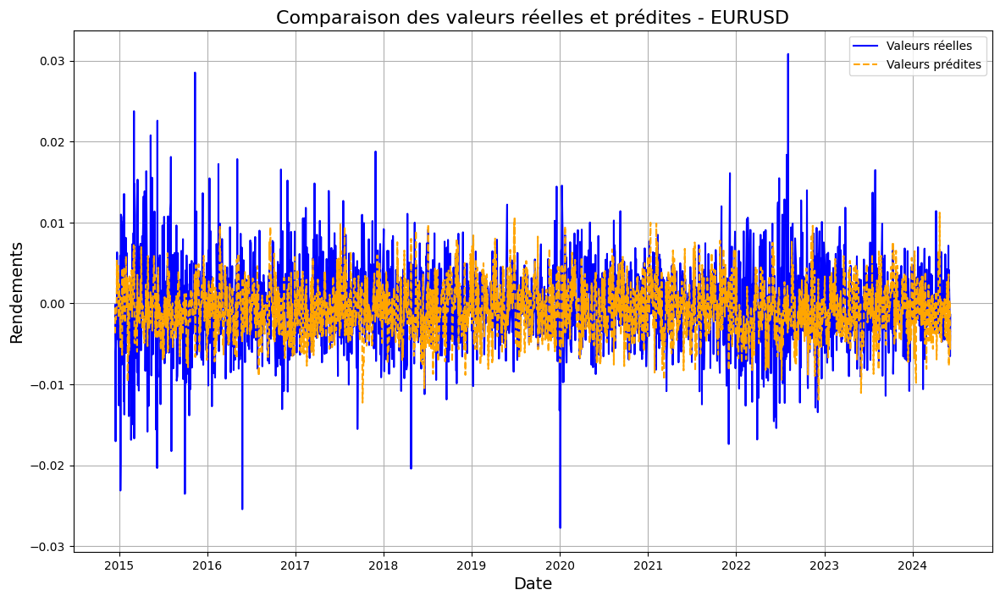


 3 3M_EUR


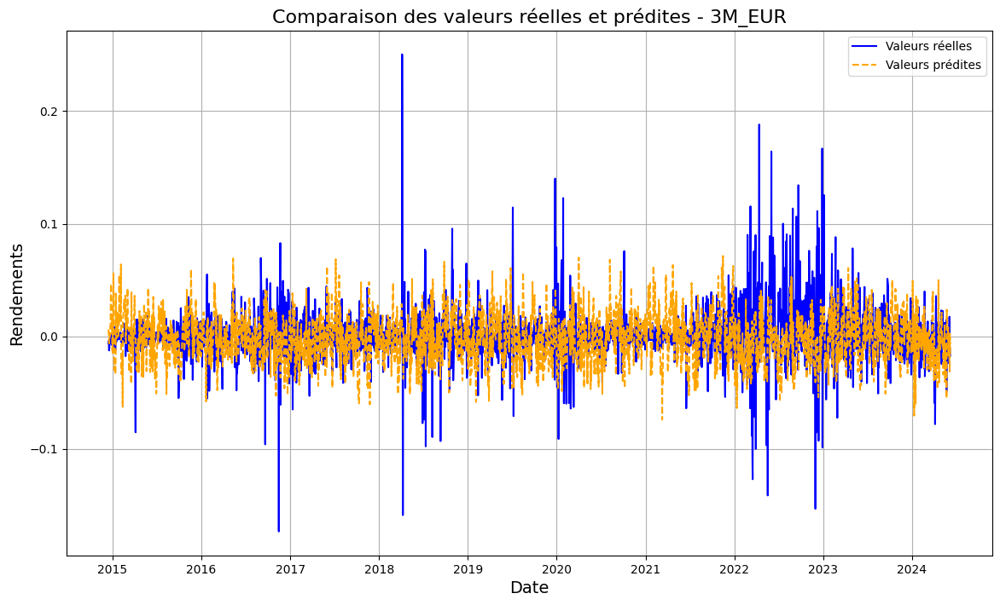


 4 1Y_EUR


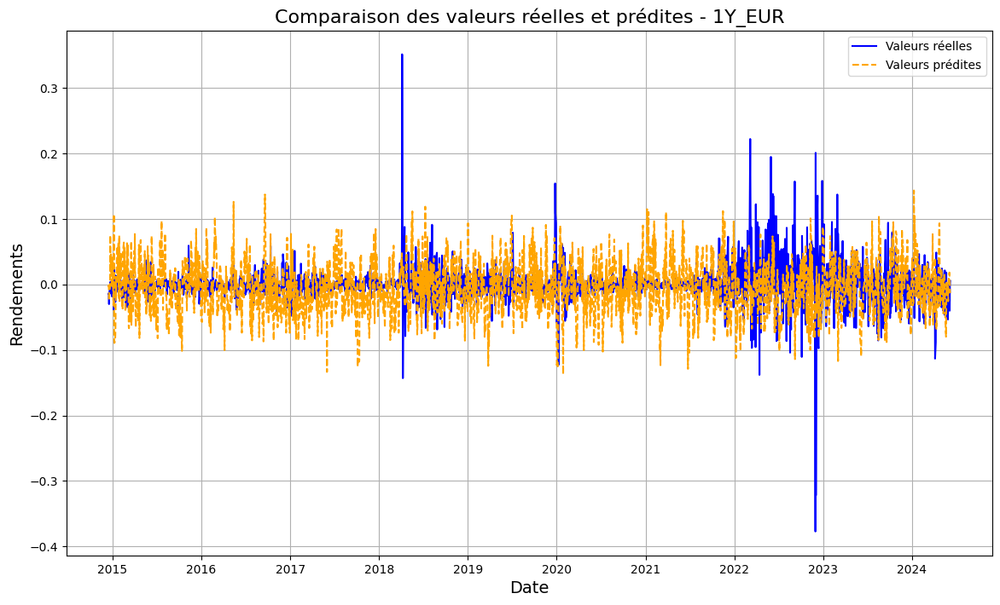


 5 5Y_EUR


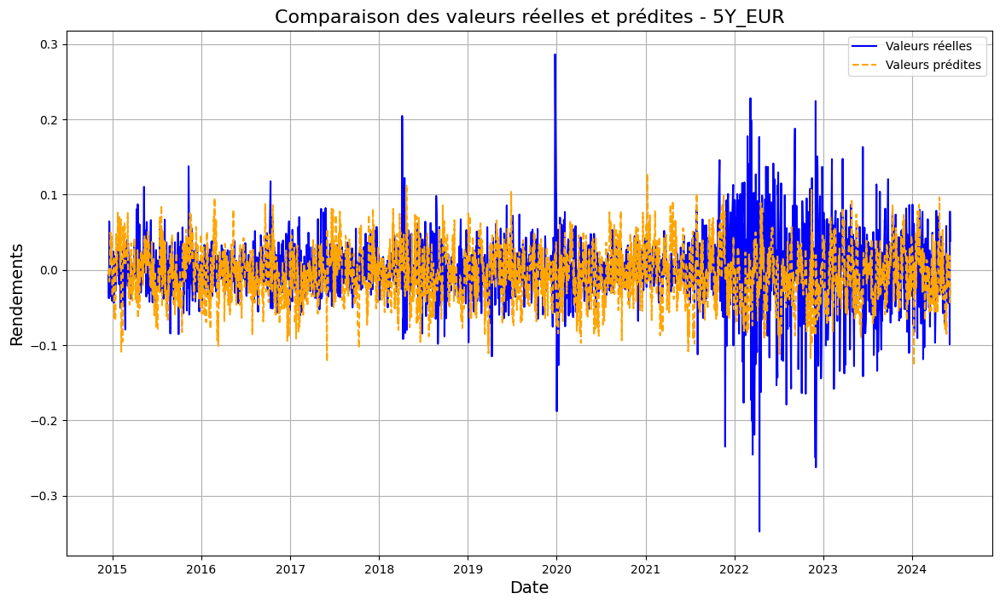


 6 10Y_EUR


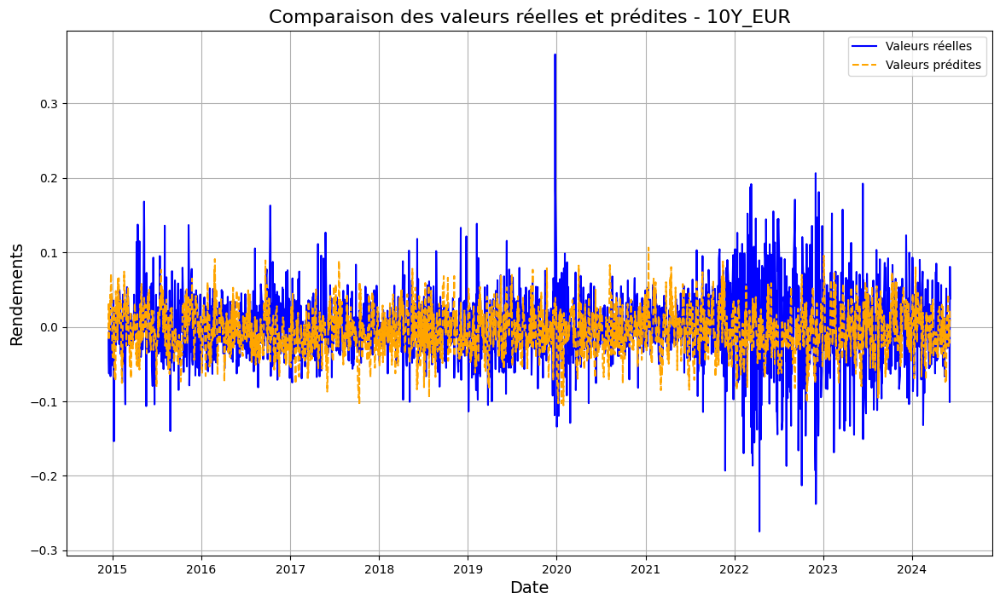


 7 30Y_EUR


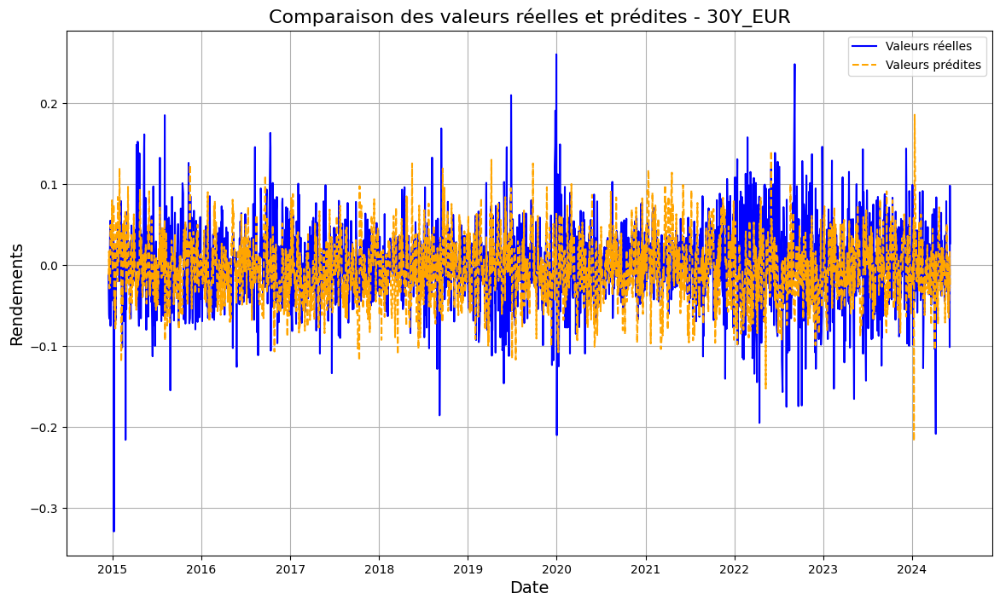


 8 3M_USD


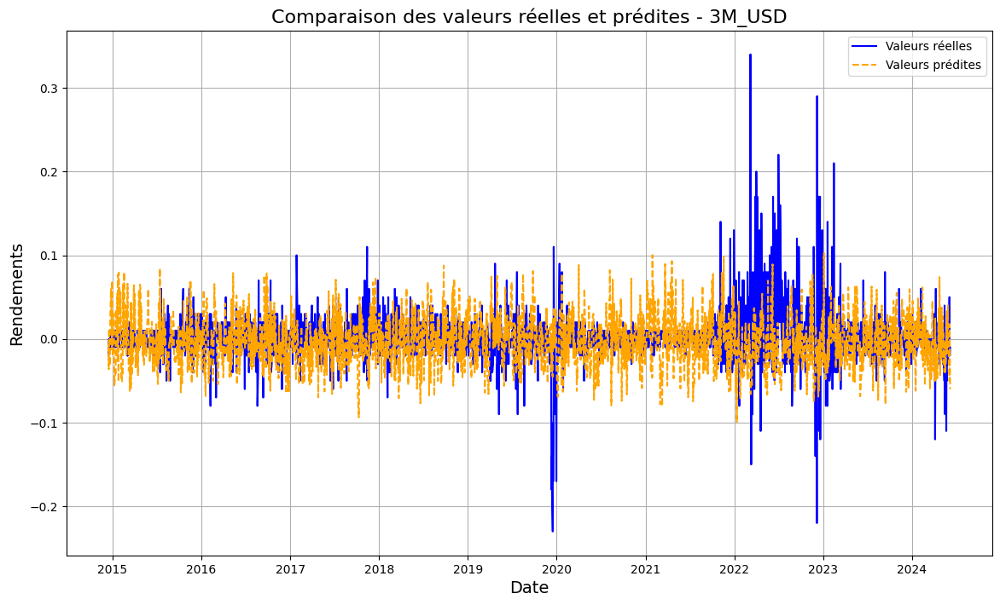


 9 1Y_USD


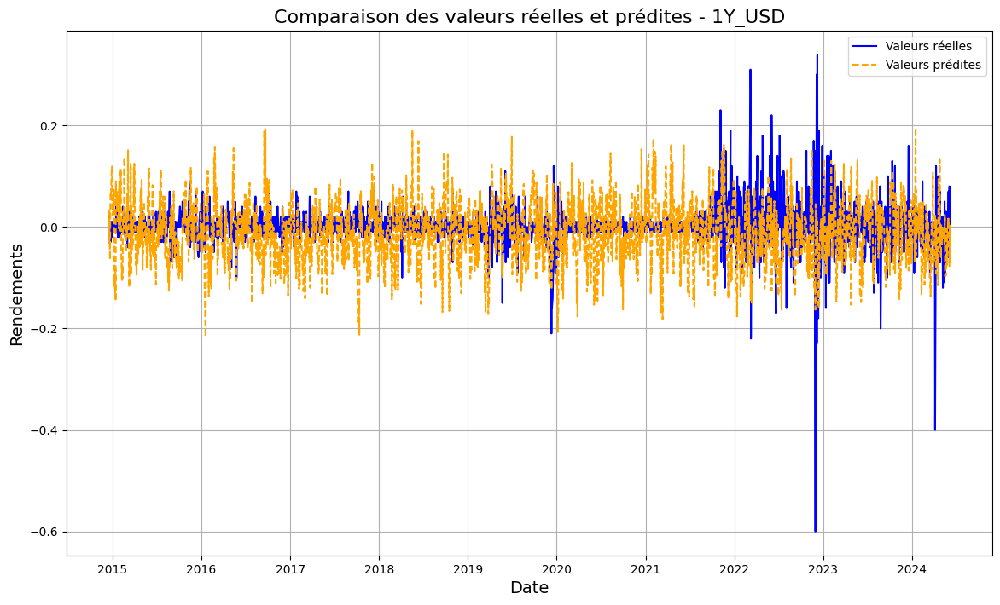


 10 5Y_USD


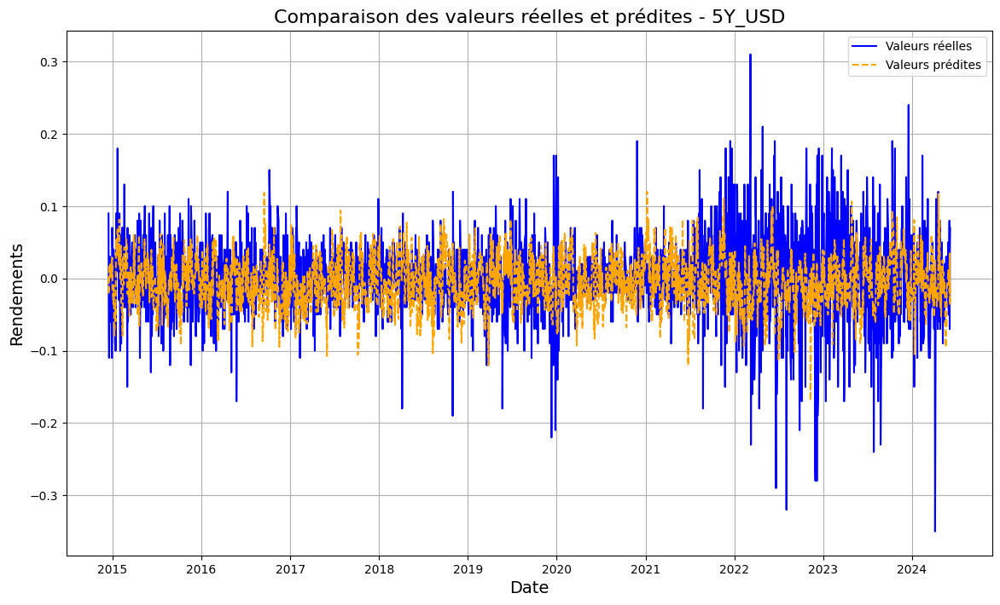


 11 10Y_USD


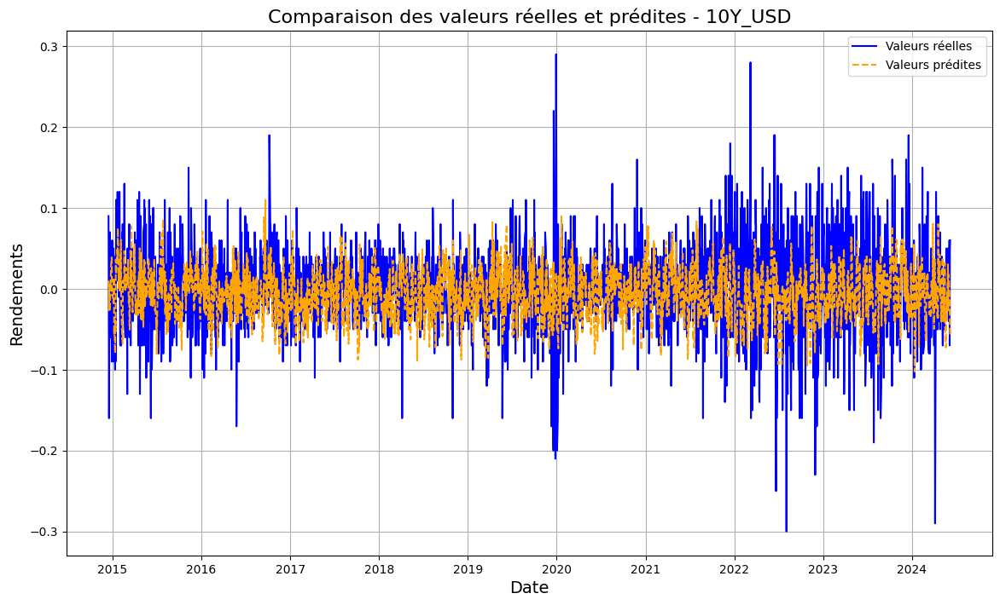


 12 30Y_USD


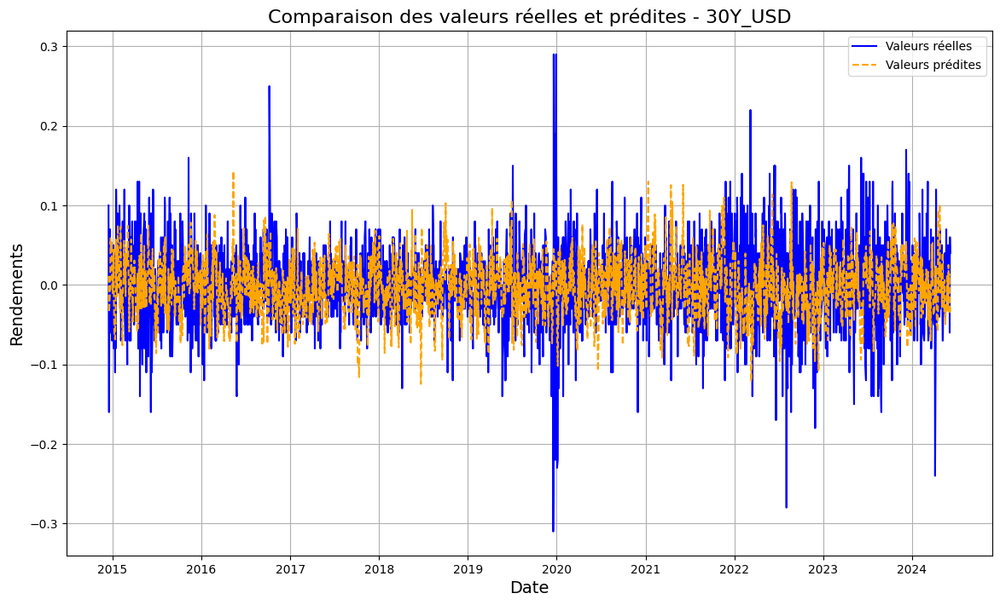

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages

# Fichier PDF pour enregistrer les graphiques
fichier_pdf = f'/content/drive/MyDrive/SharedData/AE_graphes_valeurs_reelles_vs_predites.pdf'


# Créer un calendrier de jours ouvrés personnalisé
us_business_day = CustomBusinessDay(calendar=USFederalHolidayCalendar())
date_index = pd.date_range(start=premier_jour, periods=donnees_reelles.shape[0], freq=us_business_day) #premier_jour : date de vos prix initiaux (en réalité, c'est une approximation car certaines dates sont exclues car outliers; cf la partie qui vise la préparation des données dans le premier projet sur le bootstrapping)



with PdfPages(fichier_pdf) as pdf:

  # Extraction des dernières valeurs de perte
  perte=list(pd.DataFrame(historique.history)[['loss','val_loss']].iloc[-1])
  metric=list(pd.DataFrame(historique.history)[['mse','val_mse']].iloc[-1])

  # Évolution de l'apprentissage
  plt.figure(figsize=(14, 12))
  plt.plot(historique.history['loss'], label='Perte (entraînement)')
  plt.plot(historique.history['val_loss'], label='Perte (validation)')
  plt.title(f'Évolution de la perte', fontsize=12)
  plt.xlabel('Époque' + f'\n\n AE_Loss: Train_loss= {perte[0]:.4f} et Val_loss = {perte[1]:.4f}' + f'\n\n( MSE: Train_loss= {metric[0]:.4f} et Val_loss = {metric[1]:.4f})', fontsize=12)
  plt.ylabel('AE_Loss', fontsize=12)
  plt.legend()
  # Enregistrer la figure actuelle dans le PDF
  pdf.savefig()
  plt.show()
  plt.close()  # Fermer la figure pour éviter les chevauchements


  ####################################################################################################################

  # Création de la grille de sous-graphiques pour chaque actif
  fig, ax = plt.subplots(1, nb_actifs, figsize=(4 * nb_actifs, 4))

  for i in range(nb_actifs):
    sm.qqplot_2samples(donnees_predites[:, i], donnees_reelles[:, i], line="45", ax=ax[i])
    ax[i].set_title(f'QQ Plot Réel vs Prédit - {list(df_rendements.columns)[i]}')  # Titre pour chaque actif

  # Ajustement de l'espacement
  plt.tight_layout()

  # Enregistrer la figure actuelle dans le PDF
  pdf.savefig()
  plt.show()
  plt.close()  # Fermer la figure pour éviter les chevauchements

  #####################################################################################################################

  for i in range(len(list(df_rendements.columns))):
    print('\n',i,list(df_rendements.columns)[i])
    # Extraire les séries temporelles pour l'actif numéro i
    numero_actif = i  # Numéro de l'actif pour généraliser
    reel_actif = donnees_reelles[:, numero_actif]  # Colonne correspondant au numéro de l'actif pour le premier actif
    pred_actif = donnees_predites[:, numero_actif]  # Colonne correspondant au numéro de l'actif pour les prédictions

    # Tracer les courbes des valeurs réelles et prédites pour le premier actif
    plt.figure(figsize=(14, 8))
    plt.plot(date_index,reel_actif, label='Valeurs réelles', color='blue')
    plt.plot(date_index,pred_actif, label='Valeurs prédites', color='orange', linestyle='--')
    plt.title("Comparaison des valeurs réelles et prédites" + f" - {list(df_rendements.columns)[i]}", fontsize=16)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel("Rendements", fontsize=14)
    plt.legend()
    plt.grid(True)


    # Enregistrer la figure actuelle dans le PDF
    pdf.savefig()


    # Affichage du graphique
    plt.show()

    plt.close()  # Fermer la figure pour éviter les chevauchements

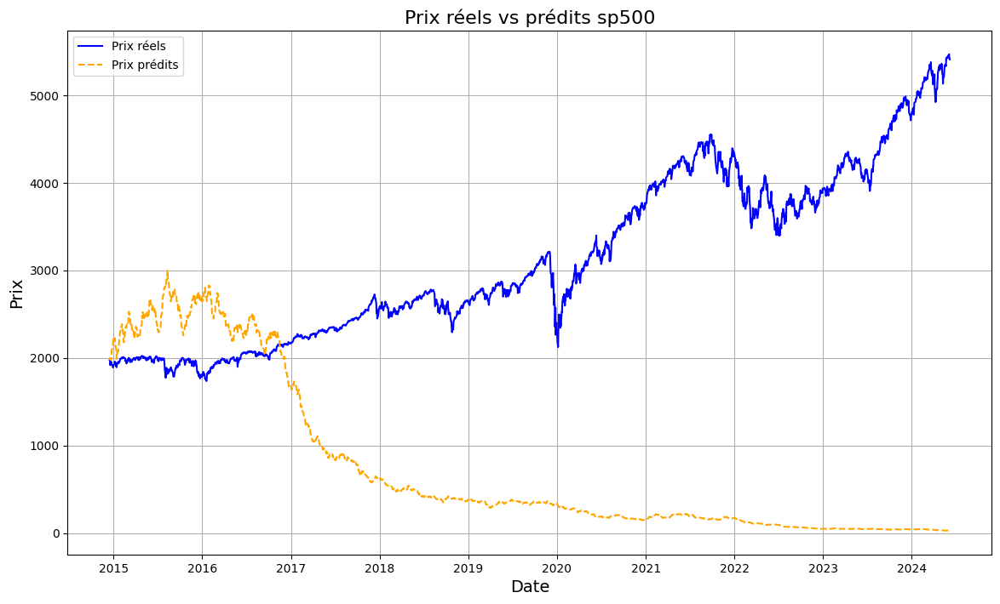

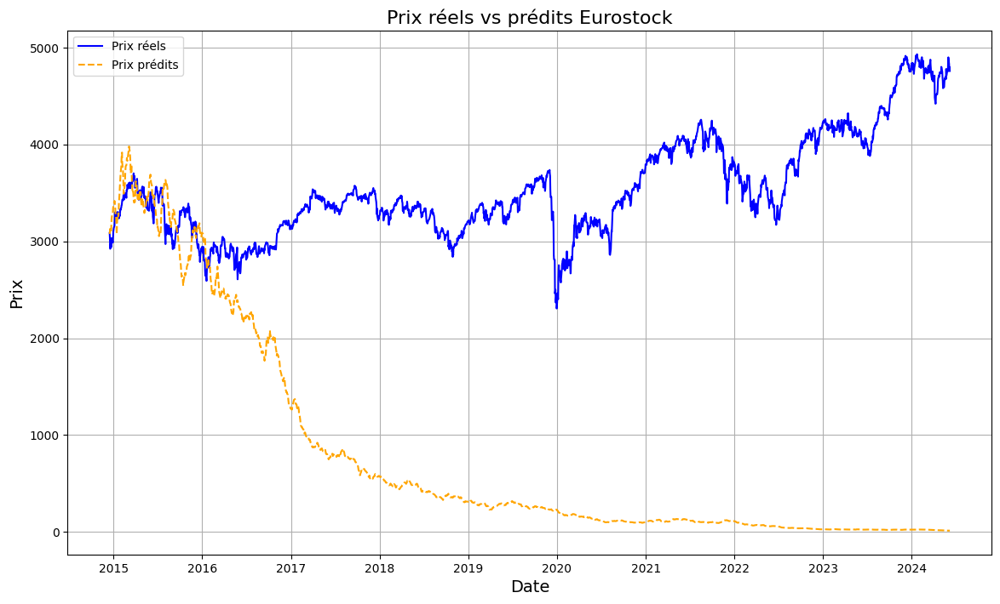

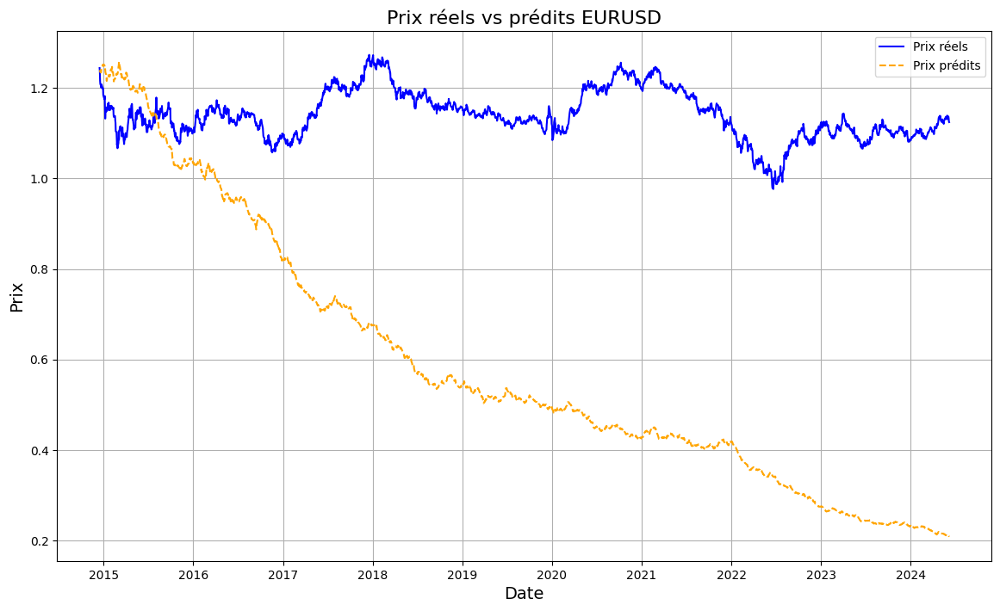

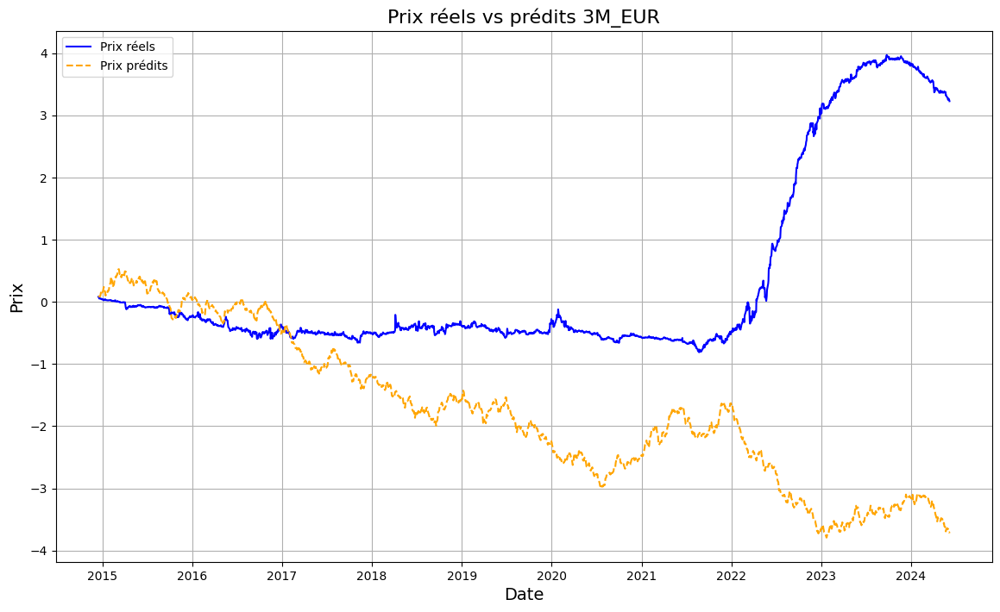

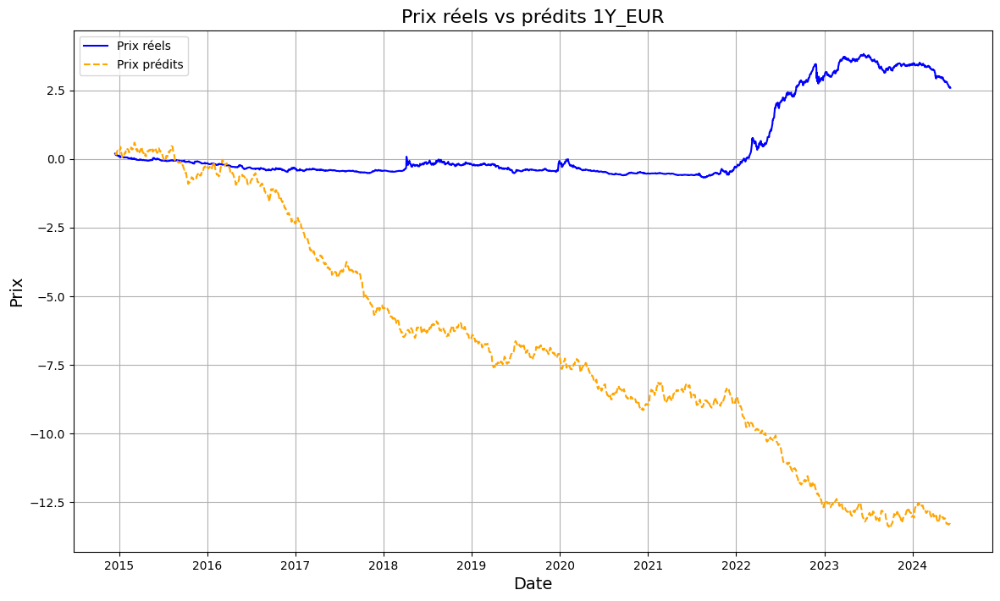

...

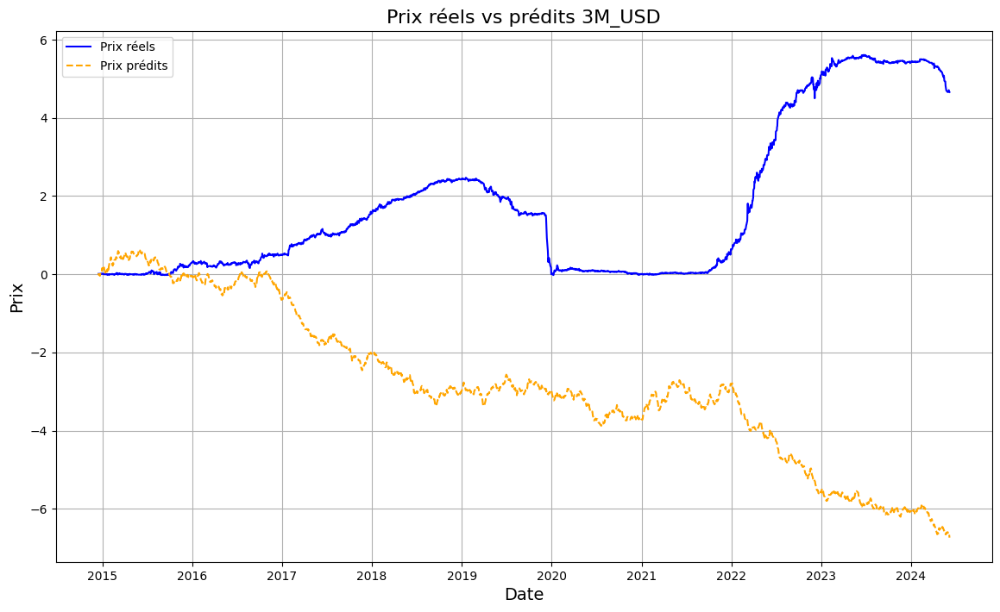

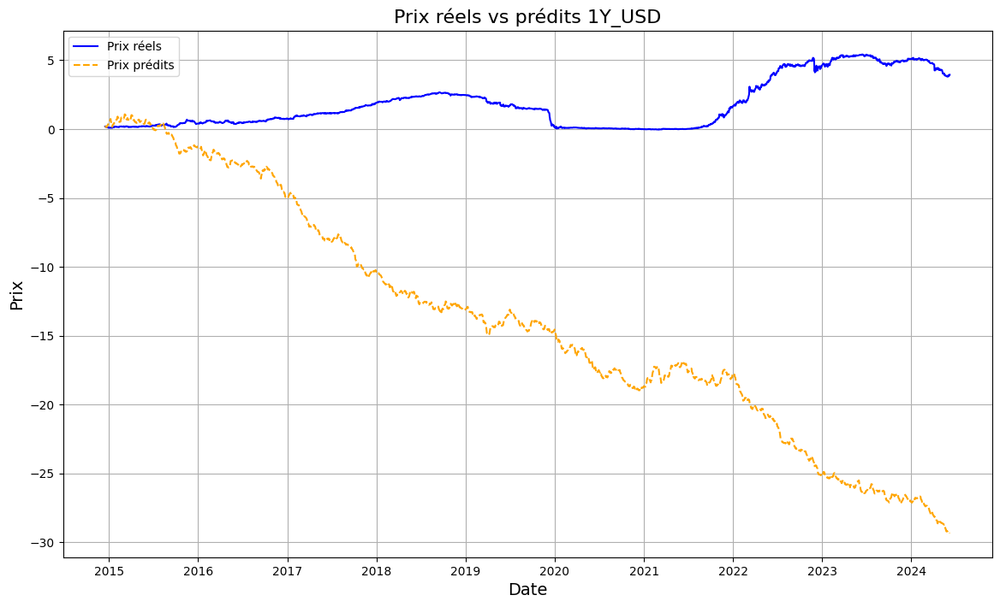

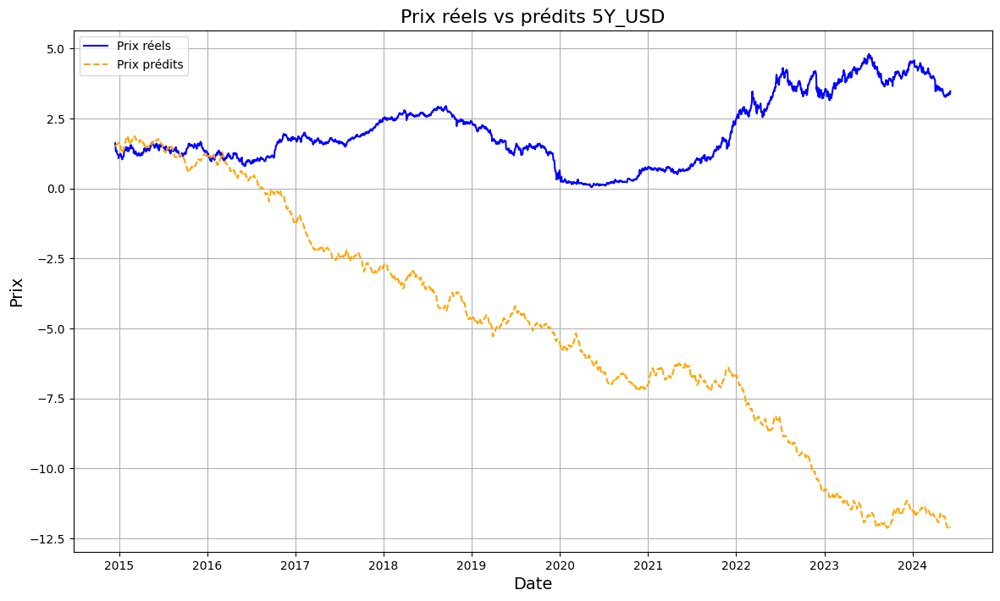

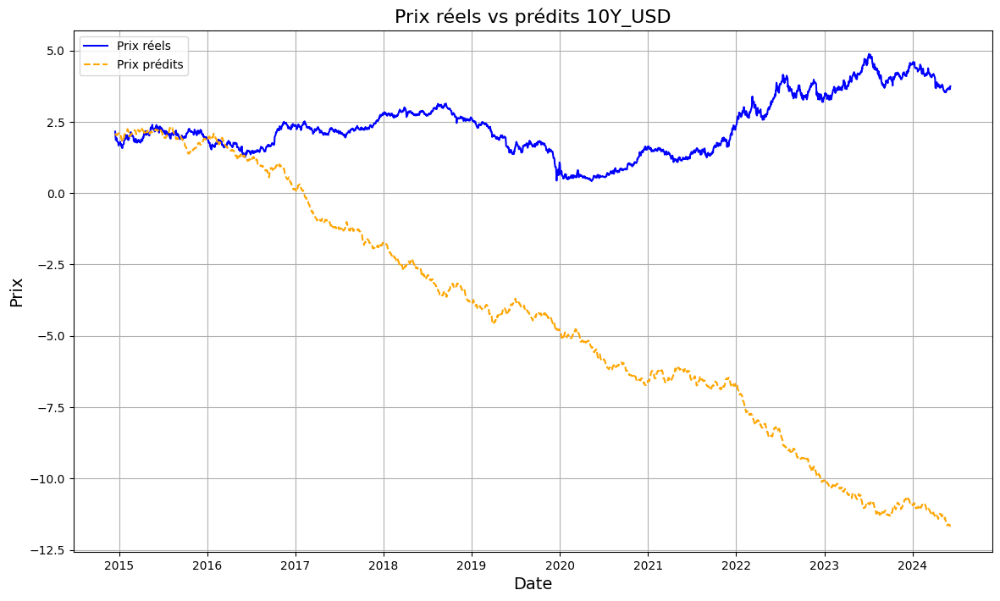

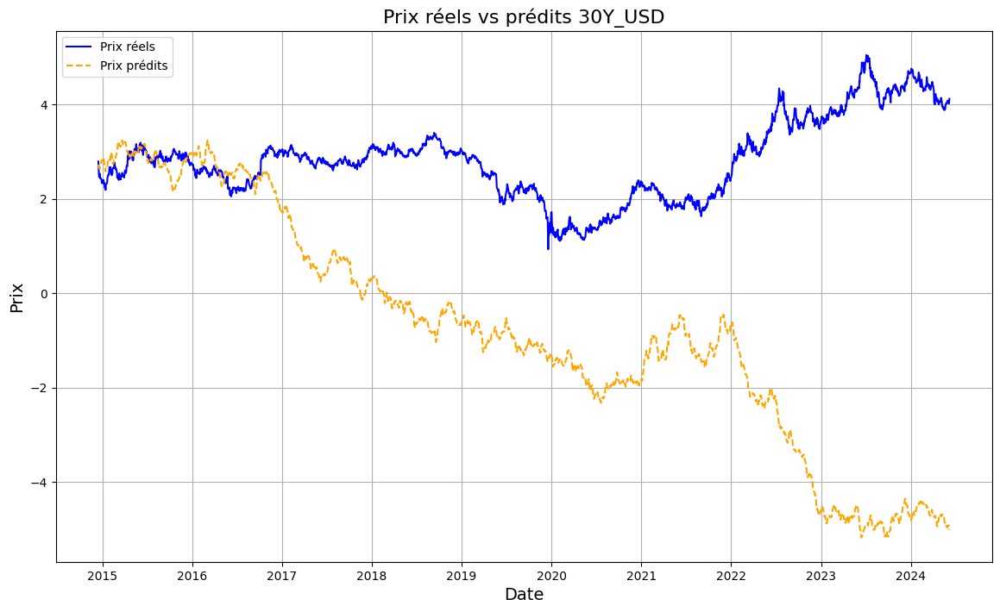

In [ ]:
# Tracer les courbes des valeurs réelles et prédites
fichier_pdf_2 = f'/content/drive/MyDrive/SharedData/VAE_valeurs_reelles_vs_predites.pdf'
with PdfPages(fichier_pdf_2) as pdf:
  for numero_actif in range(0,13):
    plt.figure(figsize=(14, 8))
    plt.plot(date_index,prix_reels[:,numero_actif], label='Prix réels', color='blue')
    plt.plot(date_index,prix_predits[:,numero_actif], label='Prix prédits', color='orange', linestyle='--')
    plt.title("Prix réels vs prédits " + str(col_names[numero_actif]) , fontsize=16)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel("Prix", fontsize=14)
    plt.legend()
    plt.grid(True)
    pdf.savefig()
    plt.show()
    plt.close()

##Pricing de swap

**Extraction des taux d'intérêts**

### Class swap

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import xml.etree.ElementTree as ET
import numpy as np
import pandas as pd
from itertools import zip_longest

file_path = '/content/drive/MyDrive/SharedData/InstrumentsT_C.xml'
tree = ET.parse(file_path)
root = tree.getroot()

fields = ['currency', 'fixedrateleg', 'startdate', 'maturitydate', 'frequency', 'daycount', 'couponrates',
          'referenceindex', 'spreads']

dict_fixed = {}
dict_float = {}

def print_xml(element, level=0):
    if element.tag == 'description':
      dict_fixed.setdefault('description', []).append(element.text)
      dict_float.setdefault('description', []).append(element.text)

    if element.tag == "fixedrateleg":
      dict_fixed.setdefault('type', []).append('fixed')
      element_kid = {x.tag: x.text for x in element}
      for item in fields:
        if item not in element_kid.keys():
          dict_fixed.setdefault(item, []).append(np.nan)
        else:
          dict_fixed.setdefault(item, []).append(element_kid[item])
    elif element.tag == "floatingrateleg":
      dict_float.setdefault('type', []).append('floating')
      element_kid = {x.tag: x.text for x in element}
      for item in fields:
        if item not in element_kid.keys():
          dict_float.setdefault(item, []).append(np.nan)
        else:
          dict_float.setdefault(item, []).append(element_kid[item])

    for child in element:
        print_xml(child, level + 1)

print_xml(root)
dict_fixed['description'] = dict_fixed['description'][:-1]
dict_float['description'] = dict_float['description'][:-1]
swap_data = {key: dict_fixed[key] + dict_float[key] for key in dict_fixed.keys()}
df_swap = pd.DataFrame(swap_data)
df_swap['tenor'] = ((pd.to_datetime(df_swap['maturitydate']) - pd.to_datetime(df_swap['startdate'])).dt.days / 365.25).round()

In [ ]:
swop1 = df_swap[df_swap.description == "Sample interest-rate swap"]
swop1.set_index(swop1.type, inplace = True)

In [ ]:
start_date = pd.to_datetime(prix_5_jour.to_frame().columns)
actif_a_conserver = [3, 4, 5, 6, 7]
data = vae_scena[:, actif_a_conserver, :]

In [ ]:
from datetime import datetime
from numba import njit
from dateutil.relativedelta import relativedelta

class price_swap:

  def __init__(self, start_date, tenor):
    self.start_date = start_date
    self.tenor = tenor

  def day_count_30_360(self, end):
    start  = self.start_date
    Y1, M1, D1 = start.year, start.month, start.day
    Y2, M2, D2 = end.year, end.month, end.day
    if D1 == 31:
        D1 = 30
    if D2 == 31 and D1 == 30:
        D2 = 30
    days = (Y2 - Y1) * 360 + (M2 - M1) * 30 + (D2 - D1)
    return days/360

  def day_count_act_360(self, end):
    start = self.start_date
    T = (end-start_date)
    return T.days/360

  def floating_grid(self, scenarios, frequency, spread, date_conv):
    start_date = self.start_date
    dates = [
    (start_date + relativedelta(months=12 * i // frequency))
    for i in range(self.tenor * frequency + 1)]

    if date_conv == 'Act/360':
      T = np.array([self.day_count_act_360(x) for x in dates if x != start_date])[:,0]
    elif date_conv == '30/360':
      T = np.array([self.day_count_30_360(x) for x in dates if x != start_date])[:,0]
    else:
      print(f"{date_conv} is not valid, please specify : Act/360 or 30/360")

    rate_grid = np.array([
        np.interp(T, [0.25, 1, 5, 10, 30], scenarios[i, :, j])
        for i in range(scenarios.shape[0])
        for j in range(scenarios.shape[2])
    ])

    rate_grid = np.stack([rate_grid[i:i+len(scenarios)] for i in range(0, len(scenarios)*5, len(scenarios))], axis=2)

    # Calcul des cash flows
    T1 = np.tile(T[1:], (len(scenarios), len(scenarios[0,0,:]), 1)).transpose(0, 2, 1)
    T2 = np.tile(T[:-1], (len(scenarios), len(scenarios[0,0,:]), 1)).transpose(0, 2, 1)
    diff_T = np.tile(1/(T[1:] - T[:-1]), (len(scenarios), len(scenarios[0,0,:]), 1)).transpose(0, 2, 1)

    cf_grid = np.array(((((1 + rate_grid[:,1:,:])**T1)/((1 + rate_grid[:,:-1, :])**T2)))**diff_T - 1 + spread)
    cf_grid = np.insert(cf_grid, 0, rate_grid[:,0,:] + spread, axis=1)

    # Calcul du discount factor
    exp = np.tile(T, (1000, 1))
    exp = np.repeat(exp[:,:, np.newaxis], 5, axis = 2)
    df = np.array((1 + rate_grid/100))** - exp

    # Calcul de la PV
    pv = cf_grid * df
    price = np.sum(pv, axis = 1)

    return price

  def fixed_grid(self, scenarios, frequency, coupon, date_conv):
    start_date = self.start_date
    dates = [
    (start_date + relativedelta(months=12 * i // frequency))
    for i in range(self.tenor * frequency + 1)]

    if date_conv == 'Act/360':
      T = np.array([self.day_count_act_360(x) for x in dates if x != start_date])
    elif date_conv == '30/360':
      T = np.array([self.day_count_30_360(x) for x in dates if x != start_date])
    else:
      print(f"{date_conv} is not valid, please specify : Act/360 or 30/360")

    # Interpoler les taux
    rate_grid = np.array([
        np.interp(T, [0.25, 1, 5, 10, 30], scenarios[i, :, j])
        for i in range(scenarios.shape[0])
        for j in range(scenarios.shape[2])
    ]).reshape(len(scenarios), len(T), len(scenarios[0,0,:]))

    # Calcul du discount factor
    exp = np.tile(T, (1000, 1))
    exp = np.repeat(exp[:,:, np.newaxis], 5, axis = 2)
    df = np.array((1 + rate_grid/100))** - exp

    # Calcul de la PV
    pv = coupon *  df
    price = np.sum(pv, axis = 1)

    return price

In [ ]:
def show_fig(fig):
    _pylab_helpers.Gcf.set_active(fig.canvas.manager)
    plt.show()

In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/SharedData')

file_path = '/content/drive/MyDrive/SharedData/data_assets_ren.csv'
file_path = '/content/drive/MyDrive/SharedData/data_assets.csv'

df_prix = pd.read_csv(file_path, index_col = 0)
df_rendements = pd.read_csv(file_path, index_col = 0)

from vae import vae

A = vae(df_rendements, df_prix)

In [ ]:
from price_swap import price_swap
tenor = int(swop['tenor']['fixed']/2)
# startdate = sswop['startdate']['fixed']
# startdate = datetime.strptime(startdate, '%Y-%m-%d')
# startdate = start_date[0]
swap = price_swap(start_date[0], tenor)

In [ ]:
for i in range(13):
  show_fig(model.predict_vae_price[i])

TypeError: 'NoneType' object is not subscriptable

In [ ]:
from price_swap import Swap_pricer
# swap
swop = swop1.to_dict()
tenor = int(swop['tenor']['fixed']/2)
# startdate = sswop['startdate']['fixed']
# startdate = datetime.strptime(startdate, '%Y-%m-%d')
#startdate = start_date[0]
swap = price_swap(start_date[0], tenor)
f = swap.floating_grid(data, int(swop['frequency']['floating']), float(swop['spreads']['floating'])*100, swop['daycount']['floating'])
r = swap.fixed_grid(data, int(swop['frequency']['fixed']), float(swop['couponrates']['fixed']) * 100, swop['daycount']['fixed'])

ImportError: cannot import name 'Swap_pricer' from 'price_swap' (/content/drive/MyDrive/SharedData/price_swap.py)

In [ ]:
f

array([[24.99 , 24.008, 24.85 , 24.667, 24.68 ],
       [25.098, 24.048, 24.813, 24.641, 24.705],
       [25.148, 23.804, 24.744, 24.615, 24.614],
       ...,
       [24.837, 25.129, 24.524, 23.786, 25.015],
       [24.895, 25.102, 24.602, 23.741, 25.024],
       [25.044, 25.077, 25.049, 23.478, 25.025]])

In [ ]:
r

array([[18.528, 18.544, 18.56 , 18.577, 18.593],
       [18.717, 18.718, 18.719, 18.72 , 18.721],
       [18.495, 18.524, 18.553, 18.583, 18.612],
       ...,
       [18.581, 18.597, 18.613, 18.629, 18.645],
       [18.662, 18.663, 18.664, 18.665, 18.666],
       [18.549, 18.563, 18.577, 18.591, 18.606]])

In [ ]:
np.mean(f[:,0]-r[:,0])

20446.60330828309

In [ ]:

from datetime import datetime, timedelta
from numba import njit
import random

class swap:

  def __init__(self, start_date, tenor):
      self.start_date = start_date
      self.tenor = tenor
      self.fixed_leg = None
      self.floating_leg = None
      self.term_fixed = None
      self.term_float = None
      self.date_float = None
      self.date_fixed = None

  def create_term(self, frequency, date_conv, fixed_float):
    self.build_dates(frequency, date_conv, fixed_float)

  def add_fixed_leg(self, taux):
    self.term(taux, fixed_float = 'fixed')
    self.fixed_leg = fixed_leg(self.start_date, self.tenor, self.term_fixed)

  def add_floating_leg(self, taux, spread):
    self.term(taux, fixed_float = 'float')
    self.floating_leg = floating_leg(self.start_date, self.tenor, self.term_float, spread)

  def day_count_30_360(self, end):
    start  = self.start_date
    Y1, M1, D1 = start.year, start.month, start.day
    Y2, M2, D2 = end.year, end.month, end.day
    if D1 == 31:
        D1 = 30
    if D2 == 31 and D1 == 30:
        D2 = 30
    days = (Y2 - Y1) * 360 + (M2 - M1) * 30 + (D2 - D1)
    return days[0]/360

  def day_count_act_360(self, end):
    start  = self.start_date
    return (end-start_date).days[0]/360

  def build_dates(self, frequency, date_conv, fixed_float):
    num_years = self.tenor
    annual_dates = [pd.to_datetime(start_date + pd.DateOffset(months=12*i/int(frequency)), format = "%Y-%m-%d")  for i in range(num_years*frequency + 1)]
    tx = pd.DataFrame(annual_dates, columns = ['Pay date'])

    if date_conv == 'Act/360':
      tx['T'] = tx['Pay date'].apply(lambda x: self.day_count_act_360(x))
    elif date_conv == '30/360':
      tx['T'] = tx['Pay date'].apply(lambda x: self.day_count_30_360(x))
    else:
      print(f"{date_conv} is not valid, please specify : Act/360 or 30/360")

    if fixed_float == 'float':
      self.date_float = tx
    elif fixed_float == 'fixed':
      self.date_fixed = tx
    else:
      print(f"{fixed_float} is not valid, please specify : fixed or float")

    return tx


  def term(self, taux, fixed_float):

    if fixed_float == 'float':
      tx = self.date_float
    elif fixed_float == 'fixed':
      tx = self.date_fixed
    else:
      print(f"{fixed_float} is not valid, please specify : fixed or float")
    taux.index = [0.25, 1, 5, 10, 30]
    T1 = pd.DataFrame(index=tx['T'])
    df_combined = pd.concat([T1, taux], axis=1)
    df_combined = df_combined.sort_index()
    interpol = df_combined.interpolate(method='index')
    interpol.columns = ['taux']
    interpol['T'] = interpol.index
    df = pd.merge(tx, interpol, on = ['T'], how = "left").dropna()
    df.index = df['Pay date']
    df = df.drop('Pay date', axis = 1)
    df['DF'] = 1/((1 + df['taux']/100)**df['T'])

    if fixed_float == 'float':
      self.term_float = df
    elif fixed_float == 'fixed':
      self.term_fixed = df
    else:
      print(f"{fixed_float} is not valid, please specify : fixed or float")
    return df

class fixed_leg(swap):

  def __init__(self, start_date, tenor, term_fixed):
    super().__init__(start_date, tenor)
    self.tenor = tenor
    self.term_fixed = term_fixed

  def compute_fixed_leg(self):
    df_fixe = self.term_fixed
    df_fixe['CF'] = 4
    # df_fixe.loc[df_fixe.index[-1], 'CF'] = 104
    df_fixe['PV'] = df_fixe['DF']*df_fixe['CF']
    value_fixe = df_fixe['PV'].sum()
    self.dataframe = df_fixe
    return value_fixe

class floating_leg(swap):

    def __init__(self, start_date, tenor, term_float, spread):
      super().__init__(start_date, tenor)
      self.spread = spread
      self.term_float = term_float

    def compute_floating_leg(self):
      df_float = self.term_float
      df_float['T2'], df_float['taux2'] = df_float['T'].shift(1), df_float['taux'].shift(1)
      df_float['CF'] = (((1+df_float['taux'])**df_float['T'])/((1+df_float['taux2'])**df_float['T2']))**(1/(df_float['T']-df_float['T2'])) - 1 + self.spread
      df_float.loc[df_float.index[0], 'CF'] = df_float.loc[df_float.index[0], 'taux'] + self.spread
      # df_float.loc[df_float.index[-1], 'CF'] += 100 # pas la peine de rajouter le notionnel
      df_float['PV'] = df_float['DF']*df_float['CF']
      value_float = df_float['PV'].sum()
      df_float = df_float.drop(['T2', 'taux2'], axis =1)
      self.dataframe = df_float
      return value_float

### Price swap

In [ ]:
# Parcer le fichier xml, bibli lxml pour récup les infos automatiquement

In [ ]:
start_date = pd.to_datetime(prix_5_jour.to_frame().columns) # 2024-10-04

In [ ]:
ttxx = pd.DataFrame([3.20566069384304,2.52542510884459,2.3657350892344,2.88559539966472,3.23870843728445])

In [ ]:
ir_swap = df_xml[df_xml.instrument=="Sample interest-rate swap"]
ir_swap

,instrument,referenceindex,fixedfrequency,fixeddaycount,fixedcoupon,floatingfrequency,floatingdaycount,fixedccy,floatccy,spread
0,Sample interest-rate swap,EUR-Euribor-6-m,1,30/360,0.04,2,Act/360,EUR,EUR,0.002


In [ ]:
swap_tx = swap(start_date, tenor = 5)
swap_tx.create_term(frequency = int(ir_swap.fixedfrequency[0]),
                    date_conv = str(ir_swap.fixeddaycount[0]),
                    fixed_float = 'fixed')
swap_tx.create_term(frequency = int(ir_swap.floatingfrequency[0]),
                    date_conv = str(ir_swap.floatingdaycount[0]),
                    fixed_float = 'float')
# Discount facter doit avoir la même convention

In [ ]:
swap_tx.add_fixed_leg(ttxx)
swap_tx.add_floating_leg(ttxx, spread = float(ir_swap.spread[0])*100)

In [ ]:
value_float = swap_tx.floating_leg.compute_floating_leg()
value_fixed = swap_tx.fixed_leg.compute_fixed_leg()

In [ ]:
swap_tx.fixed_leg.dataframe

,T,taux,DF,CF,PV
Pay date,,,,,
2025-10-04,1.0,2.525425,0.975368,4,3.901471
2026-10-04,2.0,2.485503,0.952084,4,3.808335
2027-10-04,3.0,2.445580,0.930080,4,3.720320
2028-10-04,4.0,2.405658,0.909294,4,3.637175
2029-10-04,5.0,2.365735,0.889666,4,3.558664


In [ ]:
swap_tx.floating_leg.dataframe

,T,taux,DF,CF,PV
Pay date,,,,,
2025-04-04,0.505556,2.973877,0.985294,3.173877,3.127201
2025-10-04,1.013889,2.524871,0.975035,2.328647,2.270513
2026-04-04,1.519444,2.504688,0.963109,2.664558,2.566260
2026-10-04,2.027778,2.484394,0.951455,2.624432,2.497030
2027-04-04,2.533333,2.464211,0.940193,2.584425,2.429858
2027-10-04,3.041667,2.443917,0.929190,2.544538,2.364360
2028-04-04,3.550000,2.423623,0.918501,2.504666,2.300538
2028-10-04,4.058333,2.403329,0.908118,2.464918,2.238435
2029-04-04,4.563889,2.383146,0.898087,2.425404,2.178224


In [ ]:
price = value_float - value_fixed
price

5.5532864621435

In [ ]:
cross_ir_swap = df_xml[df_xml.instrument=="Sample cross currency interest-rate swap"]
cross_ir_swap

,instrument,referenceindex,fixedfrequency,fixeddaycount,fixedcoupon,floatingfrequency,floatingdaycount,fixedccy,floatccy,spread
1,Sample cross currency interest-rate swap,EUR-Euribor-6-m,2,30/360,0.04,2,Act/360,USD,EUR,0.002


In [ ]:
swap_tx = swap(start_date, tenor = 5)
swap_tx.create_term(frequency = int(ir_swap.fixedfrequency[0]),
                    date_conv = str(ir_swap.fixeddaycount[0]),
                    fixed_float = 'fixed')
swap_tx.create_term(frequency = int(ir_swap.floatingfrequency[0]),
                    date_conv = str(ir_swap.floatingdaycount[0]),
                    fixed_float = 'float')
# Discount facter doit avoir la même convention

In [ ]:
dict_names

{'sp500': 0,
 'Eurostock': 1,
 'EURUSD': 2,
 '3M_EUR': 3,
 '1Y_EUR': 4,
 '5Y_EUR': 5,
 '10Y_EUR': 6,
 '30Y_EUR': 7,
 '3M_USD': 8,
 '1Y_USD': 9,
 '5Y_USD': 10,
 '10Y_USD': 11,
 '30Y_USD': 12}

### Interest rate Swap

In [ ]:
ir_swap = df_xml[df_xml.instrument == "Sample interest-rate swap"]
ir_swap

,instrument,referenceindex,fixedfrequency,fixeddaycount,fixedcoupon,floatingfrequency,floatingdaycount,fixedccy,floatccy,spread
0,Sample interest-rate swap,EUR-Euribor-6-m,1,30/360,0.04,2,Act/360,EUR,EUR,0.002


In [ ]:
start_date = pd.to_datetime(prix_5_jour.to_frame().columns) # 2024-10-04

actif_a_conserver = [3, 4, 5, 6, 7]
data = vae_scena[:, actif_a_conserver, :]

swap_tx = swap(start_date, tenor = 5)
swap_tx.create_term(frequency = int(ir_swap.fixedfrequency[0]),
                    date_conv = str(ir_swap.fixeddaycount[0]),
                    fixed_float = 'fixed')
swap_tx.create_term(frequency = int(ir_swap.floatingfrequency[0]),
                    date_conv = str(ir_swap.floatingdaycount[0]),
                    fixed_float = 'float')

price_float = np.zeros((1000, 5))
price_fixed = np.zeros((1000, 5))
price_swap = np.zeros((1000, 5))

for scenario in range(1000) :
  for date in range(5):
    taux = pd.DataFrame(data[scenario, :, date])
    swap_tx.add_fixed_leg(taux)
    swap_tx.add_floating_leg(taux, spread = 0.2)

    value_float = swap_tx.floating_leg.compute_floating_leg()
    value_fixed = swap_tx.fixed_leg.compute_fixed_leg()
    price_float[scenario, date] = value_float
    price_fixed[scenario, date] = value_fixed
    price_swap[scenario, date] = value_float - value_fixed
  print("Scenario " + str(scenario))

Scenario 0
Scenario 1
Scenario 2
Scenario 3
Scenario 4
Scenario 5
Scenario 6
Scenario 7
Scenario 8
Scenario 9
Scenario 10
Scenario 11
Scenario 12
Scenario 13
Scenario 14
Scenario 15
Scenario 16
Scenario 17
Scenario 18
Scenario 19
Scenario 20
Scenario 21
Scenario 22
Scenario 23
Scenario 24
Scenario 25
Scenario 26
Scenario 27
Scenario 28
Scenario 29
Scenario 30
Scenario 31
Scenario 32
Scenario 33
Scenario 34
Scenario 35
Scenario 36
Scenario 37
Scenario 38
Scenario 39
Scenario 40
Scenario 41
Scenario 42
Scenario 43
Scenario 44
Scenario 45
Scenario 46
Scenario 47
Scenario 48
Scenario 49
Scenario 50
Scenario 51
Scenario 52
Scenario 53
Scenario 54
Scenario 55
Scenario 56
Scenario 57
Scenario 58
Scenario 59
Scenario 60
Scenario 61
Scenario 62
Scenario 63
Scenario 64
Scenario 65
Scenario 66
Scenario 67
Scenario 68
Scenario 69
Scenario 70
Scenario 71
Scenario 72
Scenario 73
Scenario 74
Scenario 75
Scenario 76
Scenario 77
Scenario 78
Scenario 79
Scenario 80
Scenario 81
Scenario 82
Scenario 83
Sc

In [ ]:
price_fixed

array([[18.578, 18.573, 18.559, 18.549, 18.529],
       [18.62 , 18.624, 18.642, 18.649, 18.657],
       [18.605, 18.608, 18.62 , 18.627, 18.634],
       ...,
       [18.605, 18.608, 18.605, 18.603, 18.613],
       [18.593, 18.585, 18.572, 18.568, 18.561],
       [18.582, 18.571, 18.571, 18.572, 18.574]])

In [ ]:
price_float

array([[24.955, 24.947, 25.116, 25.145, 25.54 ],
       [24.309, 24.247, 24.14 , 24.095, 24.031],
       [24.576, 24.478, 24.417, 24.363, 24.242],
       ...,
       [24.63 , 24.539, 24.617, 24.615, 24.448],
       [24.733, 24.748, 24.84 , 24.852, 25.017],
       [25.004, 25.108, 25.145, 25.182, 25.16 ]])

In [ ]:
price = {'price_swap' : price_swap, 'price_fixed' : price_fixed, 'price_float' : price_float}

In [ ]:
df_prix.iloc[-5:, actif_a_conserver]

,3M_EUR,1Y_EUR,5Y_EUR,10Y_EUR,30Y_EUR
2024-10-04,3.217464,2.567898,2.429052,2.907183,3.222867
2024-10-07,3.232956,2.617741,2.487713,2.950429,3.258812
2024-10-08,3.229102,2.631851,2.503515,2.960949,3.296522
2024-10-09,3.222835,2.640654,2.498057,2.963837,3.276141
2024-10-10,3.203645,2.655097,2.498995,2.964290,3.279523


In [ ]:
start_date = pd.to_datetime(df_prix.iloc[-6].to_frame().columns) # 2024-10-03

taux_reels = df_prix.iloc[-5:, actif_a_conserver]
real_price_float = np.zeros(5)
real_price_fixed = np.zeros(5)
real_price_swap = np.zeros(5)

for i in range(5):
  taux = pd.DataFrame(taux_reels.iloc[i,:].values)
  swap_tx.add_fixed_leg(taux)
  swap_tx.add_floating_leg(taux, spread = 0.2)
  value_float = swap_tx.floating_leg.compute_floating_leg()
  value_fixed = swap_tx.fixed_leg.compute_fixed_leg()
  real_price_float[i] = value_float
  real_price_fixed[i] = value_fixed
  real_price_swap[i] = value_float - value_fixed
price_real = {'real_price_float' : real_price_float, 'real_price_fixed' : real_price_fixed, 'real_price_swap' : real_price_swap}

### Cross currency swap

In [ ]:
EUR_USD = vae_scena[:, 2, :]
len(EUR_USD)

1000

In [ ]:
cross_ccy_swap = df_xml[df_xml.instrument == "Sample cross currency interest-rate swap"]
cross_ccy_swap

,instrument,referenceindex,fixedfrequency,fixeddaycount,fixedcoupon,floatingfrequency,floatingdaycount,fixedccy,floatccy,spread
1,Sample cross currency interest-rate swap,EUR-Euribor-6-m,2,30/360,0.04,2,Act/360,USD,EUR,0.002


In [ ]:
start_date = pd.to_datetime(prix_5_jour.to_frame().columns) # 2024-10-04

actif_a_conserver = [3, 4, 5, 6, 7]
data = vae_scena[:, actif_a_conserver, :]
EUR_USD = vae_scena[:, 2, :]

swap_tx = swap(start_date, tenor = 5)
swap_tx.create_term(frequency = int(cross_ccy_swap.fixedfrequency[1]),
                    date_conv = str(cross_ccy_swap.fixeddaycount[1]),
                    fixed_float = 'fixed')
swap_tx.create_term(frequency = int(cross_ccy_swap.floatingfrequency[1]),
                    date_conv = str(cross_ccy_swap.floatingdaycount[1]),
                    fixed_float = 'float')

price_float_ccy = np.zeros((1000, 5))
price_fixed_ccy = np.zeros((1000, 5))
price_swap_ccy = np.zeros((1000, 5))

for scenario in range(1000) :
  for date in range(5):
    taux = pd.DataFrame(data[scenario, :, date])
    swap_tx.add_fixed_leg(taux)
    swap_tx.add_floating_leg(taux, spread = 0.2)

    value_float = swap_tx.floating_leg.compute_floating_leg()
    value_fixed = swap_tx.fixed_leg.compute_fixed_leg()
    price_float_ccy[scenario, date] = value_float
    price_fixed_ccy[scenario, date] = value_fixed
    price_swap_ccy[scenario, date] = value_float - value_fixed*EUR_USD[scenario, date]
  print("Scenario " + str(scenario))

Scenario 0
Scenario 1
Scenario 2
Scenario 3
Scenario 4
Scenario 5
Scenario 6
Scenario 7
Scenario 8
Scenario 9
Scenario 10
Scenario 11
Scenario 12
Scenario 13
Scenario 14
Scenario 15
Scenario 16
Scenario 17
Scenario 18
Scenario 19
Scenario 20
Scenario 21
Scenario 22
Scenario 23
Scenario 24
Scenario 25
Scenario 26
Scenario 27
Scenario 28
Scenario 29
Scenario 30
Scenario 31
Scenario 32
Scenario 33
Scenario 34
Scenario 35
Scenario 36
Scenario 37
Scenario 38
Scenario 39
Scenario 40
Scenario 41
Scenario 42
Scenario 43
Scenario 44
Scenario 45
Scenario 46
Scenario 47
Scenario 48
Scenario 49
Scenario 50
Scenario 51
Scenario 52
Scenario 53
Scenario 54
Scenario 55
Scenario 56
Scenario 57
Scenario 58
Scenario 59
Scenario 60
Scenario 61
Scenario 62
Scenario 63
Scenario 64
Scenario 65
Scenario 66
Scenario 67
Scenario 68
Scenario 69
Scenario 70
Scenario 71
Scenario 72
Scenario 73
Scenario 74
Scenario 75
Scenario 76
Scenario 77
Scenario 78
Scenario 79
Scenario 80
Scenario 81
Scenario 82
Scenario 83
Sc

In [ ]:
EUR_USD = df_prix.iloc[-5:, 2]
EUR_USD

,EURUSD
2024-10-04,1.103558
2024-10-07,1.097454
2024-10-08,1.097574
2024-10-09,1.097574
2024-10-10,1.094331


In [ ]:
start_date = pd.to_datetime(df_prix.iloc[-6].to_frame().columns) # 2024-10-03

taux_reels = df_prix.iloc[-5:, actif_a_conserver]
real_price_float_ccy = np.zeros(5)
real_price_fixed_ccy = np.zeros(5)
real_price_swap_ccy = np.zeros(5)

for i in range(5):
  taux = pd.DataFrame(taux_reels.iloc[i,:].values)
  swap_tx.add_fixed_leg(taux)
  swap_tx.add_floating_leg(taux, spread = 0.2)
  value_float = swap_tx.floating_leg.compute_floating_leg()
  value_fixed = swap_tx.fixed_leg.compute_fixed_leg()
  real_price_float_ccy[i] = value_float
  real_price_fixed_ccy[i] = value_fixed
  real_price_swap_ccy[i] = value_float - value_fixed * EUR_USD[i]
#price_real = {'real_price_float' : real_price_float, 'real_price_fixed' : real_price_fixed, 'real_price_swap' : real_price_swap}

<ipython-input-112-5f1fc440b930>:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  real_price_swap_ccy[i] = value_float - value_fixed * EUR_USD[i]
<ipython-input-112-5f1fc440b930>:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  real_price_swap_ccy[i] = value_float - value_fixed * EUR_USD[i]
<ipython-input-112-5f1fc440b930>:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  real_price_swap_ccy[i] = value_float - value_fixed * EUR_US

In [ ]:
price_swap_ccy

array([[-16.911, -17.668, -16.896, -16.613, -16.661],
       [-19.573, -20.425, -23.278, -23.79 , -23.558],
       [-13.423, -12.812, -11.543, -11.026, -11.553],
       ...,
       [-18.254, -17.404, -17.038, -16.909, -17.212],
       [-16.257, -15.276, -14.638, -14.358, -14.358],
       [-19.365, -20.485, -20.718, -21.293, -22.067]])

In [ ]:
price_portfolio = - price_swap_ccy + price_swap
real_price_portfolio = real_price_swap_ccy + real_price_swap

In [ ]:
# VAR a 95%
VAR = np.sort(price_swap[:, 0] - price_swap[:, 4])
print(f"{VAR[49]} est le montant maximal que l'on peut perdre sur notre contract swap avec un niveau de confience de 95% pour un horizon de 5 jours")

# PFE a 95%
PFE = np.sort(price_swap[:, 4])
print(f"{PFE[-49]} est le montant maximal auquel on est exposé sur notre contract swap avec un niveau de confience de 95% pour un horizon de 5 jours")

-0.7524890557752713 est le montant maximal que l'on peut perdre sur notre contract swap avec un niveau de confience de 95% pour un horizon de 5 jours
7.364604662690489 est le montant maximal auquel on est exposé sur notre contract swap avec un niveau de confience de 95% pour un horizon de 5 jours


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def swap_plot(dict_simu, dict_real_price,df_taux):
  df_taux.index = pd.to_datetime(df_taux.index)
  plt.figure(figsize=(12, 6))
  line1, = plt.plot(df_taux.index, real_price_swap, color = "blue", label = "Prix reel")
  simulation_min = np.min(dict_simu, axis=0)
  simulation_max = np.max(dict_simu, axis=0)
  plt.fill_between(df_taux.index, simulation_min, simulation_max, color="grey", alpha=0.2, label="Enveloppe simulée")
  var_pfe = np.sort(price_swap[:, 4])
  plt.axhline(y=var_pfe[49], color='r', linestyle='--', label='VAR a 95%')
  plt.axhline(y=var_pfe[-49], color='black', linestyle='--', label='PFE a 95%')
  handles = [Line2D([0], [0], c='blue'), Line2D([0], [0], c='orange'), Line2D([0], [0], c='r'), Line2D([0], [0], c='black')]
  plt.legend(handles = handles, labels = ["Prix reel", "Prix simulé", 'VAR a 95%', 'PFE a 95%'])
  plt.xticks(rotation=45)
  plt.title("Prix swap " , fontsize=16)
  plt.xlabel("Date", fontsize=14)
  plt.ylabel("Prix", fontsize=14)
  plt.grid(True)
  plt.show()

  return

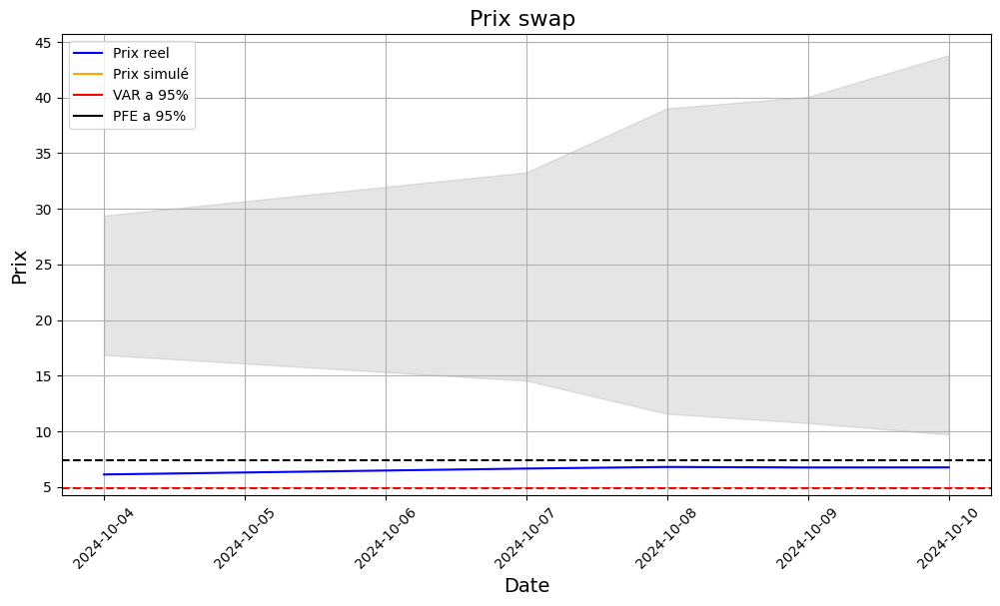

In [ ]:
swap_plot(price_portfolio, real_price_portfolio, taux_reels)

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def swap_plot(dict_simu, dict_real_price,df_taux):
  df_taux.index = pd.to_datetime(df_taux.index)
  plt.figure(figsize=(8, 4))
  line1, = plt.plot(df_taux.index, dict_real_price, color = "blue", label = "Market value reel")
  simulation_min = np.min(dict_simu, axis=0) # mettre plutot les centiles 95%
  simulation_max = np.max(dict_simu, axis=0)
  plt.fill_between(df_taux.index, simulation_min, simulation_max, color="grey", alpha=0.2, label="Enveloppe simulée")

  for i in range(1000):
    line2, = plt.plot(df_taux.index, dict_simu[i,:], color = "orange", alpha = 0.05, label = "Prix simulé")
  var_pfe = np.sort(dict_simu[:, 4]) # faire sur les 5 jours
  plt.axhline(y=var_pfe[49], color='r', linestyle='--', label='VAR a 95%')
  plt.axhline(y=var_pfe[-49], color='black', linestyle='--', label='PFE a 95%')
  handles = [Line2D([0], [0], c='blue'), Line2D([0], [0], c='orange'), Line2D([0], [0], c='r', linestyle='--'), Line2D([0], [0], c='black', linestyle='--')]
  plt.legend(handles = handles, labels = ["Prix reel", "Prix simulé", 'VAR à 95%', 'PFE à 95%'])
  plt.xticks(rotation=45)
  plt.title("Market Value swap EUR 5 ans" , fontsize=16) # Pas prix mais "Market value"
  plt.xlabel("Date", fontsize=14)
  plt.ylabel("Prix", fontsize=14)
  plt.grid(True)
  plt.show()

  return

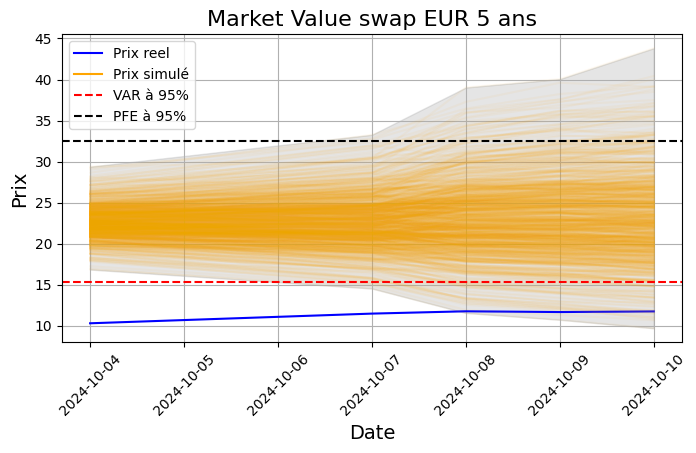

In [ ]:
swap_plot(price_portfolio, real_price_portfolio, taux_reels)

In [ ]:
# sortir les prix avec min, max moyenne, ecart type des scenarios. .describe
# code doit pricer tous les instruments du xml, et sommer leur market value, pas faire le bond mais cross currency swap.
#

In [ ]:
start_date = pd.to_datetime(prix_5_jour.to_frame().columns) # 2024-10-04

actif_a_conserver = [8, 9, 10, 11, 12]
data = vae_scena[:, actif_a_conserver, :]

swap_tx = swap(start_date, tenor = 5)
swap_tx.create_term(frequency = 1, date_conv = '30_360', fixed_float = 'fixed')
swap_tx.create_term(frequency = 2, date_conv = 'act_360', fixed_float = 'float')

price_float = np.zeros((1000, 5))
price_fixed = np.zeros((1000, 5))
price_swap = np.zeros((1000, 5))

for scenario in range(1000) :
  for date in range(5):
    taux = pd.DataFrame(data[scenario, :, date])
    swap_tx.add_fixed_leg(taux)
    swap_tx.add_floating_leg(taux, spread = 0.2)

    value_float = swap_tx.floating_leg.compute_floating_leg()
    value_fixed = swap_tx.fixed_leg.compute_fixed_leg()
    price_float[scenario, date] = value_float
    price_fixed[scenario, date] = value_fixed
    price_swap[scenario, date] = value_float - value_fixed
  print("Scenario " + str(scenario))

30_360 is not valid, please specify : Act/360 or 30/360
act_360 is not valid, please specify : Act/360 or 30/360


KeyError: 'T'

In [ ]:
start_date = pd.to_datetime(df_prix.iloc[-6].to_frame().columns) # 2024-10-03

taux_reels = df_prix.iloc[-5:, actif_a_conserver]
real_price_float = np.zeros(5)
real_price_fixed = np.zeros(5)
real_price_swap = np.zeros(5)

for i in range(5):
  taux = pd.DataFrame(taux_reels.iloc[i,:].values)
  swap_tx.add_fixed_leg(taux)
  swap_tx.add_floating_leg(taux, spread = 0.2)
  value_float = swap_tx.floating_leg.compute_floating_leg()
  value_fixed = swap_tx.fixed_leg.compute_fixed_leg()
  real_price_float[i] = value_float
  real_price_fixed[i] = value_fixed
  real_price_swap[i] = value_float - value_fixed
price_real = {'real_price_float' : real_price_float, 'real_price_fixed' : real_price_fixed, 'real_price_swap' : real_price_swap}

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def swap_plot(dict_simu, dict_real_price,df_taux):
  df_taux.index = pd.to_datetime(df_taux.index)
  plt.figure(figsize=(8, 4))
  line1, = plt.plot(df_taux.index, real_price_swap, color = "blue", label = "Prix reel")
  simulation_min = np.min(dict_simu, axis=0)
  simulation_max = np.max(dict_simu, axis=0)
  plt.fill_between(df_taux.index, simulation_min, simulation_max, color="grey", alpha=0.2, label="Enveloppe simulée")

  for i in range(1000):
    line2, = plt.plot(df_taux.index, price_swap[i,:], color = "orange", alpha = 0.05, label = "Prix simulé")
  var_pfe = np.sort(price_swap[:, 4])
  plt.axhline(y=var_pfe[49], color='r', linestyle='--', label='VAR a 95%')
  plt.axhline(y=var_pfe[-49], color='black', linestyle='--', label='PFE a 95%')
  handles = [Line2D([0], [0], c='blue'), Line2D([0], [0], c='orange'), Line2D([0], [0], c='r', linestyle='--'), Line2D([0], [0], c='black', linestyle='--')]
  plt.legend(handles = handles, labels = ["Prix reel", "Prix simulé", 'VAR à 95%', 'PFE à 95%'])
  plt.xticks(rotation=45)
  plt.title("Prix swap USD 5 ans" , fontsize=16)
  plt.xlabel("Date", fontsize=14)
  plt.ylabel("Prix", fontsize=14)
  plt.grid(True)
  plt.show()

  return

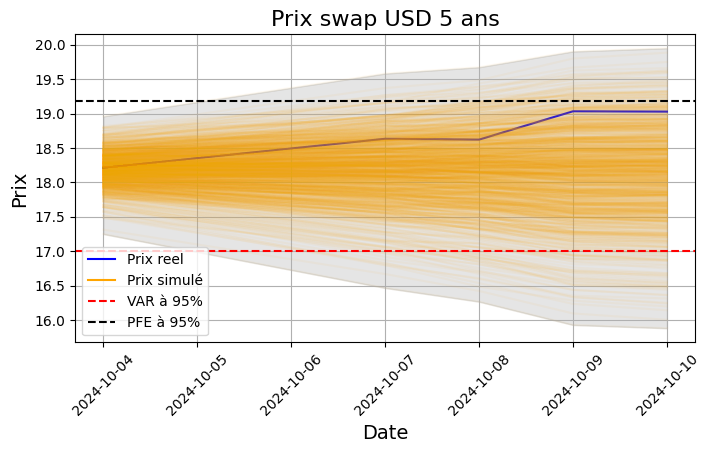

In [ ]:
swap_plot(price_swap, real_price_swap, taux_reels)

# Code final

## Code VAE

In [ ]:
import numpy as np
import pandas as pd
import yfinance as yf
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, InputLayer
from tensorflow.keras.utils import plot_model
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras import backend as K
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy.stats import wasserstein_distance
import seaborn as sns
from pandas.tseries.holiday import USFederalHolidayCalendar
from pandas.tseries.offsets import CustomBusinessDay
from tensorflow.keras import Model, Input
from tensorflow.keras.layers import Dense, InputLayer, Lambda
from matplotlib import _pylab_helpers
from matplotlib.backends.backend_pdf import PdfPages


class vae:

  def __init__(self, df_rendements, df_prix):
    self.df_rendements = df_rendements
    self.df_prix = df_prix
    self.vae_loss = None
    self.historique = None
    self.predict_vae_yield = None
    self.predict_vae_price = None
    self.vae_scenarios = None

  def train_vae(self):

    df_rendements = self.df_rendements
    df_prix = self.df_prix

    donnees_brutes_0 = df_rendements.values.astype('float32')
    donnees_brutes = df_rendements[:-5].values.astype('float32') # On enlève les 5 derniers prix car on veut faire une simulation sur 5 jours

    prix_initiaux = df_prix.head(1)
    prix_5_jour = df_prix.iloc[-5]
    premier_jour = prix_initiaux.index.values[0]

    nb_jours, nb_actifs = donnees_brutes.shape  # Extraction du nombre de jours et d'actifs
    nb_donnees = nb_jours * nb_actifs  # Calcul du nombre total de données
    nb_jours_a_sequencer = 5 #20  # Définition du nombre de jours pour la séquence
    longueur_sequence = nb_jours_a_sequencer * nb_actifs  # Calcul de la longueur d'une séquence
    nb_sequence = nb_donnees//longueur_sequence
    reste_a_retirer=nb_donnees % longueur_sequence
    indice_de_retrait = reste_a_retirer // nb_actifs # Retirer les données les plus anciennes pour obtenir un découpage net.
    donnees_brutes=donnees_brutes[indice_de_retrait:]
    scaler = MinMaxScaler()
    donnees_normalisees = scaler.fit_transform(donnees_brutes) #plus tard, pour récupérer cette forme de données, on utilisera:
    donnees_reshaped=donnees_normalisees.reshape(nb_sequence,longueur_sequence)
    input_dim = donnees_reshaped.shape[1]
    input_dim=longueur_sequence #nombre de données dans une séquence

    dim_latent = input_dim//5
    acti_func = 'relu'
    acti_func2 = 'tanh'
    # Exemples de fonctions d'activation non linéaires: relu, sigmoid, tanh, softmax, softplus, softsign, elu, selu, prelu, thresholded_relu, swish

    # Partie 1 : Encodeur

    # Définition de l'encodeur
    input_layer = Input(shape=(input_dim,), name="couche_entree")
    encoder_output = Dense(input_dim//2, activation=acti_func, name="couche_encoder")(input_layer)
    encoder_output = Dense(input_dim//3, activation=acti_func2, name="couche_encoder1")(encoder_output)
    encoder_output = Dense(input_dim//4, activation=acti_func, name="couche_encoder2")(encoder_output)
    # Ajout de la moyenne et de la log-variance pour l'espace latent
    z_mean = Dense(dim_latent, activation=acti_func, name="z_mean")(encoder_output) # Mettre la dimension optimisé pour AE sur l'espace latent.
    z_log_var = Dense(dim_latent, activation=acti_func, name="z_log_var")(encoder_output)

    def sample(args):
        z_mean, z_log_var = args
        epsilon = K.random_normal(shape=K.shape(z_mean), mean=0., stddev=1.)
        return z_mean + K.exp(0.5 * z_log_var) * epsilon

    z = Lambda(sample, name='sample')([z_mean, z_log_var])

    # Création du modèle encodeur
    encoder = Model(inputs=input_layer, outputs=[z_mean, z_log_var, z], name="Encoder")

    # ----------------------------------------------------- #

    # Partie 2 : Decodeur

    # Définition du décodeur
    decoder_input = Input(shape = (dim_latent,), name="input_decoder")
    decoder_output = Dense(input_dim//4, activation=acti_func, name="couche_decoder3")(decoder_input)
    decoder_output = Dense(input_dim//3, activation=acti_func2, name="couche_decoder2")(decoder_output)
    decoder_output = Dense(input_dim//2, activation=acti_func, name="couche_decoder1")(decoder_output)
    decoder_output = Dense(input_dim , activation='linear', name="couche_sortie")(decoder_output)

    # Création du modèle décodeur
    decoder = Model(inputs=decoder_input, outputs=decoder_output, name="Decoder")

    # ----------------------------------------------------- #

    # Partie 3: Auto-encodeur = Regroupement de l'encodeur et du décodeur

    # Construction de l'autoencodeur en combinant encodeur et décodeur
    autoencoder_input = Input(shape=(input_dim,), name="input_autoencodeur")
    z_mean, z_log_var, z  = encoder(autoencoder_input)
    decoded = decoder(z)

    # Création du modèle autoencodeur complet
    modele = Model(inputs=autoencoder_input, outputs=decoded, name="VAE")

    beta = 1.2

    # Définition de la fonction de perte
    def vae_loss(inputs, outputs):
        # Calcul de la perte de reconstruction
        z_mean, z_log_var, z  = encoder(inputs)
        reconstruction_loss = K.mean(K.square(inputs - outputs), axis=-1)
        divergence_kl = -0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis= -1)
        return reconstruction_loss + beta*divergence_kl

    # Compilation du modèle avec la fonction de perte personnalisée
    modele.compile(optimizer='adam', loss=vae_loss, metrics = ["mse"])
    #Paramètre pouvant être modifié
    notre_taille_de_lot = 32
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',     # Metric to monitor
        patience=5,             # Stop after 5 epochs with no improvement
        min_delta=0.001,        # Minimum improvement to qualify as a better epoch
        restore_best_weights=True  # Restore weights from the best epoch
    )

    # Entraînement du modèle
    historique = modele.fit(donnees_reshaped, donnees_reshaped, epochs=100, batch_size=notre_taille_de_lot,callbacks=[early_stopping], validation_split=0.2, shuffle=False, verbose=0)
    # Extraction des dernières valeurs de perte
    # fig, ax = plt.subplots(figsize=(14, 8))
    # perte=list(pd.DataFrame(historique.history)[['loss','val_loss']].iloc[-1])
    # ax.plot(historique.history['loss'], label='Perte (entraînement)')
    # ax.plot(historique.history['val_loss'], label='Perte (validation)')
    # ax.set_xlabel("Époque"+ f'\n\nValeurs finales pour MSE: Loss= {perte[0]:.4f} et val_loss = {perte[1]:.4f}', fontsize=12)
    # ax.set_ylabel("Perte", fontsize=12)
    # ax.set_title("Évolution de la perte d'entraînement et de validation", fontsize=12)
    # ax.legend()
    # self.vae_loss = plt
    # plt.close(fig)

    # Obtenir les prédictions sur les données d'entrée
    predictions = modele.predict(donnees_reshaped, verbose = 0)
    # Redimensionner les données pour revenir à leur forme d'origine
    donnees_reelles = donnees_reshaped.reshape(-1, nb_actifs)  # nb_actifs : nombre d'actifs dans notre base de données
    donnees_predites = predictions.reshape(-1, nb_actifs)

    # Ce bloc vise à remettre à l'échelle nos données puis à dénormaliser
    donnees_reelles=scaler.inverse_transform(donnees_reelles)
    donnees_predites=scaler.inverse_transform(donnees_predites)

    # rendements relatifs
    stocks = prix_initiaux[['sp500', 'Eurostock', 'EURUSD']]
    prix_predits_re = stocks.values*np.cumprod(donnees_predites[:,:3] + 1, axis=0)
    prix_reels_re = stocks.values*np.cumprod(donnees_reelles[:,:3] + 1, axis=0)

    # rendements absolut
    taux = prix_initiaux[prix_initiaux.columns[~prix_initiaux.columns.isin(['sp500', 'Eurostock', 'EURUSD'])]]
    prix_predits_abs = taux.values + np.cumsum(donnees_predites[:,3:] , axis=0)
    prix_reels_abs = taux.values + np.cumsum(donnees_reelles[:,3:] , axis=0)

    prix_reels = np.concatenate((prix_reels_re, prix_reels_abs), axis = 1)
    prix_predits = np.concatenate((prix_predits_re, prix_predits_abs), axis = 1)

    # predict_rdt = {}
    # for numero_actif in range(len(prix_initiaux.columns)):
    #   reel_actif = donnees_reelles[:, numero_actif]  # Colonne correspondant au numéro de l'actif pour le premier actif
    #   pred_actif = donnees_predites[:, numero_actif]  # Colonne correspondant au numéro de l'actif pour les prédictions
    #   # Créer un calendrier de jours ouvrés personnalisé
    #   us_business_day = CustomBusinessDay(calendar=USFederalHolidayCalendar())
    #   date_index = pd.date_range(start=premier_jour, periods=len(reel_actif), freq=us_business_day) #premier_jour : date de vos prix initiaux
    #   # Tracer les courbes des valeurs réelles et prédites pour le premier actif
    #   fig, ax = plt.subplots(figsize=(14, 8))
    #   ax.plot(date_index,reel_actif, label='Valeurs réelles', color='blue')
    #   ax.plot(date_index,pred_actif, label='Valeurs prédites', color='orange', linestyle='--')
    #   ax.set_title("Comparaison des rendements réels vs prédits", fontsize=16)
    #   ax.set_xlabel("Date", fontsize=14)
    #   ax.set_ylabel("Rendements", fontsize=14)
    #   ax.legend()
    #   ax.grid(True)
    #   predict_rdt[numero_actif] = plt
    #   plt.close(fig)
    # self.predict_vae_yield = predict_rdt

    # predict_price = {}
    # for numero_actif in range(len(prix_initiaux.columns)):
    #   fig, ax = plt.subplots(figsize=(14, 8))
    #   ax.plot(date_index, prix_reels[:, numero_actif], label='Prix réels', color='blue')
    #   ax.plot(date_index, prix_predits[:, numero_actif], label='Prix prédits', color='orange', linestyle='--')
    #   ax.set_title("Prix réels vs prédits " + str(col_names[numero_actif]), fontsize=16)
    #   ax.set_xlabel("Date", fontsize=14)
    #   ax.set_ylabel("Prix", fontsize=14)
    #   ax.legend()
    #   ax.grid(True)
    #   predict_price[numero_actif] = fig
    #   plt.close(fig)  # Close the plot to prevent it from displaying
    # self.predict_vae_price = predict_price

    nb_scenarios = 1000
    vect_norm = np.random.normal(loc=0, scale=1, size = (nb_scenarios, dim_latent)) # Vecteur de loi normale
    sc = decoder.predict(vect_norm, verbose = 0) # Passer dans décodeur
    np_scena = sc.reshape(-1, 13) # Redimentionner pour pouvoir rescaler nos valeurs
    scena = scaler.inverse_transform(np_scena) # on retrouve nos rendements prédits
    scenarios = scena.reshape(nb_scenarios, 13, nb_jours_a_sequencer)

    # Appliquer les shocks sur le 5ieme prix le plus récent pour tous les actifs
    taux_5_last = prix_5_jour.values[np.newaxis, 3:, np.newaxis] # 5ieme taux en partant de la fin
    taux = taux_5_last + np.cumsum(scenarios[:,3:,:], axis = 2) # Appliquer les shocks sur 5 jours 1000 fois
    stock_5_last = prix_5_jour.values[np.newaxis, :3, np.newaxis] # 5ieme prix des actions en partant de la fin
    stock = stock_5_last*np.cumprod((1 + scenarios[:,:3,:]), axis = 2)
    vae_scena = np.concatenate([stock, taux], axis = 1) # on a un numpy array de dimension 1000x13x5. Donc 1000 scenarios, 13 actifs et 5 jours de simu
    self.vae_scenarios = vae_scena



## Code swap pricer

In [ ]:
from datetime import datetime
from numba import njit
from dateutil.relativedelta import relativedelta
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.backends.backend_pdf import PdfPages


class price_swap:

  def __init__(self, start_date, tenor):
    self.start_date = start_date
    self.tenor = tenor

  def day_count_30_360(self, end):
    start  = self.start_date
    Y1, M1, D1 = start.year, start.month, start.day
    Y2, M2, D2 = end.year, end.month, end.day
    if D1 == 31:
        D1 = 30
    if D2 == 31 and D1 == 30:
        D2 = 30
    days = (Y2 - Y1) * 360 + (M2 - M1) * 30 + (D2 - D1)
    return days/360

  def day_count_act_360(self, end):
    start = self.start_date
    T = (end-start_date)
    return T.days/360

  def floating_grid(self, scenarios, frequency, spread, date_conv):
    start_date = self.start_date
    dates = [
    (start_date + relativedelta(months=12 * i // frequency))
    for i in range(self.tenor * frequency + 1)]

    if date_conv == 'Act/360':
      T = np.array([self.day_count_act_360(x) for x in dates if x != start_date])[:,0]
    elif date_conv == '30/360':
      T = np.array([self.day_count_30_360(x) for x in dates if x != start_date])[:,0]
    else:
      print(f"{date_conv} is not valid, please specify : Act/360 or 30/360")

    rate_grid = np.array([
        np.interp(T, [0.25, 1, 5, 10, 30], scenarios[i, :, j])
        for i in range(scenarios.shape[0])
        for j in range(scenarios.shape[2])
    ])

    rate_grid = np.stack([rate_grid[i:i+len(scenarios)] for i in range(0, len(scenarios)*5, len(scenarios))], axis=2)

    # Calcul des cash flows
    T1 = np.tile(T[1:], (len(scenarios), len(scenarios[0,0,:]), 1)).transpose(0, 2, 1)
    T2 = np.tile(T[:-1], (len(scenarios), len(scenarios[0,0,:]), 1)).transpose(0, 2, 1)
    diff_T = np.tile(1/(T[1:] - T[:-1]), (len(scenarios), len(scenarios[0,0,:]), 1)).transpose(0, 2, 1)

    cf_grid = np.array(((((1 + rate_grid[:,1:,:])**T1)/((1 + rate_grid[:,:-1, :])**T2)))**diff_T - 1 + spread)
    cf_grid = np.insert(cf_grid, 0, rate_grid[:,0,:] + spread, axis=1)

    # Calcul du discount factor
    exp = np.tile(T, (len(scenarios), 1))
    exp = np.repeat(exp[:,:, np.newaxis], 5, axis = 2)
    df = np.array((1 + rate_grid/100))** - exp

    # Calcul de la PV
    pv = cf_grid * df
    price = np.sum(pv, axis = 1)

    return price

  def fixed_grid(self, scenarios, frequency, coupon, date_conv):
    start_date = self.start_date
    dates = [
    (start_date + relativedelta(months=12 * i // frequency))
    for i in range(self.tenor * frequency + 1)]

    if date_conv == 'Act/360':
      T = np.array([self.day_count_act_360(x) for x in dates if x != start_date])
    elif date_conv == '30/360':
      T = np.array([self.day_count_30_360(x) for x in dates if x != start_date])
    else:
      print(f"{date_conv} is not valid, please specify : Act/360 or 30/360")

    # Interpoler les taux
    rate_grid = np.array([
        np.interp(T, [0.25, 1, 5, 10, 30], scenarios[i, :, j])
        for i in range(scenarios.shape[0])
        for j in range(scenarios.shape[2])
    ]).reshape(len(scenarios), len(T), len(scenarios[0,0,:]))

    # Calcul du discount factor
    exp = np.tile(T, (len(scenarios), 1))
    exp = np.repeat(exp[:,:, np.newaxis], 5, axis = 2)
    df = np.array((1 + rate_grid/100))** - exp

    # Calcul de la PV
    pv = coupon *  df
    price = np.sum(pv, axis = 1)

    return price

def swap_plot(price_simu, real_price, df_taux):
  df_taux.index = pd.to_datetime(df_taux.index)
  plt.figure(figsize=(8, 4))
  line1, = plt.plot(df_taux.index, real_price, color = "blue", label = "Prix reel")
  simulation_min = np.min(price_simu, axis=0)
  simulation_max = np.max(price_simu, axis=0)
  plt.fill_between(df_taux.index, simulation_min, simulation_max, color="grey", alpha=0.2, label="Enveloppe simulée")

  for i in range(1000):
    line2, = plt.plot(df_taux.index, price_simu[i,:], color = "orange", alpha = 0.05, label = "Prix simulé")
  var_pfe = np.sort(price_simu,axis=0)
  plt.plot(df_taux.index, var_pfe[49, :], color = "red", linestyle='--', alpha = 1, label = "VAR a 95%")
  plt.plot(df_taux.index, var_pfe[-49, :], color = "black", linestyle='--', alpha = 1, label = "PFE a 95%")
  handles = [Line2D([0], [0], c='blue'), Line2D([0], [0], c='orange'), Line2D([0], [0], c='r', linestyle='--'), Line2D([0], [0], c='black', linestyle='--')]
  plt.legend(handles = handles, labels = ["Prix reel", "Prix simulé", 'VAR à 95%', 'PFE à 95%'])
  plt.xticks(rotation=45)
  plt.title("Market Value swaps" , fontsize=16)
  plt.xlabel("Date", fontsize=14)
  plt.ylabel("Prix", fontsize=14)
  plt.grid(True)
  fichier_pdf = f'/content/drive/MyDrive/SharedData/var_swap.pdf'
  with PdfPages(fichier_pdf) as pdf:
    plt.savefig(fichier_pdf)
  plt.show()

  return

## Code XML scrapper

In [ ]:
import xml.etree.ElementTree as ET
import numpy as np
import pandas as pd
from itertools import zip_longest

def scrape_xml(file_path):

  tree = ET.parse(file_path)
  root = tree.getroot()
  fields = ['currency', 'fixedrateleg', 'startdate', 'maturitydate', 'frequency', 'daycount', 'couponrates',
            'referenceindex', 'spreads', 'side']
  dict_fixed = {}
  dict_float = {}

  def print_xml(element, level=0):
      if element.tag == 'description':
        dict_fixed.setdefault('description', []).append(element.text)
        dict_float.setdefault('description', []).append(element.text)

      if element.tag == "fixedrateleg":
        dict_fixed.setdefault('type', []).append('fixed')
        element_kid = {x.tag: x.text for x in element}
        for item in fields:
          if item not in element_kid.keys():
            dict_fixed.setdefault(item, []).append(np.nan)
          else:
            dict_fixed.setdefault(item, []).append(element_kid[item])
      elif element.tag == "floatingrateleg":
        dict_float.setdefault('type', []).append('floating')
        element_kid = {x.tag: x.text for x in element}
        for item in fields:
          if item not in element_kid.keys():
            dict_float.setdefault(item, []).append(np.nan)
          else:
            dict_float.setdefault(item, []).append(element_kid[item])

      for child in element:
          print_xml(child, level + 1)

  print_xml(root)
  dict_fixed['description'] = dict_fixed['description'][:-1]
  dict_float['description'] = dict_float['description'][:-1]
  swap_data = {key: dict_fixed[key] + dict_float[key] for key in dict_fixed.keys()}
  df_swap = pd.DataFrame(swap_data)
  df_swap['tenor'] = ((pd.to_datetime(df_swap['maturitydate']) - pd.to_datetime(df_swap['startdate'])).dt.days / 365.25).round()
  df_swap.set_index(df_swap.type, inplace = True)
  return df_swap

## Compilation

In [ ]:
rendements = '/content/drive/MyDrive/SharedData/data_assets_ren.csv'
prix = '/content/drive/MyDrive/SharedData/data_assets.csv'
xml = '/content/drive/MyDrive/SharedData/InstrumentsT_C.xml'
df_prix = pd.read_csv(prix, index_col = 0)
df_rendements = pd.read_csv(rendements, index_col = 0)
swap_data = scrape_xml(xml)

In [ ]:
def risk_swap(df_rendements, df_prix, swap_data):

  model_vae = vae(df_rendements, df_prix)
  model_vae.train_vae()

  start_date = pd.to_datetime(df_prix.iloc[-5].to_frame().columns)
  actif_a_conserver = [3, 4, 5, 6, 7]

  data = model_vae.vae_scenarios[:, actif_a_conserver, :]

  # taux reels
  df_taux_reel = df_prix.iloc[-5:, actif_a_conserver]
  array_tx = np.array(df_taux_reel)
  taux_reels = np.tile(array_tx, (1, 1, 1)).transpose(0,2,1)

  # Swap simple
  simple_swap = swap_data[swap_data["description"] == "Sample interest-rate swap"]
  simple_swap = simple_swap.to_dict()
  tenor = int(simple_swap['tenor']['fixed']/2)
  # Price swap simple scenarios
  swap = price_swap(start_date[0], tenor)
  f = swap.floating_grid(data, int(simple_swap['frequency']['floating']), float(simple_swap['spreads']['floating'])*100, simple_swap['daycount']['floating'])
  r = swap.fixed_grid(data, int(simple_swap['frequency']['fixed']), float(simple_swap['couponrates']['fixed']) * 100, simple_swap['daycount']['fixed'])
  # Price swap simple avec taux reels
  real_swap = price_swap(start_date[0], tenor)
  real_f = real_swap.floating_grid(taux_reels, int(simple_swap['frequency']['floating']), float(simple_swap['spreads']['floating'])*100, simple_swap['daycount']['floating'])
  real_r = real_swap.fixed_grid(taux_reels, int(simple_swap['frequency']['fixed']), float(simple_swap['couponrates']['fixed']) * 100, simple_swap['daycount']['fixed'])
  # Market value
  if simple_swap['side']['fixed'] == "Receive":
    price_swp = r - f
    real_price_swp = real_r - real_f
  else:
    price_swp = f - r
    real_price_swp = real_f - real_r

  # Swap ccy
  ccy_swap = swap_data[swap_data["description"] == "Sample cross currency interest-rate swap"]
  taux_usd_eur = df_prix.iloc[-5, 2]
  ccy_swap = ccy_swap.to_dict()
  tenor = int(ccy_swap['tenor']['fixed']/2)
  # Price swap ccy scenarios
  swap = price_swap(start_date[0], tenor)
  f = swap.floating_grid(data, int(ccy_swap['frequency']['floating']), float(ccy_swap['spreads']['floating'])*100, ccy_swap['daycount']['floating'])
  r = swap.fixed_grid(data, int(ccy_swap['frequency']['fixed']), float(ccy_swap['couponrates']['fixed']) * 100, ccy_swap['daycount']['fixed'])
  r = r/taux_usd_eur
  # Price swap ccy taux reels
  real_swap = price_swap(start_date[0], tenor)
  real_f = real_swap.floating_grid(taux_reels, int(ccy_swap['frequency']['floating']), float(ccy_swap['spreads']['floating'])*100, ccy_swap['daycount']['floating'])
  real_r = real_swap.fixed_grid(taux_reels, int(ccy_swap['frequency']['fixed']), float(ccy_swap['couponrates']['fixed']) * 100, ccy_swap['daycount']['fixed'])
  real_r = real_r/taux_usd_eur
  # Market value
  if ccy_swap['side']['fixed'] == "Receive":
    price_ccy = r - f
    real_price_ccy = real_r - real_f
  else:
    price_ccy = f - r
    real_price_ccy = real_f - real_r

  Market_value_swap =  price_swp + price_ccy
  real_Market_value_swap = real_price_swp  + real_price_ccy
  swap_plot(Market_value_swap, real_Market_value_swap[0], df_taux_reel)
  return

# Run

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


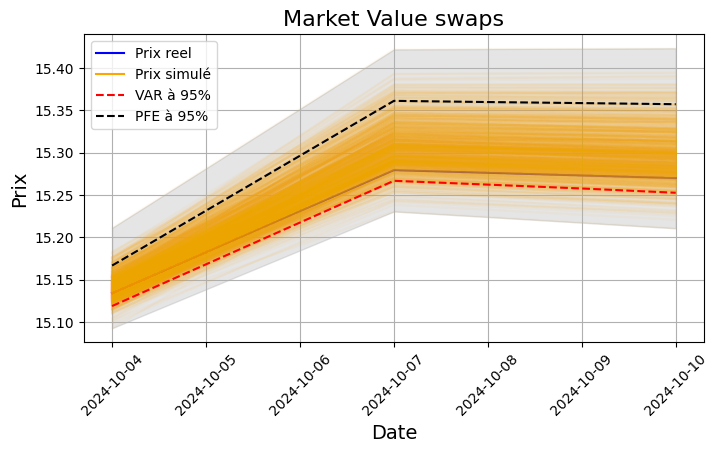

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


rendements = '/content/drive/MyDrive/SharedData/data_assets_ren.csv'
prix = '/content/drive/MyDrive/SharedData/data_assets.csv'
xml = '/content/drive/MyDrive/SharedData/InstrumentsT_C.xml'
df_prix = pd.read_csv(prix, index_col = 0)
df_rendements = pd.read_csv(rendements, index_col = 0)
swap_data = scrape_xml(xml)

risk_swap(df_rendements, df_prix, swap_data)
